**Задание**

1. Скачайте и распакуйте "акционный" датасет (ссылка: https://storage.yandexcloud.net/terraai/sources/shares.zip)
2. Выберите любой файл с датасетом, разделите датасет на тренировочную и проверочную выборки, найдите лучшую модель, визуализируйте график предикта.
3. Проведите серию обучений. На каждом шаге:
  а). добавляете к тренировочной выборке по N экземпляров из проверочной выборки,
  б). уменьшаете проверочную выборку на соответсвующее количество экземпляров,
  в). инициализируете новую модель и обучаете ее на тренировочной выборке из пункта а),  
  г). сохраняете N последующих значений предикта на проверочной выборке из пункта б).
  Выберите число N экспериментально, исходя из размера проверочной выборки и адекватного времени на обучение.
4. "Склейте" все полученные интервалы предикта в один массив.
5. На одном графике визуализируйте проверочную выборку, результат одной модели из п.2 и результат составного массива.  
6. Сделайте вывод

In [1]:
# Ваше решение

In [ ]:
!pip -q install pandas==1.5.3 # Может потребовать перезапуск среды. Продолжайте работать или с перезапуском или без него.
!pip -q install "dask[dataframe,distributed]" --no-deps
!pip -q install "distributed==2022.2.0"
!pip -q install GPUtil
!pip -q install auto-ts pmdarima --no-deps --ignore-installed


# Подключение библиотек
import numpy as np
import pandas as pd
from auto_ts import auto_timeseries
from auto_ts import print_ts_model_stats
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [8]:
# For VSCode
%pip install --upgrade pip
%pip install pandas==1.5.3
%pip install "dask[dataframe,distributed]"
%pip install "distributed==2022.2.0"
%pip install GPUtil
%pip uninstall auto-ts -y
%pip install --no-cache-dir auto-ts pmdarima
%pip install --no-cache-dir auto-ts
%python -m pip install auto-ts
%pip install auto-ts pmdarima
from auto_ts import auto_timeseries

import numpy as np
import pandas as pd
from auto_ts import auto_timeseries
from auto_ts import print_ts_model_stats
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


   ---------------------------------------- 0.0/13.3 MB ? eta -:--:--
   - -------------------------------------- 0.5/13.3 MB 2.4 MB/s eta 0:00:06
   --- ------------------------------------ 1.3/13.3 MB 4.5 MB/s eta 0:00:03
   --------- ------------------------------ 3.1/13.3 MB 5.3 MB/s eta 0:00:02
   -------------- ------------------------- 5.0/13.3 MB 6.0 MB/s eta 0:00:02
   ------------------ --------------------- 6.0/13.3 MB 5.9 MB/s eta 0:00:02
   ---------------------- ----------------- 7.6/13.3 MB 6.2 MB/s eta 0:00:01
   ---------------------------- ----------- 9.4/13.3 MB 6.6 MB/s eta 0:00:01
   --------------------------------- ------ 11.3/13.3 MB 6.9 MB/s eta 0:00:01
   ---------------------------------------- 13.3/13.3 MB 7.1 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


UsageError: Line magic function `%python` not found (But cell magic `%%python` exists, did you mean that instead?).


In [ ]:
import gdown
URL = 'https://storage.yandexcloud.net/terraai/sources/shares.zip'
download_filename = gdown.download(URL, None, quiet = True)
!unzip -q {download_filename} -d '/content/data'
!rm -rf {download_filename} sample_data

In [3]:
#df = pd.read_csv('data/bitcoin.csv')
import pandas as pd
df = pd.read_csv('C://Users//Vlada//Documents//Business//AI//bitcoin.csv')
df.head(3)
print(df.head(3))
df.columns = df.columns.str.replace('<', '').str.replace('>', '').str.strip()
print(df.columns)

   Unix Timestamp            Date  Symbol      Open      High       Low  \
0    1.618880e+12  4/20/2021 0:02  BTCUSD  55717.47  55723.00  55541.69   
1    1.618880e+12  4/20/2021 0:01  BTCUSD  55768.94  55849.82  55711.74   
2    1.618880e+12  4/20/2021 0:00  BTCUSD  55691.79  55793.15  55691.79   

      Close    Volume  
0  55541.69  2.406734  
1  55717.47  0.573458  
2  55768.94  3.309904  
Index(['Unix Timestamp', 'Date', 'Symbol', 'Open', 'High', 'Low', 'Close',
       'Volume'],
      dtype='object')


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 658065 entries, 0 to 658064
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unix Timestamp  658065 non-null  float64
 1   Date            658065 non-null  object 
 2   Symbol          658065 non-null  object 
 3   Open            658065 non-null  float64
 4   High            658065 non-null  float64
 5   Low             658065 non-null  float64
 6   Close           658065 non-null  float64
 7   Volume          658065 non-null  float64
dtypes: float64(6), object(2)
memory usage: 40.2+ MB


Importing plotly failed. Interactive plots will not work.


Imported auto_timeseries version:0.0.92. Call by using:
model = auto_timeseries(score_type='rmse',
        time_interval='M', non_seasonal_pdq=None, seasonality=False,
        seasonal_period=12, model_type=['best'], verbose=2, dask_xgboost_flag=0)
model.fit(traindata, ts_column,target)
model.predict(testdata, model='best')

Unix Timestamp    0
Date              0
Open              0
High              0
Low               0
Close             0
Volume            0
dtype: int64
Start of Fit.....
    Target variable given as = Close
Start of loading of data.....
    Inputs: ts_column = Date, sep = ,, target = ['Close']
    Using given input: pandas dataframe...
    Date column exists in given train data...
    train data shape = (600000, 6)
Alert: Could not detect strf_time_format of Date. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Data is stationary after one differencing
There

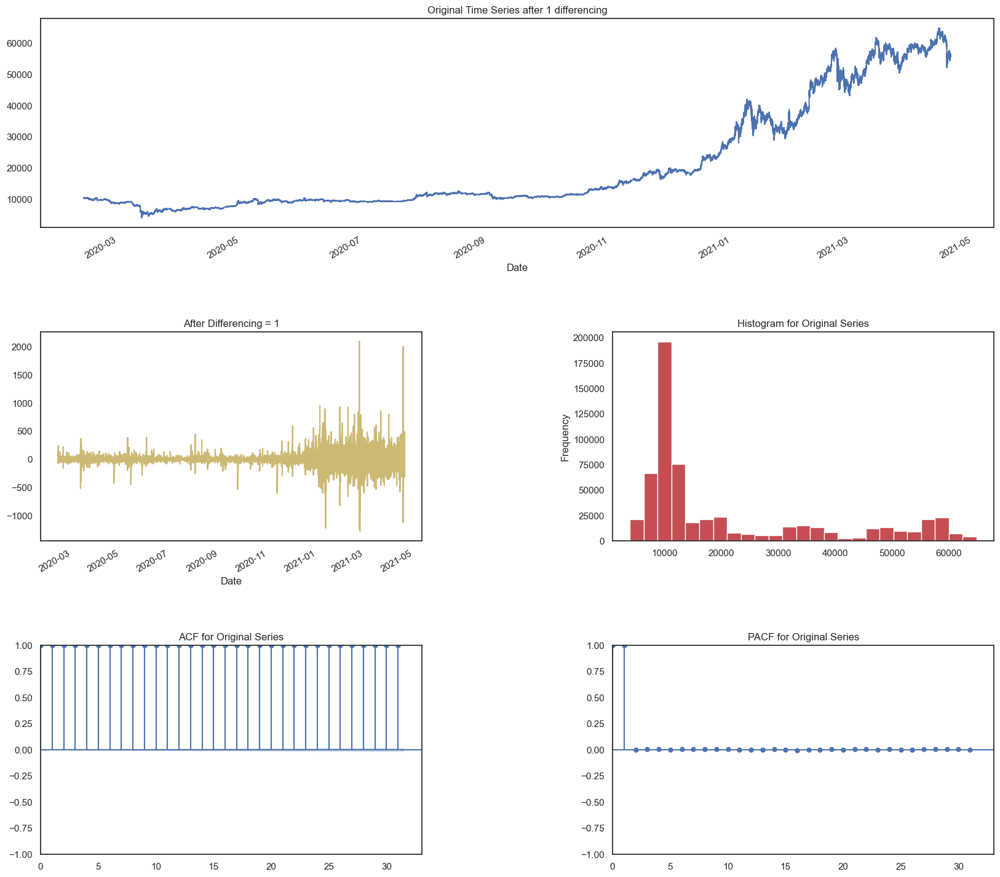

Time Interval is given as M
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(600000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 599975 Test Shape: 5


23:31:31 - cmdstanpy - INFO - Chain [1] start processing
23:31:56 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 75,400.60
    Std Deviation of actuals = 9.38
    Normalized RMSE (as pct of std dev) = 803844%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 599980 Test Shape: 5


23:33:30 - cmdstanpy - INFO - Chain [1] start processing
23:33:54 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 75,639.71
    Std Deviation of actuals = 7.92
    Normalized RMSE (as pct of std dev) = 955155%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 599985 Test Shape: 5


23:35:29 - cmdstanpy - INFO - Chain [1] start processing
23:35:53 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 74,313.30
    Std Deviation of actuals = 5.33
    Normalized RMSE (as pct of std dev) = 1394284%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 599990 Test Shape: 5


23:37:28 - cmdstanpy - INFO - Chain [1] start processing
23:37:53 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 76,342.06
    Std Deviation of actuals = 2.11
    Normalized RMSE (as pct of std dev) = 3625704%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 599995 Test Shape: 5


23:39:27 - cmdstanpy - INFO - Chain [1] start processing
23:39:52 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 77,502.68
    Std Deviation of actuals = 1.93
    Normalized RMSE (as pct of std dev) = 4011969%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 74729.35
    MSE (Mean Squared Error = 5752771698.96
    MAPE (Mean Absolute Percent Error) = 719%
    RMSE (Root Mean Squared Error) = 75847.0283
    Normalized RMSE (MinMax) = 96694%
    Normalized RMSE (as Std Dev of Actuals)= 309773%
Time Taken = 595 seconds


23:41:26 - cmdstanpy - INFO - Chain [1] start processing
23:41:50 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 599975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6033711.684
Static Forecasts:
    RMSE = 19.74
    Std Deviation of Actuals = 9.38
    Normalized RMSE (as pct of std dev) = 210.4%

Fold Number: 2 --> Train Shape: 599980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6033757.426
Static Forecasts:
    RMSE = 15.50
    Std Deviation of Actuals = 7.92
    Normalized RMSE (as pct of std dev) = 195.8%

Fold Number: 3 --> Train Shape: 599985 Test Shape: 5

   

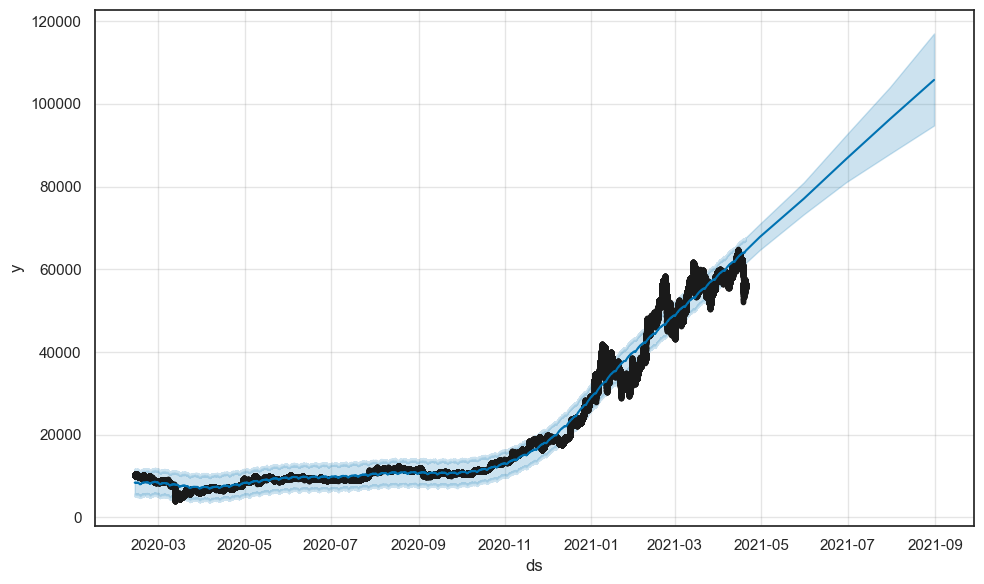

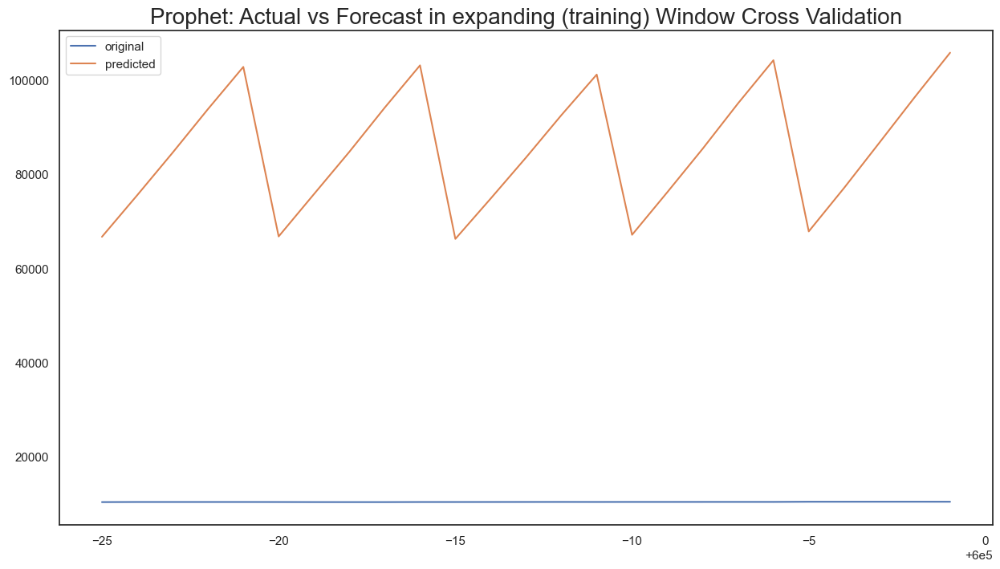

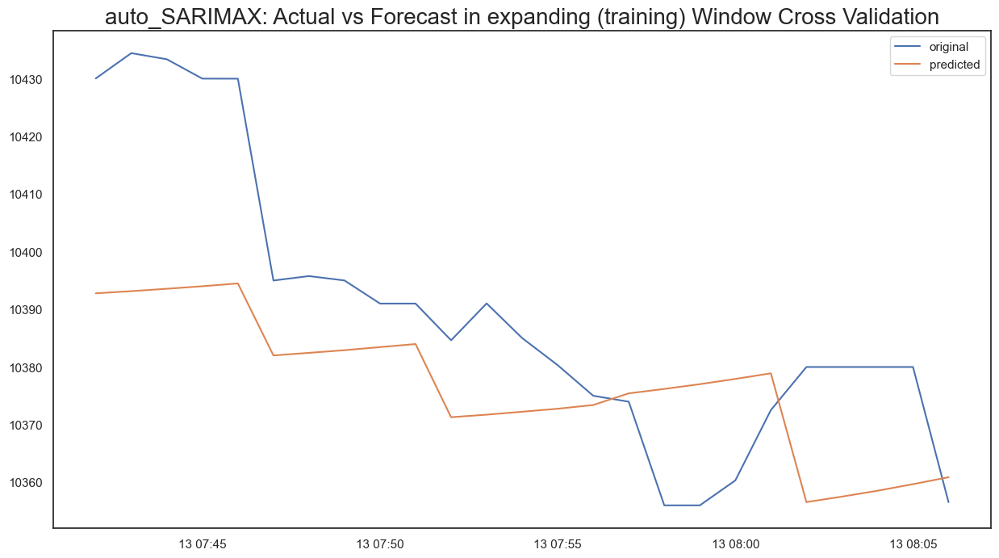

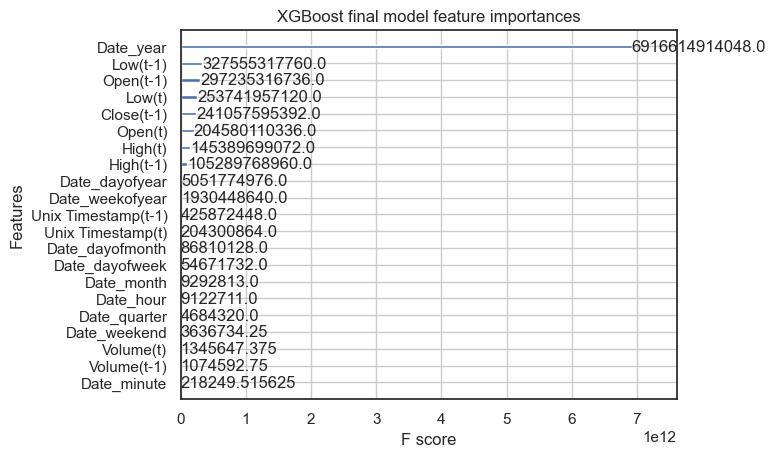

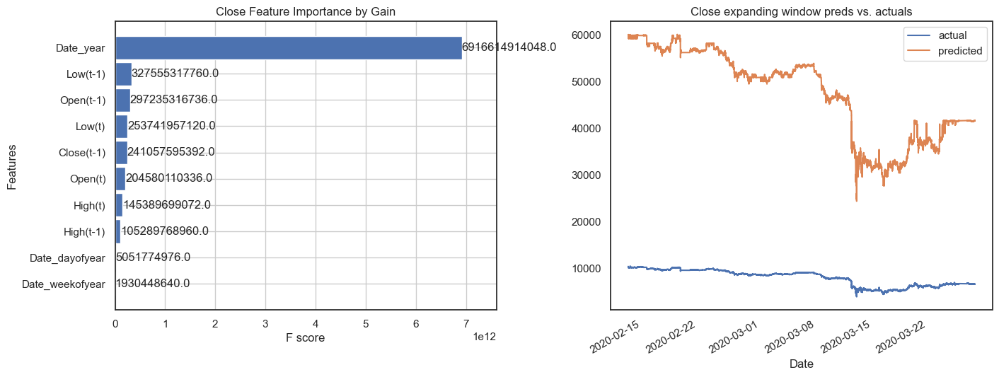

In [9]:
# For VSCode

from auto_ts import auto_timeseries
from auto_ts import print_ts_model_stats
# Создание обучающей и проверочной выборок
train, val = df.iloc[:600000], df.iloc[600000:]

# Удаляем ненужный столбец
train = train.drop(columns=['Symbol'], errors='ignore')

# Преобразуем дату
train['Date'] = pd.to_datetime(train['Date'])

model = auto_timeseries(score_type='rmse',   # функция потерь
                        time_interval='M',   # дневной интервал
                        model_type='best',   # сохраняем лучшую модель
                        verbose=1)

# Проверяем NaN в данных
print(train.isna().sum())

# Обучаем модель
model.fit(traindata=train, ts_column='Date', target='Close')

In [ ]:
model = auto_timeseries(score_type='rmse',   # функция потерь
                        time_interval='D',   # дневной интервал
                        model_type='best',   # сохраняем лучшую модель
                        verbose=1)

# Создание обучающей и проверочной выборок
train, val = df.iloc[:600000], df.iloc[600000:]

train['Date'] = pd.to_datetime(train['Date'])

# Обучение модели
model.fit(traindata=train,      # на выборке train
          ts_column='Date',   # колонка с временными отсчетами
          target='Close')     # целевая колонка



In [17]:
# Вывод параметров лучших моделей
model.get_leaderboard()

,name,rmse
1,auto_SARIMAX,19.333131
2,ML,40169.983125
0,Prophet,75839.670270


Лучшая модель: auto_SARIMAX
Predicting using test dataframe as input for auto_SARIMAX model


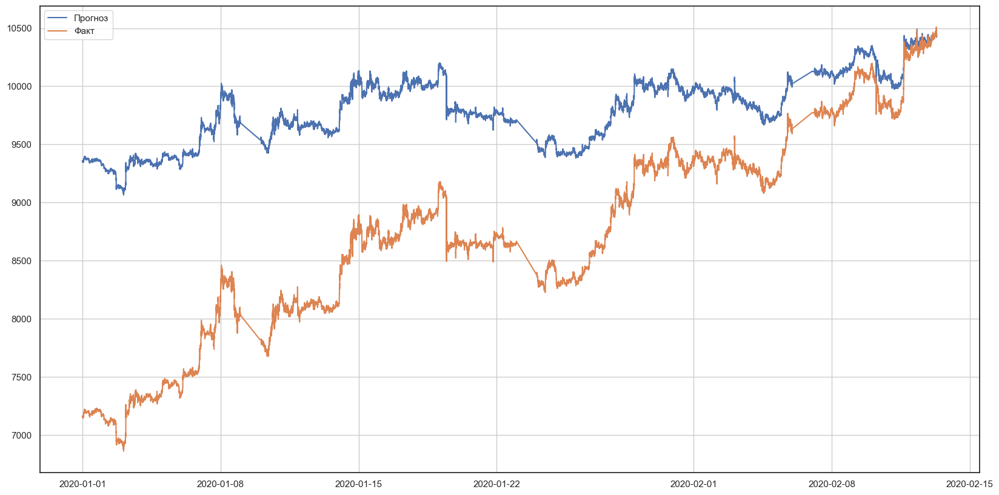

In [ ]:
# ТЕСТ
# Приводим тестовый датасет к нужному формату
val['Date'] = pd.to_datetime(val['Date'])
val = val.drop(columns=['Symbol'], errors='ignore')

# Проверяем, какую лучшую модель выбрал auto_timeseries
best_model = model.get_best_model_name()
print(f"Лучшая модель: {best_model}")

# Делаем предсказание
pred = model.predict(val, model=best_model)['yhat'].to_numpy()


# Визуализируем
plt.figure(figsize=(20, 10))
plt.plot(val['Date'], pred, label='Прогноз')
plt.plot(val['Date'], val['Close'], label='Факт')
plt.legend()
plt.grid()
plt.show()


Start of Fit.....
    Target variable given as = Close
Start of loading of data.....
    Inputs: ts_column = Date, sep = ,, target = ['Close']
    Using given input: pandas dataframe...
    Date column exists in given train data...
    train data shape = (601000, 6)
Alert: Could not detect strf_time_format of Date. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Data is stationary after one differencing
There is 1 differencing needed in this datasets for VAR model


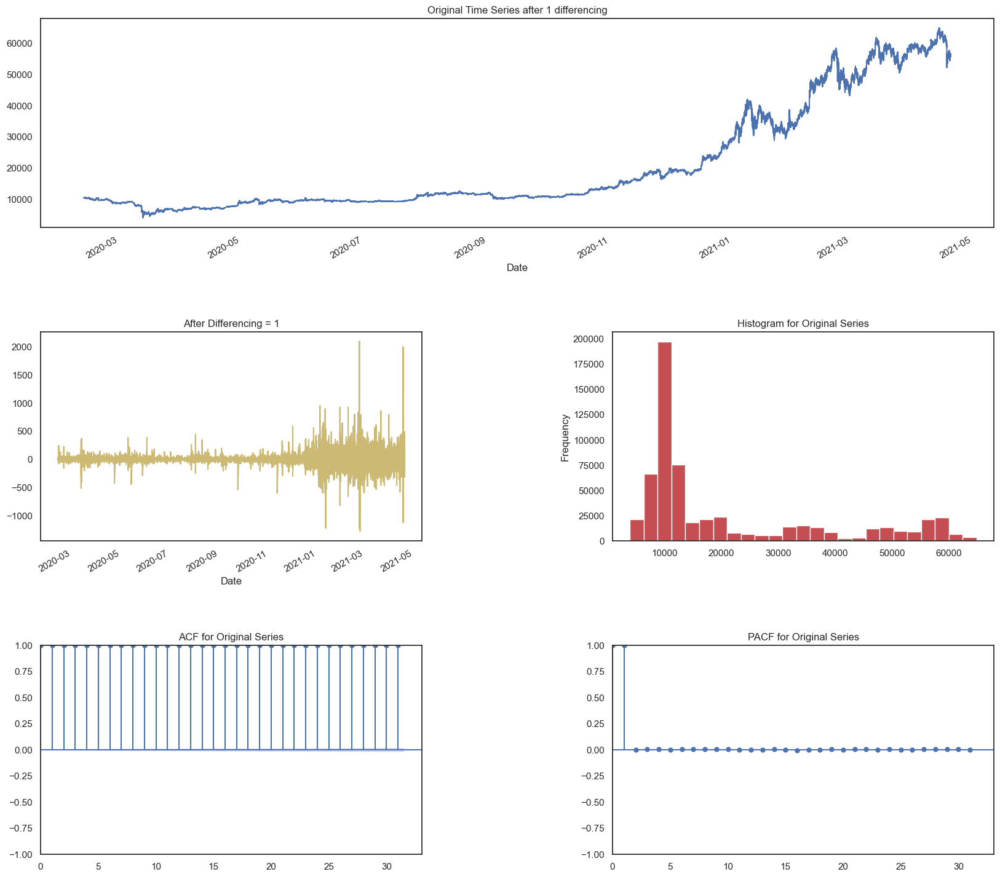

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


12:33:07 - cmdstanpy - INFO - Chain [1] start processing
12:33:32 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,372.88
    Std Deviation of actuals = 2.85
    Normalized RMSE (as pct of std dev) = 1905326%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


12:35:09 - cmdstanpy - INFO - Chain [1] start processing
12:35:34 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,628.91
    Std Deviation of actuals = 1.60
    Normalized RMSE (as pct of std dev) = 3468298%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


12:37:11 - cmdstanpy - INFO - Chain [1] start processing
12:37:36 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,427.10
    Std Deviation of actuals = 7.36
    Normalized RMSE (as pct of std dev) = 739489%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


12:39:14 - cmdstanpy - INFO - Chain [1] start processing
12:39:38 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,612.29
    Std Deviation of actuals = 5.30
    Normalized RMSE (as pct of std dev) = 1029675%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


12:41:17 - cmdstanpy - INFO - Chain [1] start processing
12:41:42 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,770.90
    Std Deviation of actuals = 2.71
    Normalized RMSE (as pct of std dev) = 2020695%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 54760.27
    MSE (Mean Squared Error = 2999129499.04
    MAPE (Mean Absolute Percent Error) = 529%
    RMSE (Root Mean Squared Error) = 54764.3086
    Normalized RMSE (MinMax) = 165551%
    Normalized RMSE (as Std Dev of Actuals)= 700180%
Time Taken = 612 seconds


12:43:20 - cmdstanpy - INFO - Chain [1] start processing
12:43:44 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6042799.566
Static Forecasts:
    RMSE = 6.01
    Std Deviation of Actuals = 2.85
    Normalized RMSE (as pct of std dev) = 210.6%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6042844.866
Static Forecasts:
    RMSE = 9.55
    Std Deviation of Actuals = 1.60
    Normalized RMSE (as pct of std dev) = 595.4%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    F

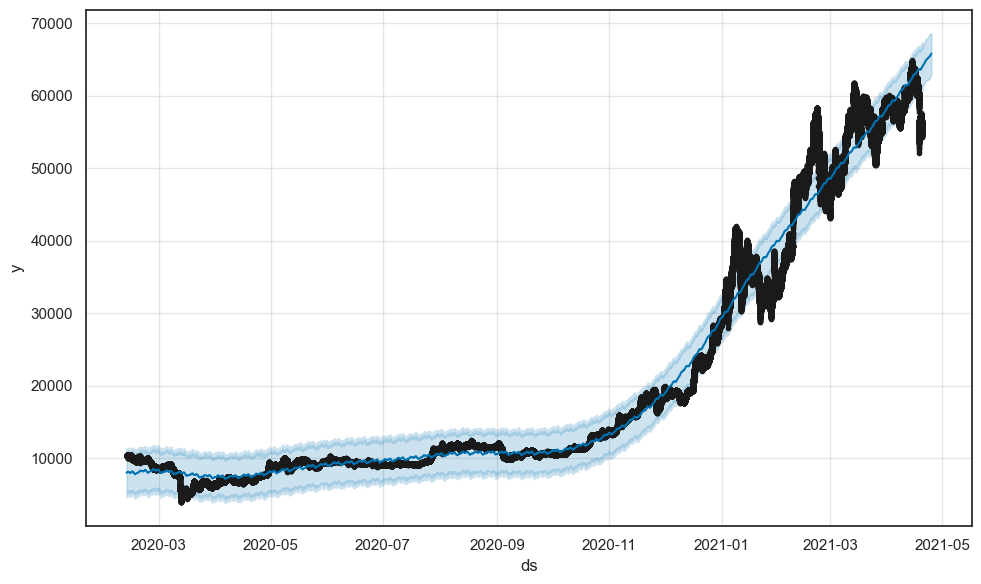

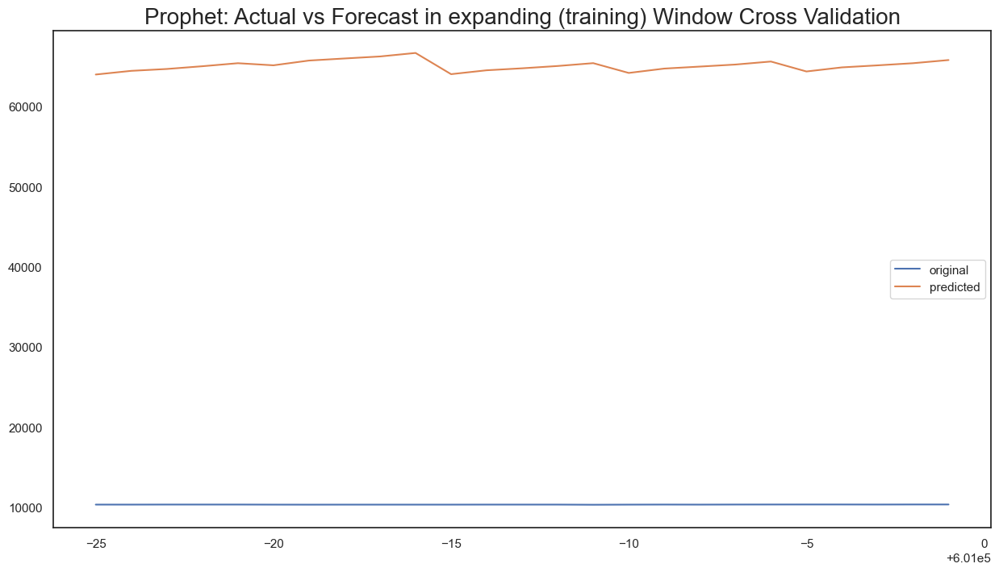

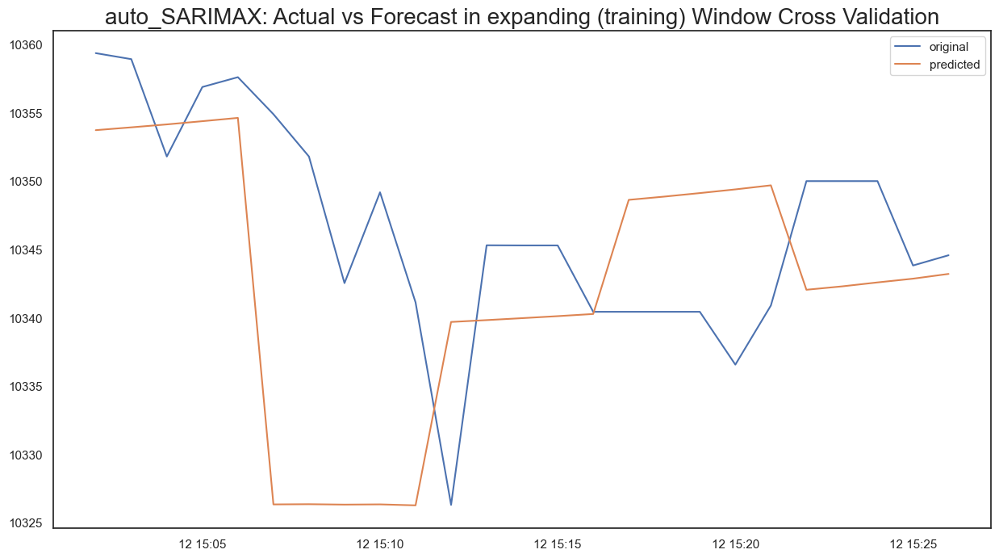

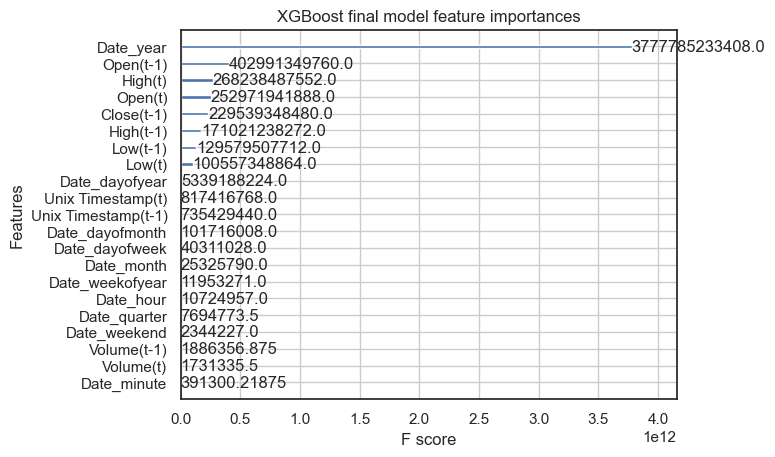

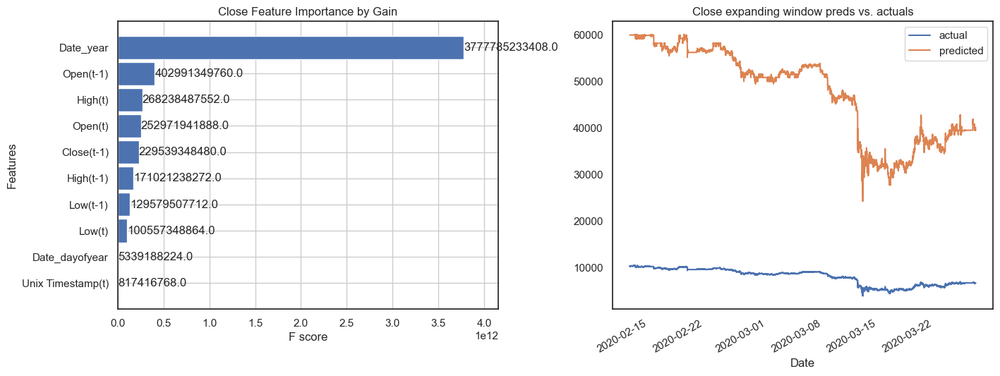

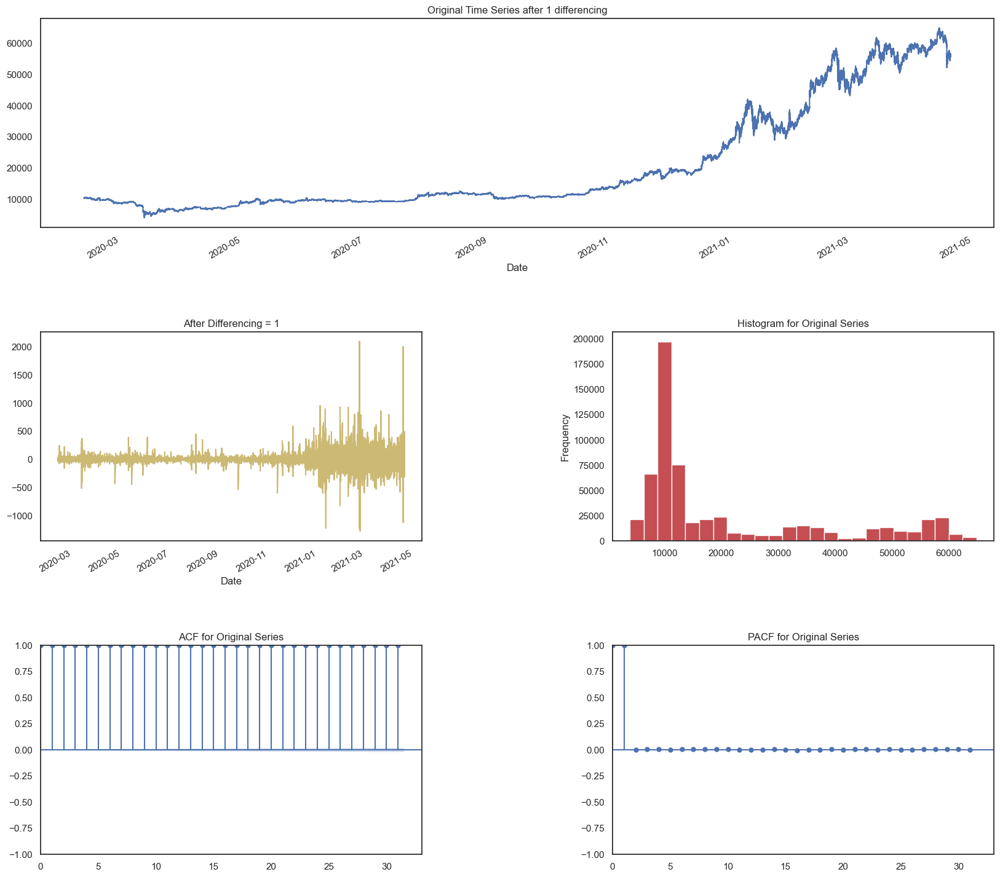

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


14:48:40 - cmdstanpy - INFO - Chain [1] start processing
14:49:04 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,955.40
    Std Deviation of actuals = 2.51
    Normalized RMSE (as pct of std dev) = 2185672%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


14:50:39 - cmdstanpy - INFO - Chain [1] start processing
14:51:03 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,108.30
    Std Deviation of actuals = 2.86
    Normalized RMSE (as pct of std dev) = 1925007%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


14:52:38 - cmdstanpy - INFO - Chain [1] start processing
14:53:03 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,045.45
    Std Deviation of actuals = 4.38
    Normalized RMSE (as pct of std dev) = 1255656%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


14:54:37 - cmdstanpy - INFO - Chain [1] start processing
14:55:02 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,148.18
    Std Deviation of actuals = 1.37
    Normalized RMSE (as pct of std dev) = 4024733%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


14:56:37 - cmdstanpy - INFO - Chain [1] start processing
14:57:01 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,876.19
    Std Deviation of actuals = 5.24
    Normalized RMSE (as pct of std dev) = 1046770%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 55024.73
    MSE (Mean Squared Error = 3027948062.34
    MAPE (Mean Absolute Percent Error) = 537%
    RMSE (Root Mean Squared Error) = 55026.7940
    Normalized RMSE (MinMax) = 153749%
    Normalized RMSE (as Std Dev of Actuals)= 443732%
Time Taken = 597 seconds


14:58:37 - cmdstanpy - INFO - Chain [1] start processing
14:59:02 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6042820.174
Static Forecasts:
    RMSE = 2.58
    Std Deviation of Actuals = 2.51
    Normalized RMSE (as pct of std dev) = 102.5%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6042865.483
Static Forecasts:
    RMSE = 7.49
    Std Deviation of Actuals = 2.86
    Normalized RMSE (as pct of std dev) = 261.8%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    F

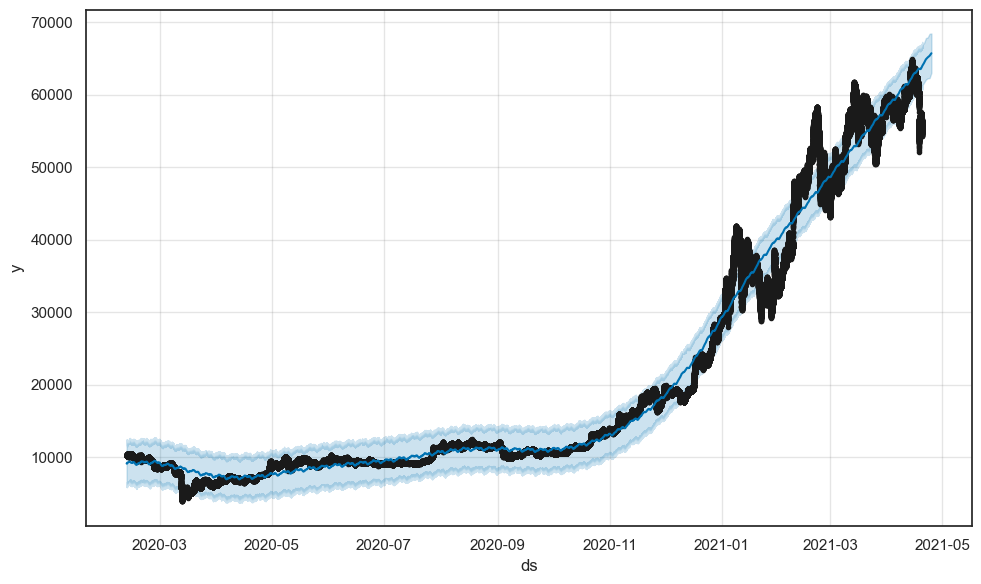

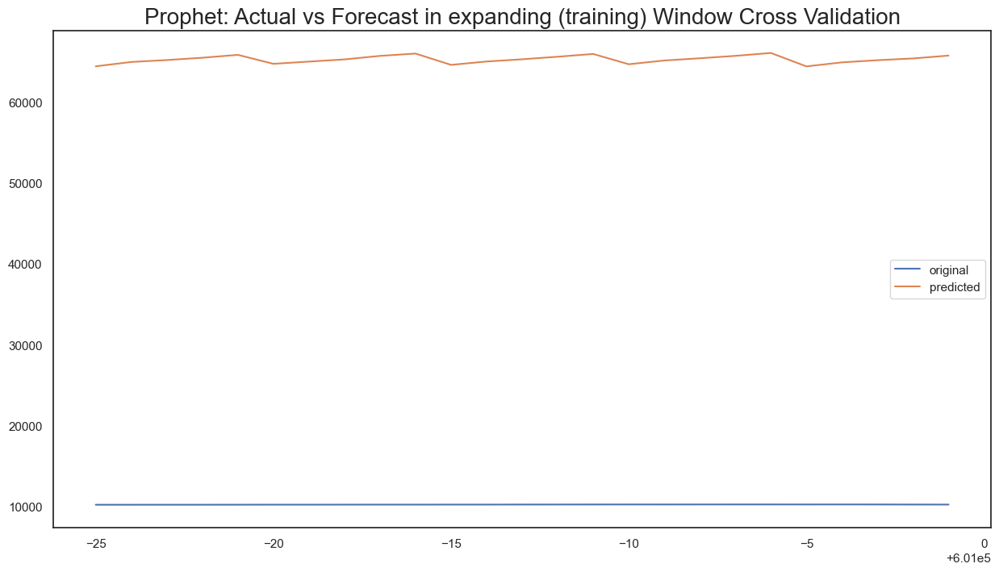

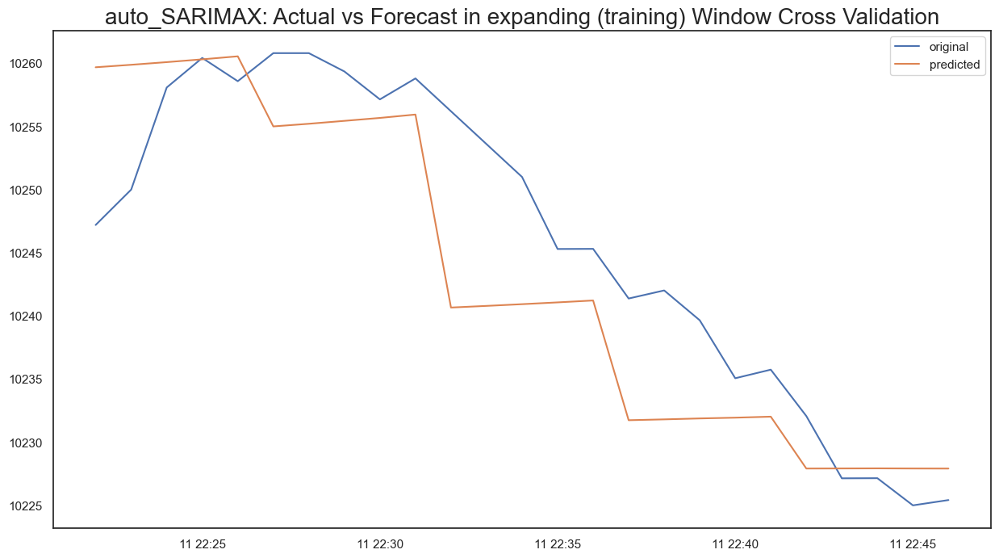

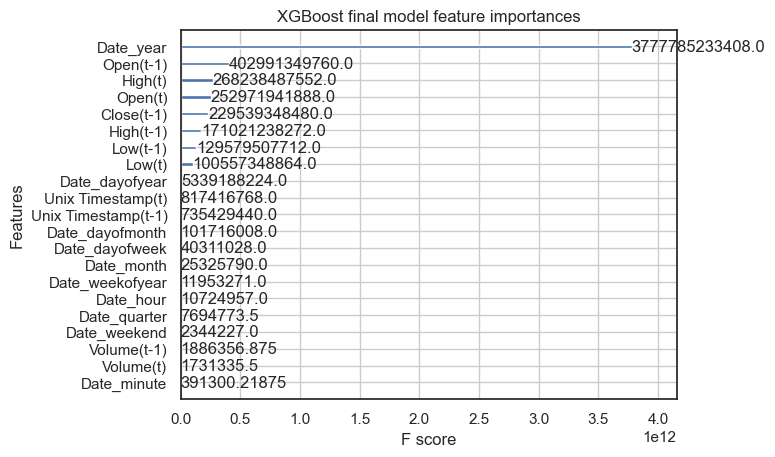

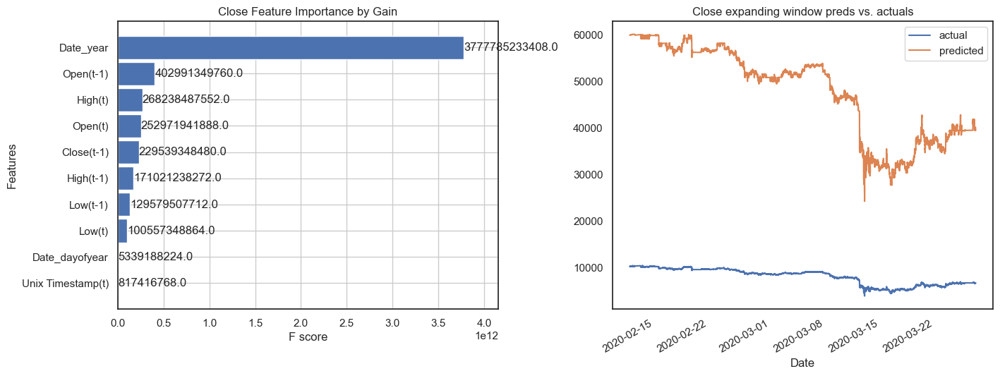

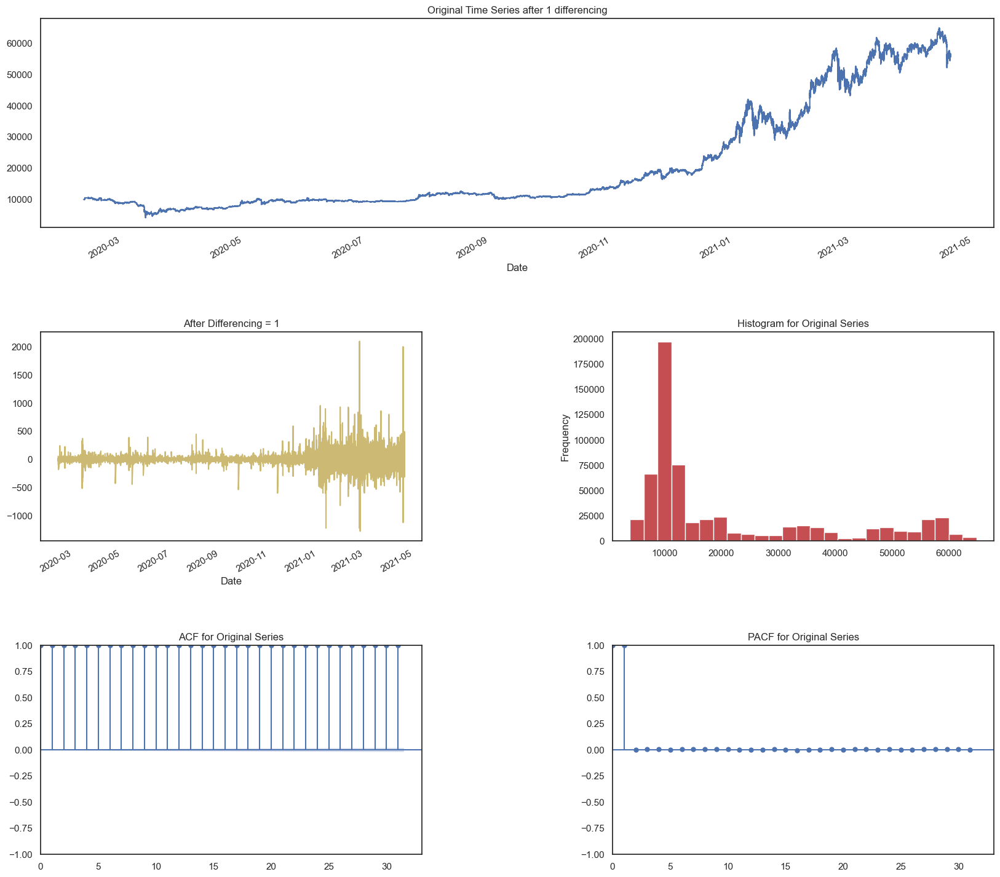

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


17:09:16 - cmdstanpy - INFO - Chain [1] start processing
17:09:40 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,824.31
    Std Deviation of actuals = 7.53
    Normalized RMSE (as pct of std dev) = 728407%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


17:11:17 - cmdstanpy - INFO - Chain [1] start processing
17:11:42 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,655.09
    Std Deviation of actuals = 5.05
    Normalized RMSE (as pct of std dev) = 1081463%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


17:13:20 - cmdstanpy - INFO - Chain [1] start processing
17:13:44 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,718.48
    Std Deviation of actuals = 1.89
    Normalized RMSE (as pct of std dev) = 2943389%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


17:15:21 - cmdstanpy - INFO - Chain [1] start processing
17:15:45 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,413.81
    Std Deviation of actuals = 5.26
    Normalized RMSE (as pct of std dev) = 1054028%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


17:17:23 - cmdstanpy - INFO - Chain [1] start processing
17:17:47 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,557.79
    Std Deviation of actuals = 0.00
    Normalized RMSE (as pct of std dev) = 1134068600%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 55231.88
    MSE (Mean Squared Error = 3050957893.51
    MAPE (Mean Absolute Percent Error) = 566%
    RMSE (Root Mean Squared Error) = 55235.4768
    Normalized RMSE (MinMax) = 217806%
    Normalized RMSE (as Std Dev of Actuals)= 640296%
Time Taken = 608 seconds


17:19:25 - cmdstanpy - INFO - Chain [1] start processing
17:19:49 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6042849.679
Static Forecasts:
    RMSE = 9.91
    Std Deviation of Actuals = 7.53
    Normalized RMSE (as pct of std dev) = 131.6%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6042895.048
Static Forecasts:
    RMSE = 5.07
    Std Deviation of Actuals = 5.05
    Normalized RMSE (as pct of std dev) = 100.4%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    F

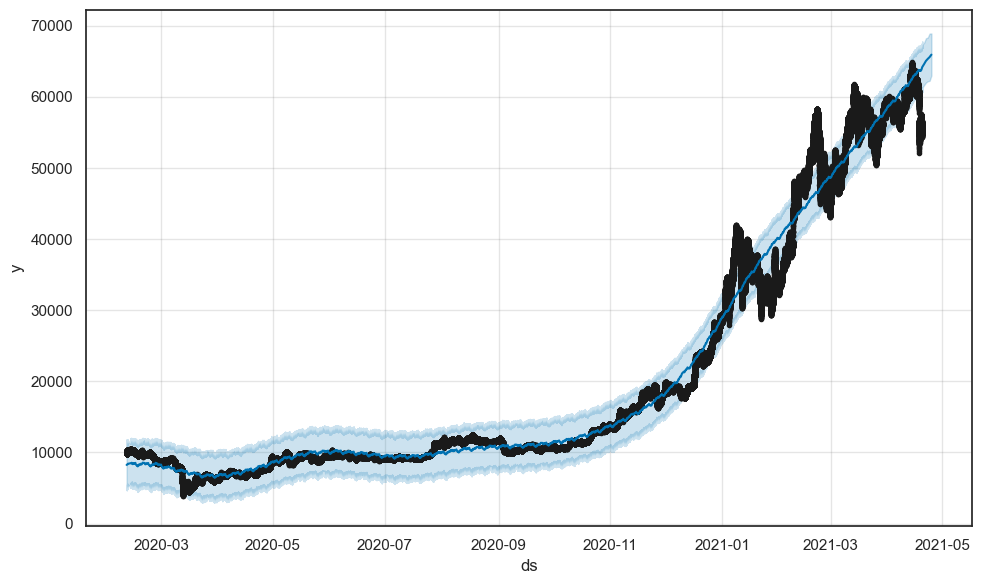

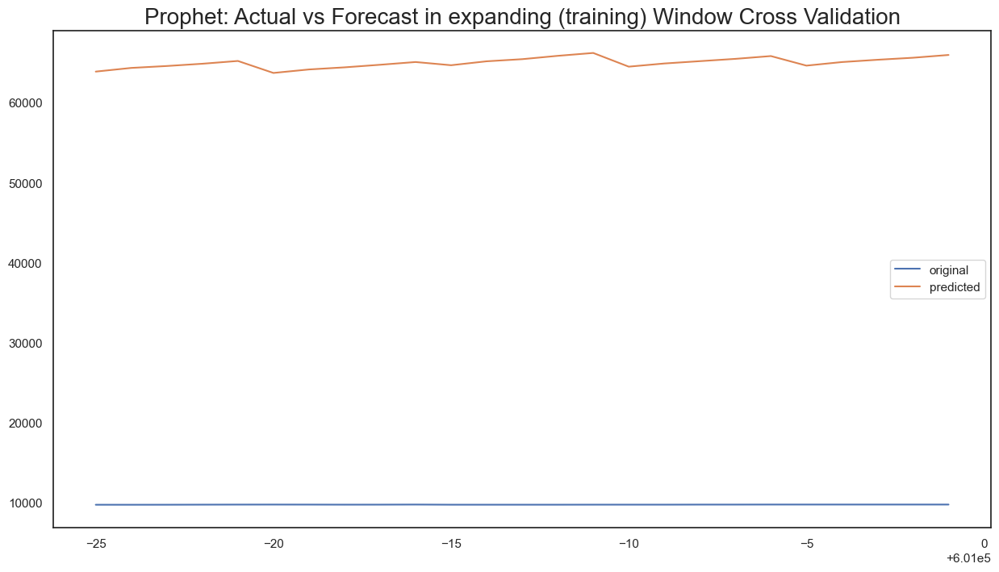

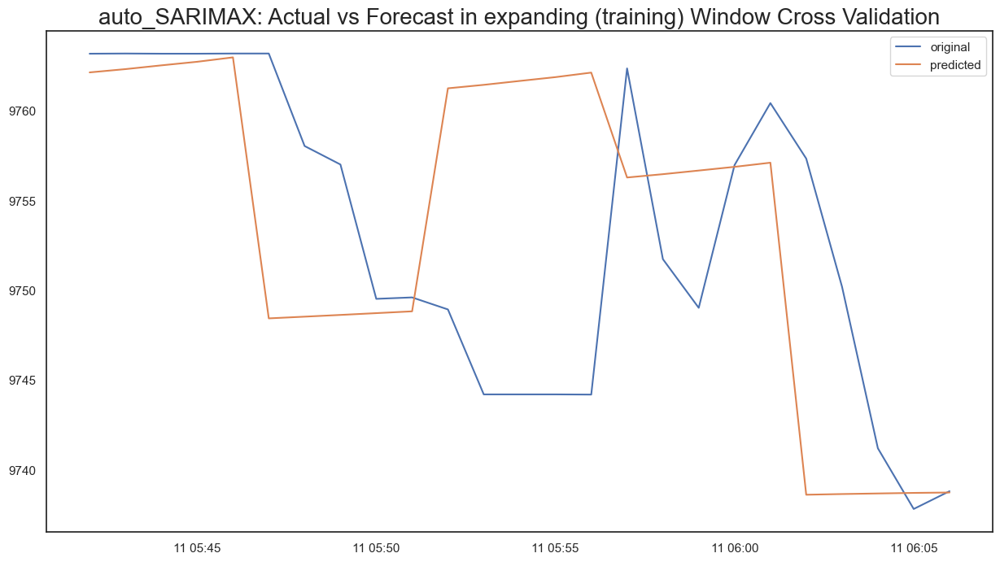

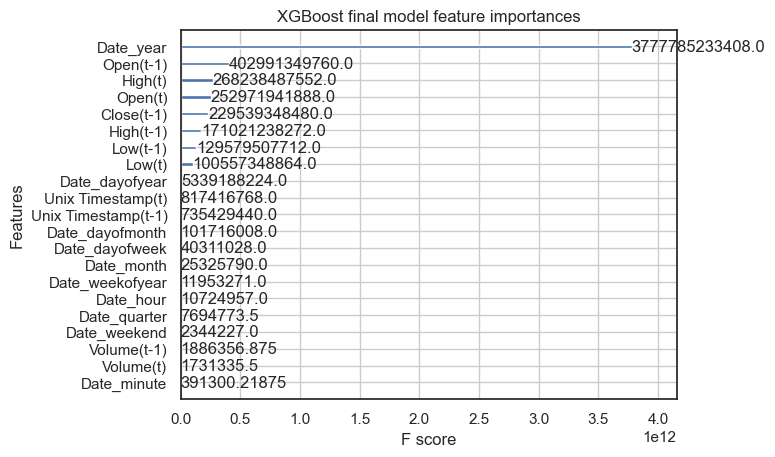

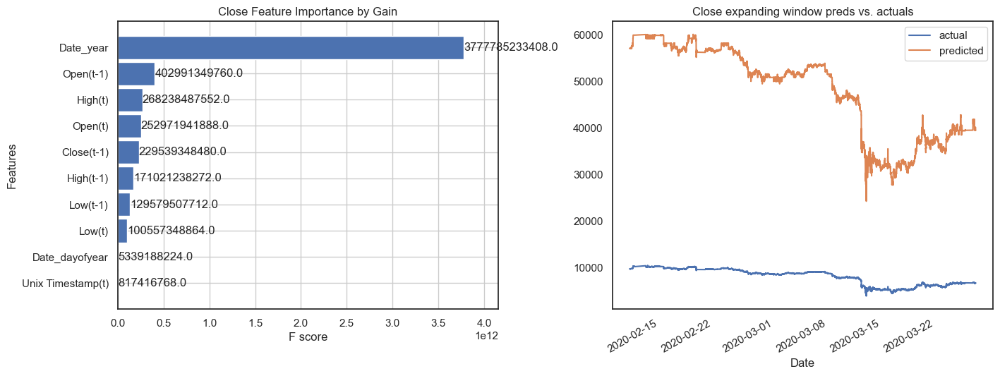

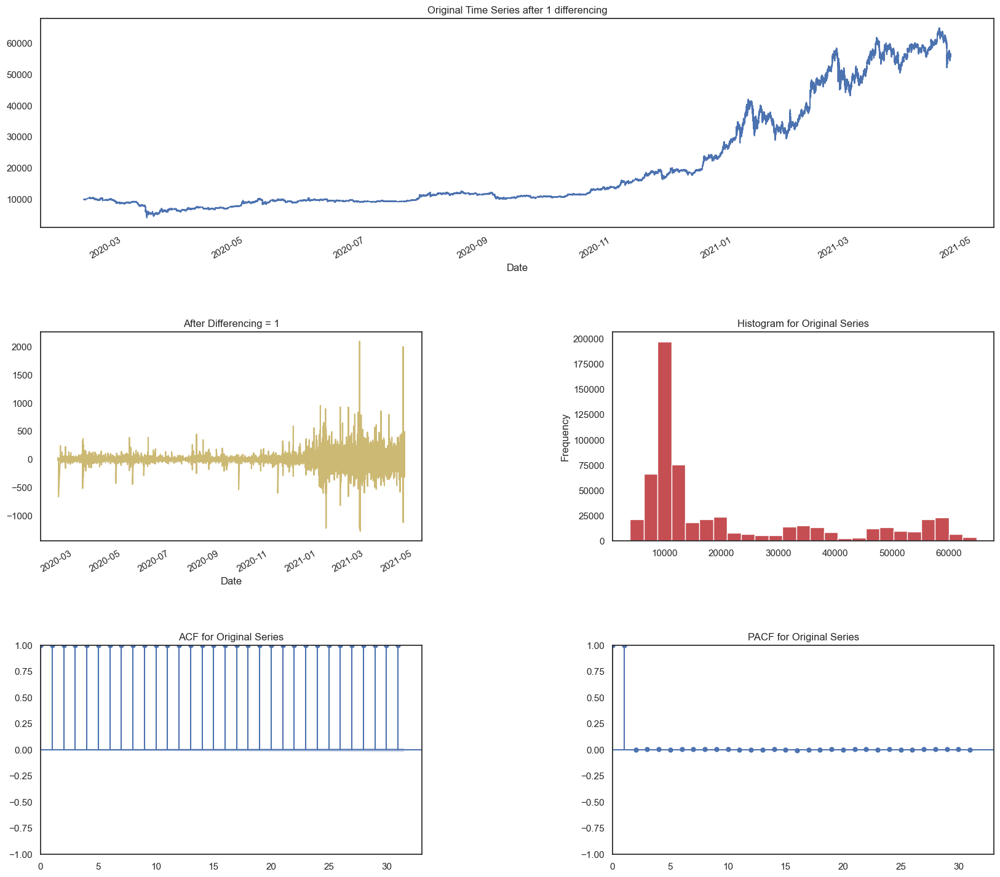

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


19:39:47 - cmdstanpy - INFO - Chain [1] start processing
19:40:10 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,679.88
    Std Deviation of actuals = 4.50
    Normalized RMSE (as pct of std dev) = 1214801%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


19:41:48 - cmdstanpy - INFO - Chain [1] start processing
19:42:12 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 56,006.55
    Std Deviation of actuals = 3.55
    Normalized RMSE (as pct of std dev) = 1579362%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


19:43:49 - cmdstanpy - INFO - Chain [1] start processing
19:44:15 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,423.75
    Std Deviation of actuals = 4.78
    Normalized RMSE (as pct of std dev) = 1138887%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


19:45:52 - cmdstanpy - INFO - Chain [1] start processing
19:46:17 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,759.16
    Std Deviation of actuals = 5.62
    Normalized RMSE (as pct of std dev) = 974163%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


19:47:54 - cmdstanpy - INFO - Chain [1] start processing
19:48:18 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,586.74
    Std Deviation of actuals = 4.76
    Normalized RMSE (as pct of std dev) = 1167687%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 55089.25
    MSE (Mean Squared Error = 3035403657.96
    MAPE (Mean Absolute Percent Error) = 560%
    RMSE (Root Mean Squared Error) = 55094.4975
    Normalized RMSE (MinMax) = 215972%
    Normalized RMSE (as Std Dev of Actuals)= 800348%
Time Taken = 609 seconds


19:49:56 - cmdstanpy - INFO - Chain [1] start processing
19:50:21 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043117.864
Static Forecasts:
    RMSE = 4.72
    Std Deviation of Actuals = 4.50
    Normalized RMSE (as pct of std dev) = 104.9%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043163.307
Static Forecasts:
    RMSE = 4.26
    Std Deviation of Actuals = 3.55
    Normalized RMSE (as pct of std dev) = 120.2%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    F

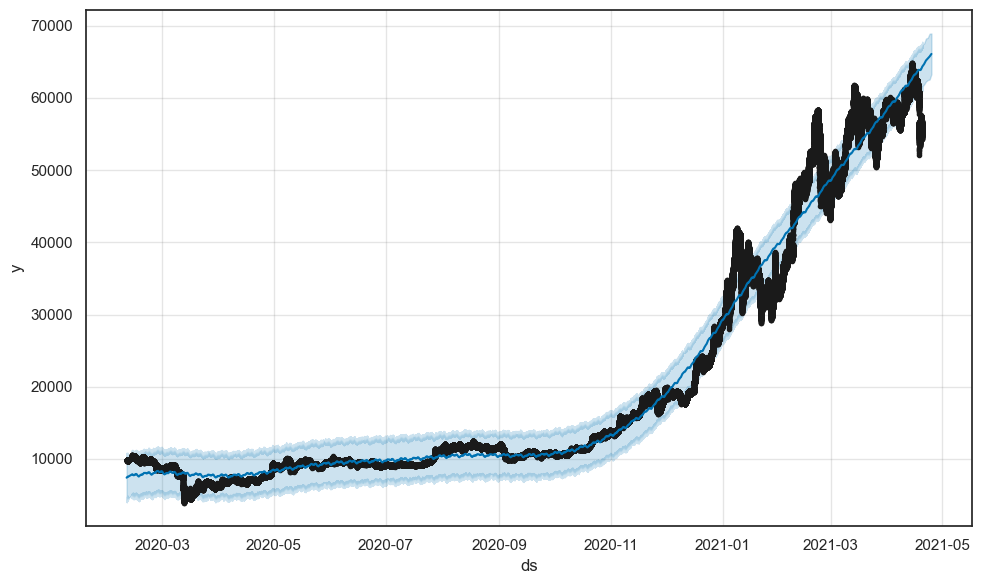

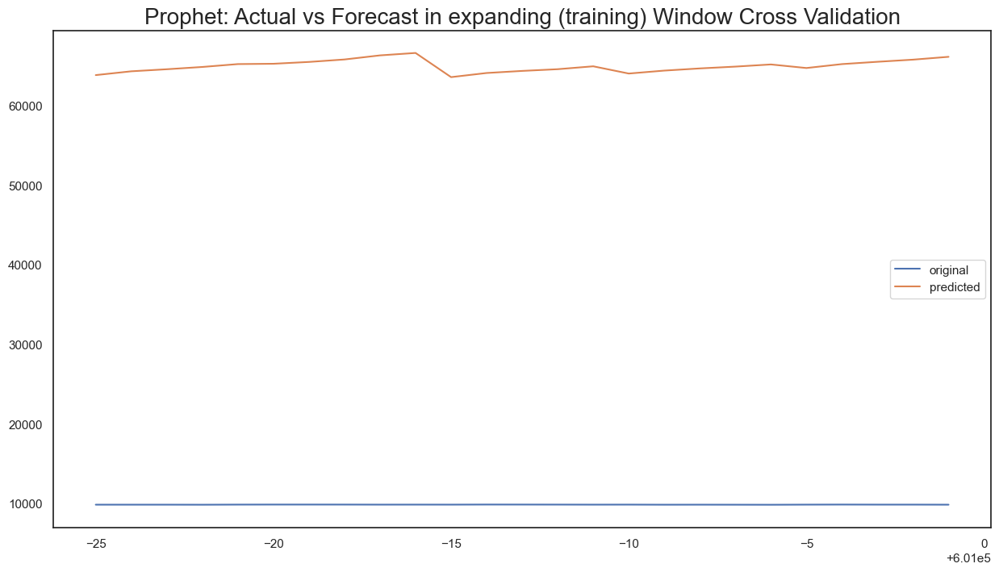

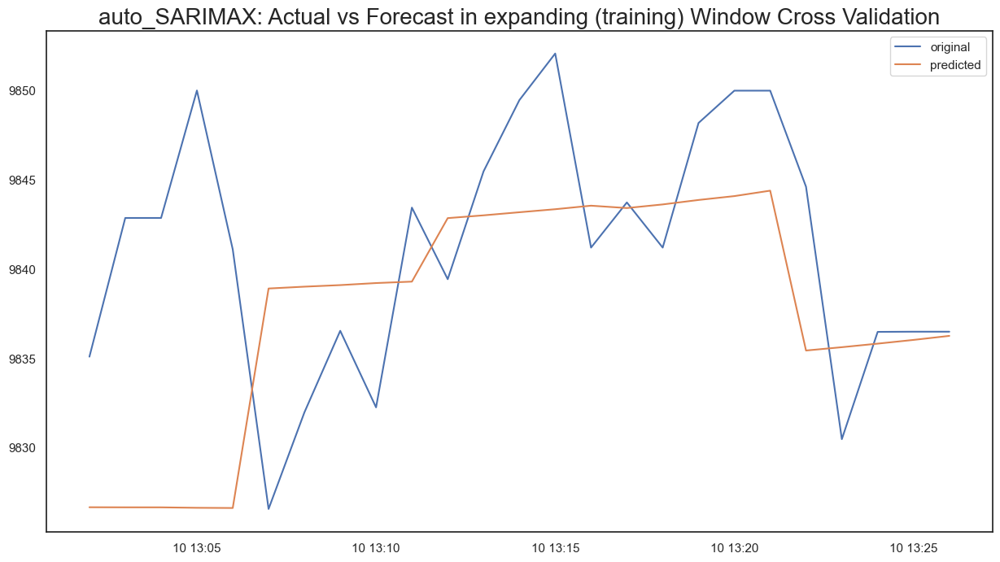

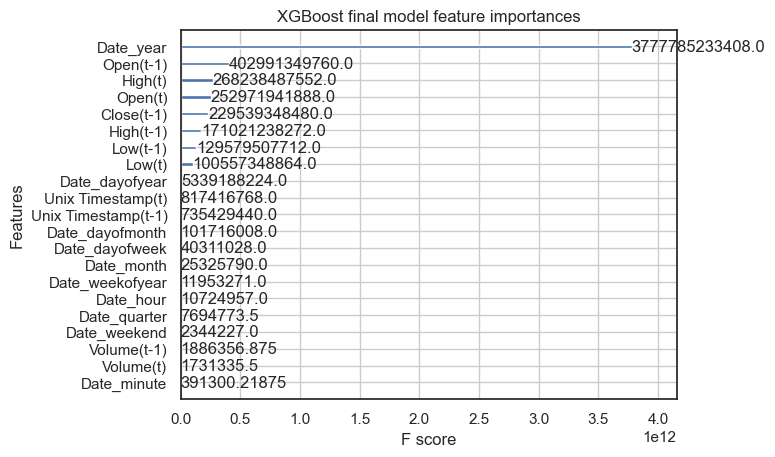

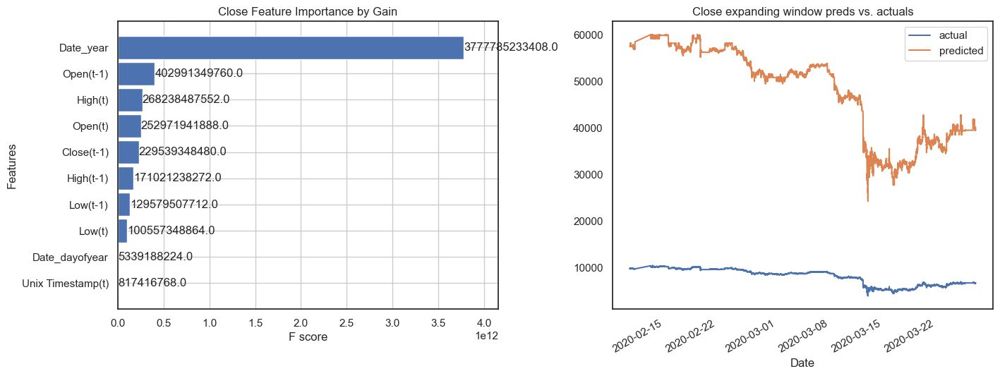

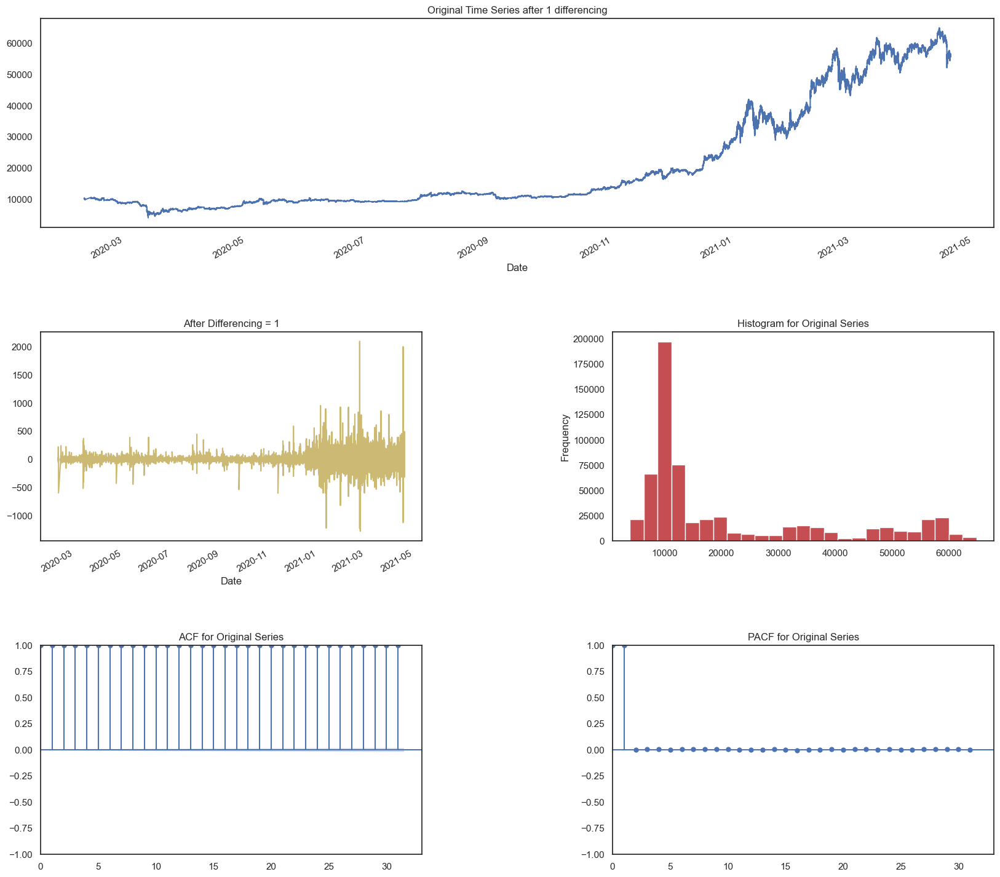

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


22:04:19 - cmdstanpy - INFO - Chain [1] start processing
22:04:45 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,532.91
    Std Deviation of actuals = 2.69
    Normalized RMSE (as pct of std dev) = 2027112%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


22:06:22 - cmdstanpy - INFO - Chain [1] start processing
22:06:47 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,547.30
    Std Deviation of actuals = 5.39
    Normalized RMSE (as pct of std dev) = 1030567%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


22:08:24 - cmdstanpy - INFO - Chain [1] start processing
22:08:48 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,677.12
    Std Deviation of actuals = 1.86
    Normalized RMSE (as pct of std dev) = 2947376%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


22:10:24 - cmdstanpy - INFO - Chain [1] start processing
22:10:49 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,335.84
    Std Deviation of actuals = 2.87
    Normalized RMSE (as pct of std dev) = 1927229%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


22:12:26 - cmdstanpy - INFO - Chain [1] start processing
22:12:51 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,539.92
    Std Deviation of actuals = 2.00
    Normalized RMSE (as pct of std dev) = 2731493%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 54924.55
    MSE (Mean Squared Error = 3017117086.65
    MAPE (Mean Absolute Percent Error) = 546%
    RMSE (Root Mean Squared Error) = 54928.2904
    Normalized RMSE (MinMax) = 206653%
    Normalized RMSE (as Std Dev of Actuals)= 718637%
Time Taken = 608 seconds


22:14:28 - cmdstanpy - INFO - Chain [1] start processing
22:14:52 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043104.280
Static Forecasts:
    RMSE = 3.33
    Std Deviation of Actuals = 2.69
    Normalized RMSE (as pct of std dev) = 123.9%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043149.603
Static Forecasts:
    RMSE = 9.27
    Std Deviation of Actuals = 5.39
    Normalized RMSE (as pct of std dev) = 171.9%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    F

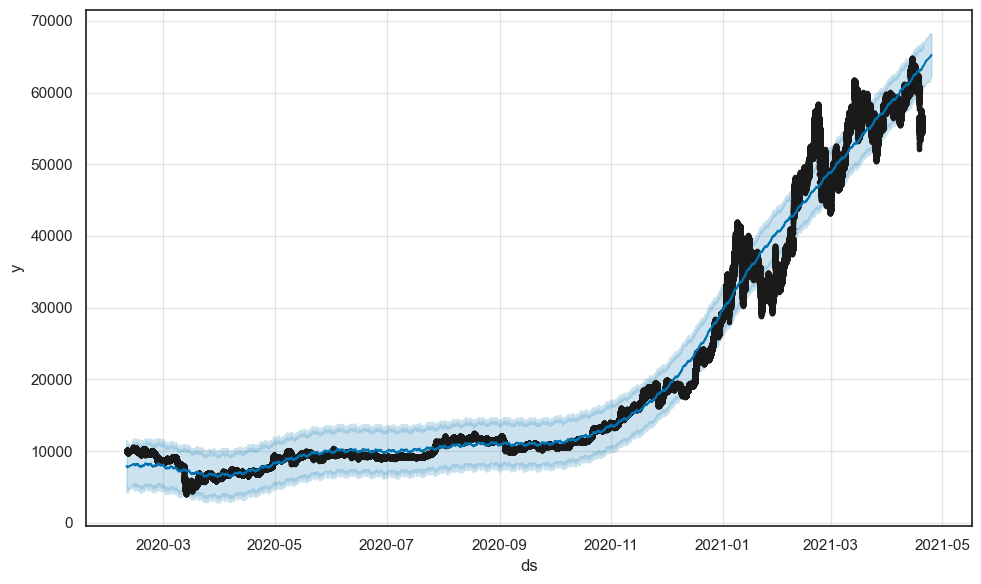

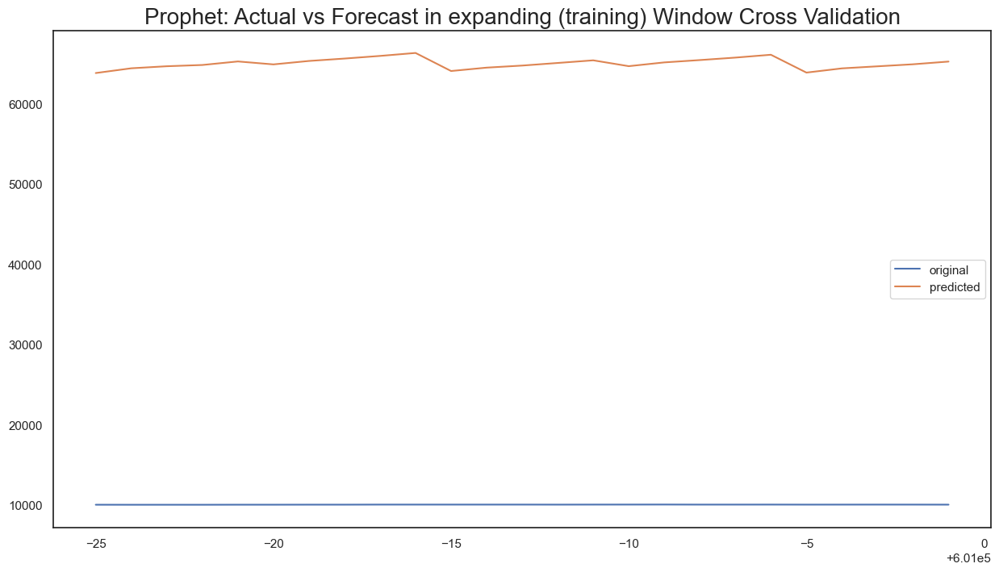

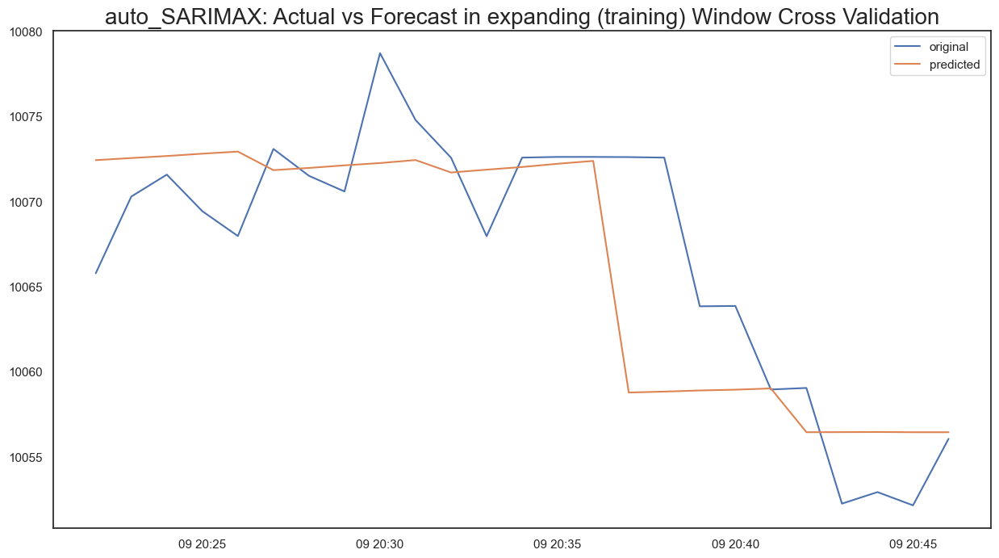

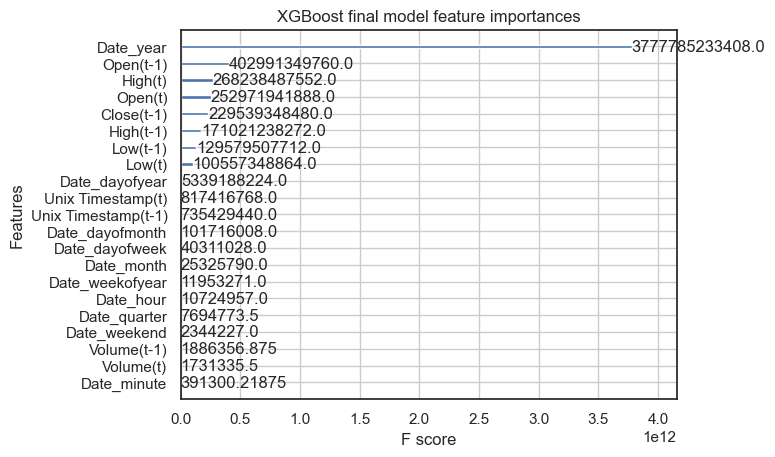

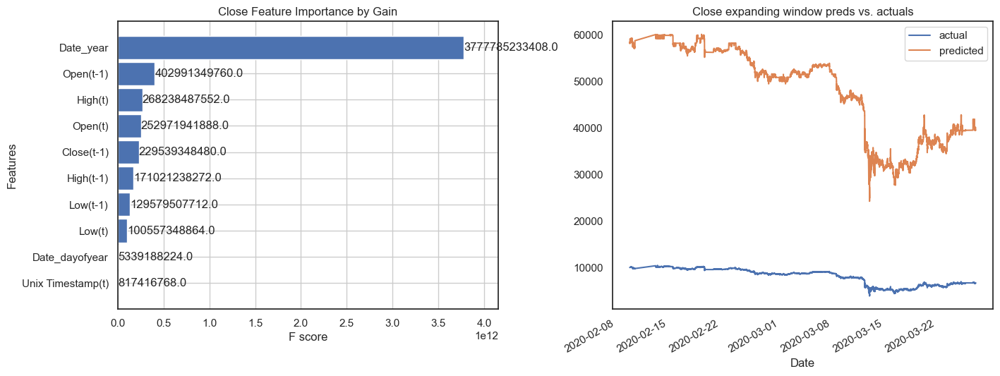

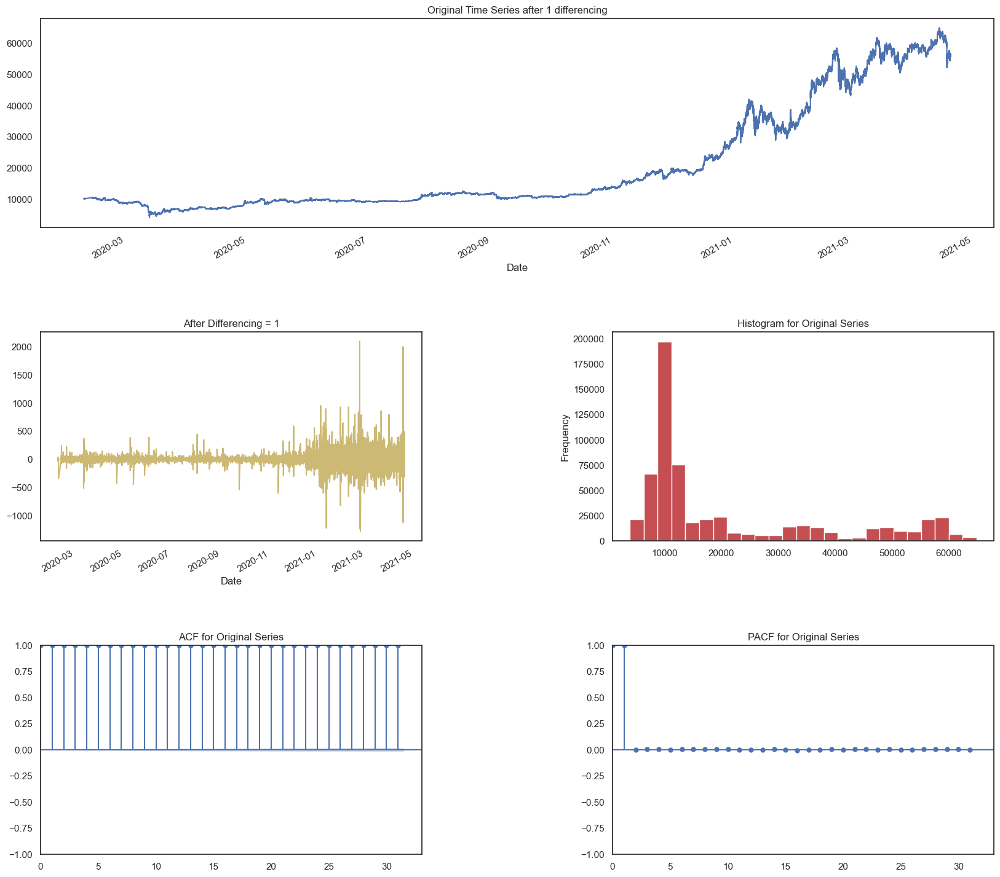

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


00:24:46 - cmdstanpy - INFO - Chain [1] start processing
00:25:11 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,958.86
    Std Deviation of actuals = 8.94
    Normalized RMSE (as pct of std dev) = 614973%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


00:26:47 - cmdstanpy - INFO - Chain [1] start processing
00:27:12 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,462.53
    Std Deviation of actuals = 19.52
    Normalized RMSE (as pct of std dev) = 279041%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


00:28:48 - cmdstanpy - INFO - Chain [1] start processing
00:29:13 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,719.47
    Std Deviation of actuals = 2.51
    Normalized RMSE (as pct of std dev) = 2177303%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


00:30:49 - cmdstanpy - INFO - Chain [1] start processing
00:31:13 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,276.72
    Std Deviation of actuals = 4.34
    Normalized RMSE (as pct of std dev) = 1251760%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


00:32:50 - cmdstanpy - INFO - Chain [1] start processing
00:33:14 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,189.14
    Std Deviation of actuals = 4.01
    Normalized RMSE (as pct of std dev) = 1375773%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 54719.36
    MSE (Mean Squared Error = 2994533527.60
    MAPE (Mean Absolute Percent Error) = 545%
    RMSE (Root Mean Squared Error) = 54722.3312
    Normalized RMSE (MinMax) = 66532%
    Normalized RMSE (as Std Dev of Actuals)= 210935%
Time Taken = 605 seconds


00:34:51 - cmdstanpy - INFO - Chain [1] start processing
00:35:15 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6042876.846
Static Forecasts:
    RMSE = 27.02
    Std Deviation of Actuals = 8.94
    Normalized RMSE (as pct of std dev) = 302.3%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6042923.102
Static Forecasts:
    RMSE = 20.12
    Std Deviation of Actuals = 19.52
    Normalized RMSE (as pct of std dev) = 103.1%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

  

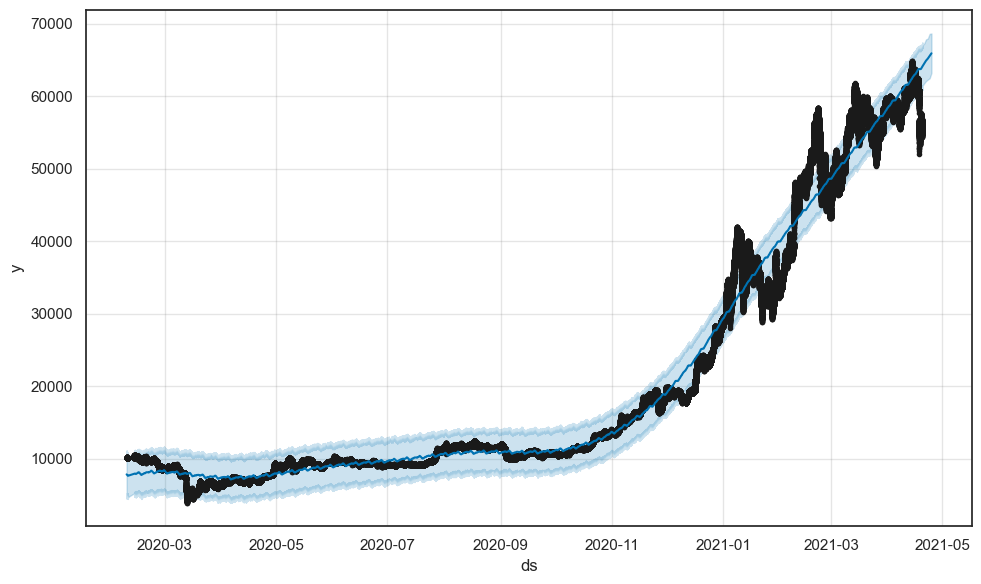

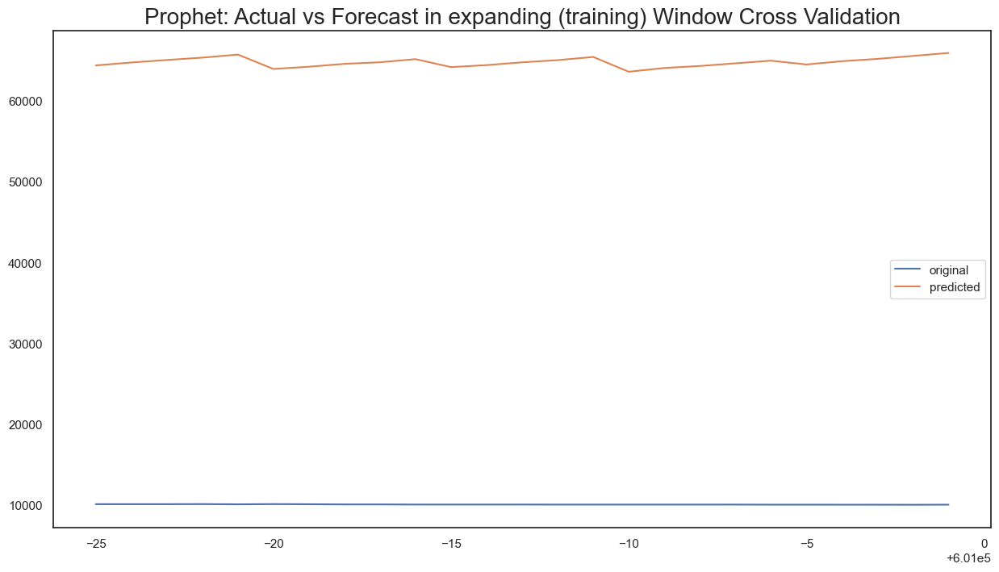

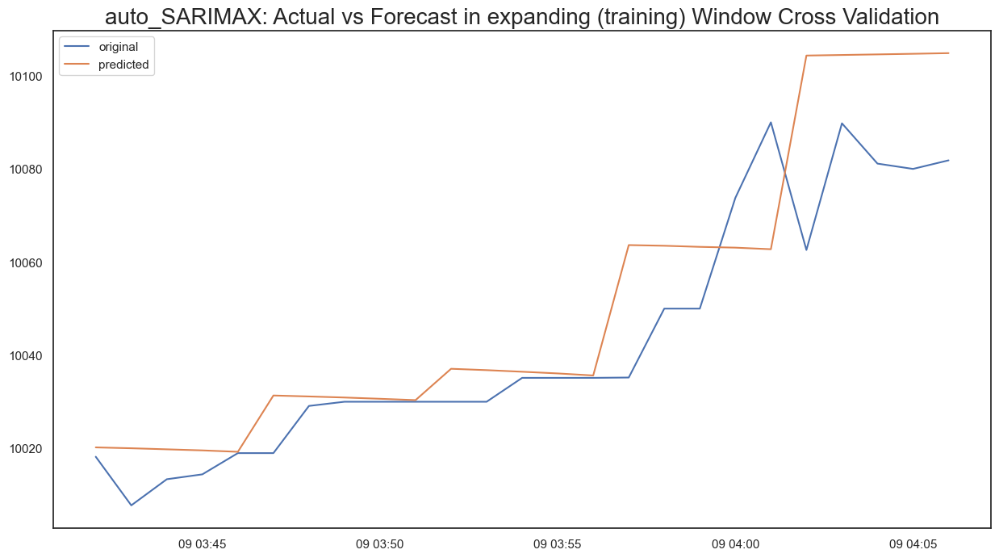

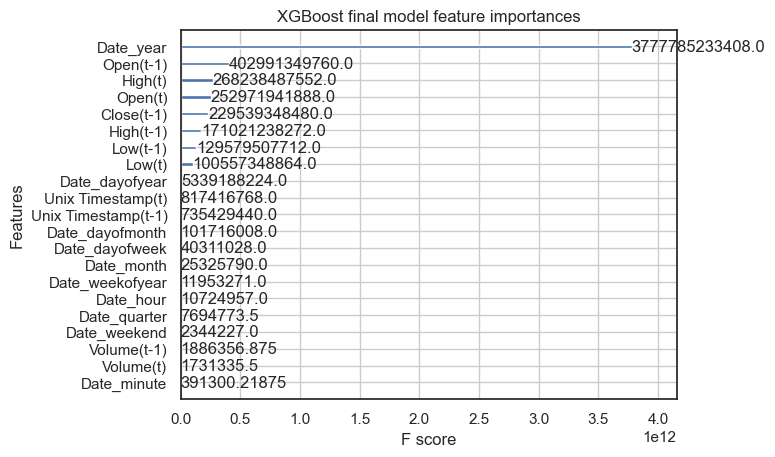

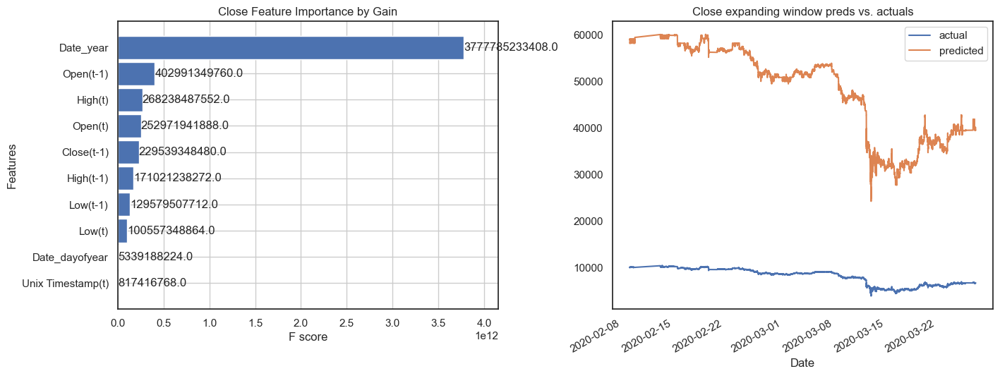

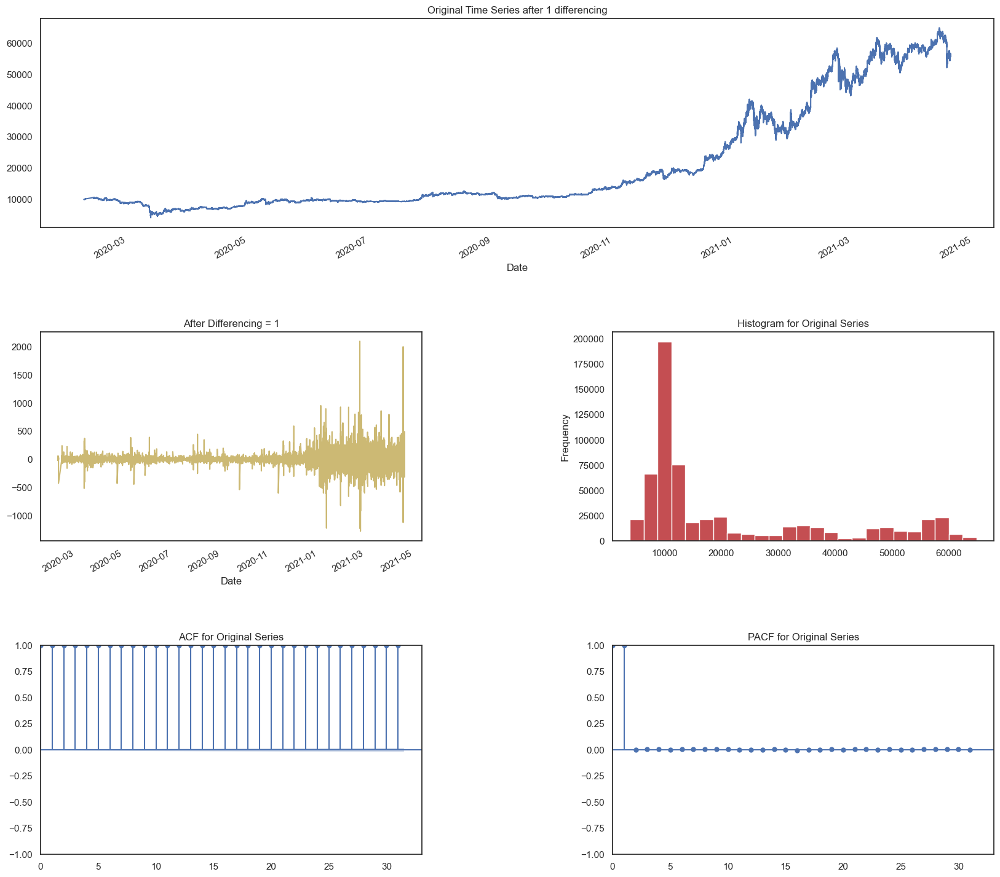

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


02:46:09 - cmdstanpy - INFO - Chain [1] start processing
02:46:34 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,202.71
    Std Deviation of actuals = 1.84
    Normalized RMSE (as pct of std dev) = 2994157%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


02:48:10 - cmdstanpy - INFO - Chain [1] start processing
02:48:35 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,668.01
    Std Deviation of actuals = 3.91
    Normalized RMSE (as pct of std dev) = 1423001%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


02:50:12 - cmdstanpy - INFO - Chain [1] start processing
02:50:37 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,149.01
    Std Deviation of actuals = 1.16
    Normalized RMSE (as pct of std dev) = 4754225%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


02:52:13 - cmdstanpy - INFO - Chain [1] start processing
02:52:39 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,997.06
    Std Deviation of actuals = 3.69
    Normalized RMSE (as pct of std dev) = 1491579%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


02:54:15 - cmdstanpy - INFO - Chain [1] start processing
02:54:40 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,164.08
    Std Deviation of actuals = 0.00
    Normalized RMSE (as pct of std dev) = 1379101964%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 55234.05
    MSE (Mean Squared Error = 3051086378.78
    MAPE (Mean Absolute Percent Error) = 563%
    RMSE (Root Mean Squared Error) = 55236.6398
    Normalized RMSE (MinMax) = 320770%
    Normalized RMSE (as Std Dev of Actuals)= 1035381%
Time Taken = 609 seconds


02:56:18 - cmdstanpy - INFO - Chain [1] start processing
02:56:42 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6042930.642
Static Forecasts:
    RMSE = 1.81
    Std Deviation of Actuals = 1.84
    Normalized RMSE (as pct of std dev) = 98.2%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6042975.941
Static Forecasts:
    RMSE = 8.55
    Std Deviation of Actuals = 3.91
    Normalized RMSE (as pct of std dev) = 218.7%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    Fi

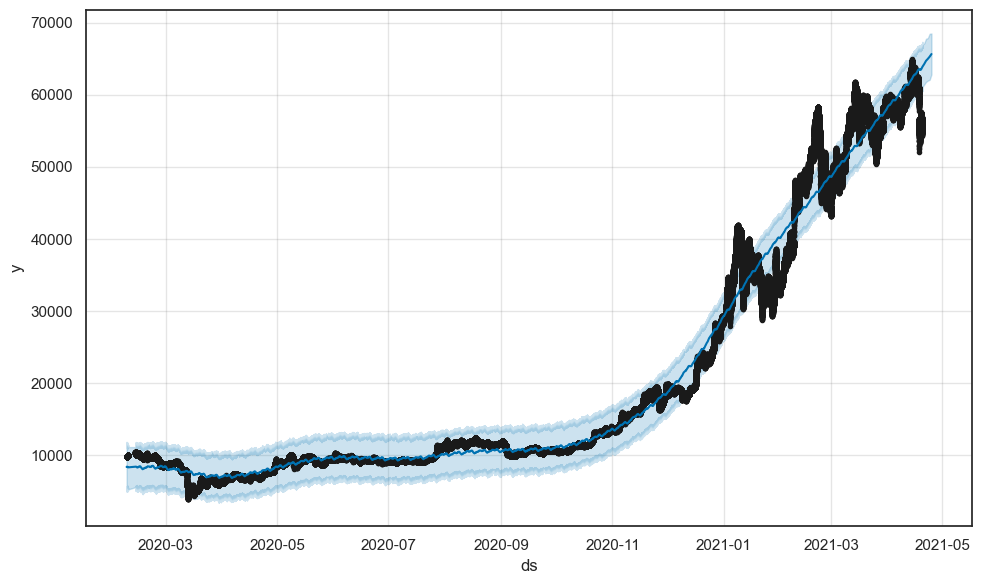

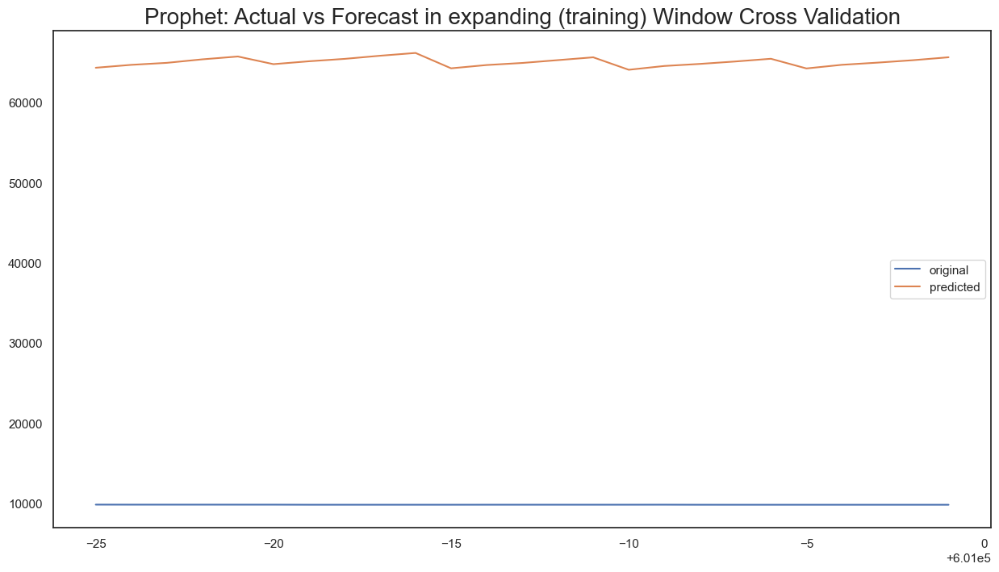

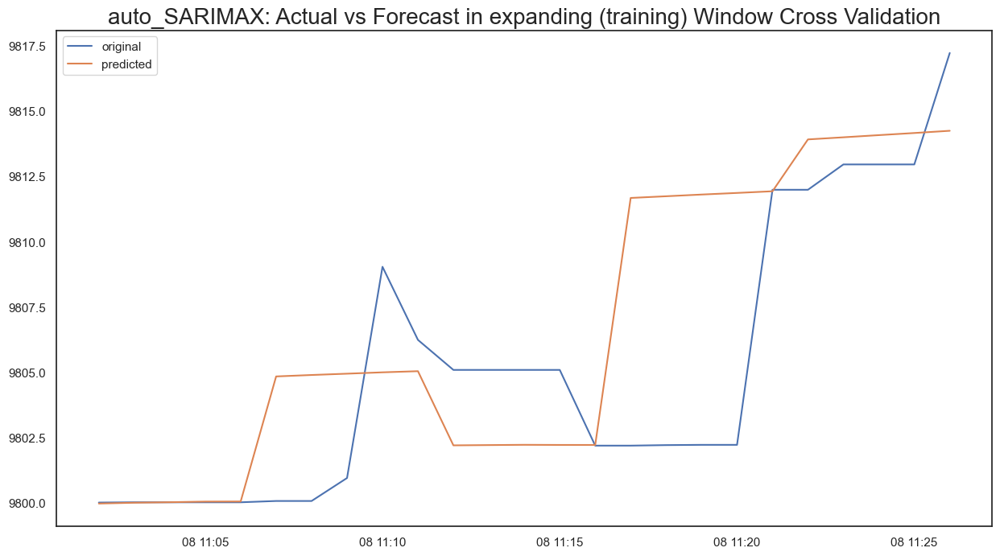

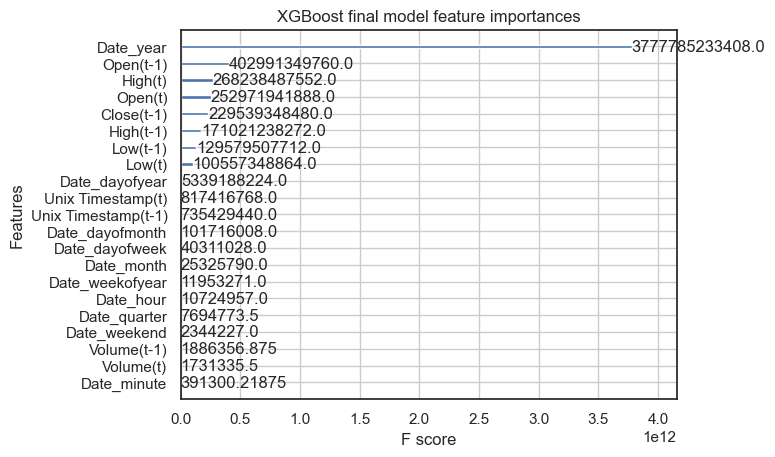

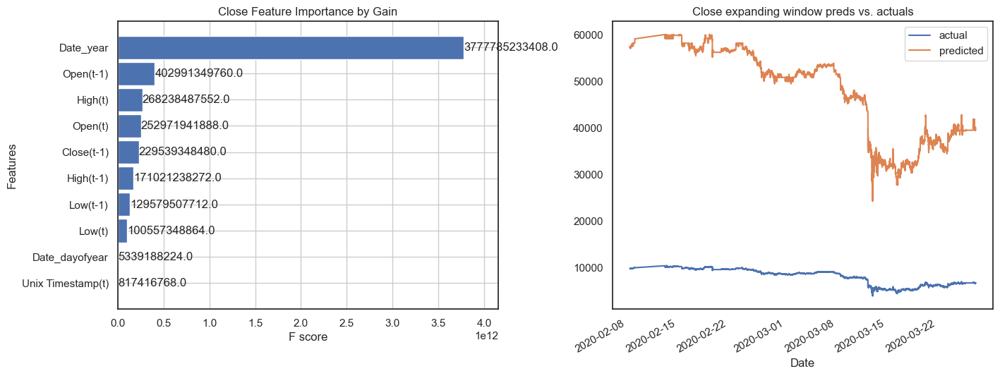

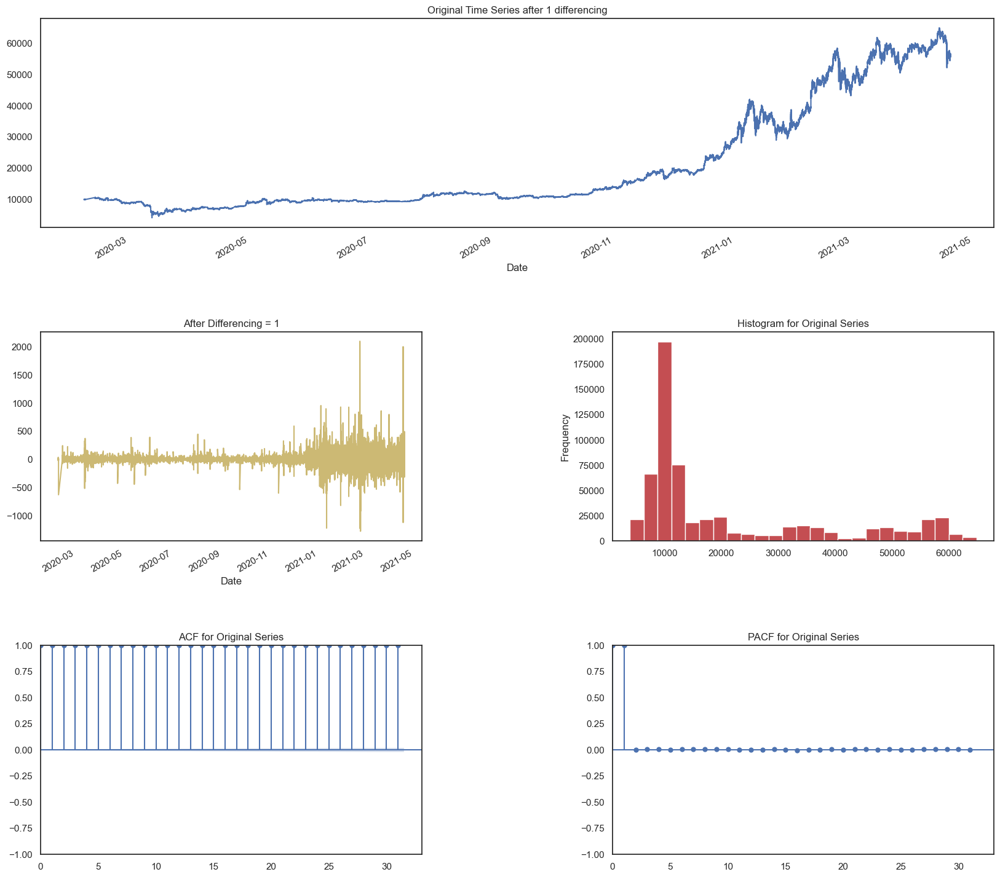

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


05:11:31 - cmdstanpy - INFO - Chain [1] start processing
05:11:56 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,514.91
    Std Deviation of actuals = 2.24
    Normalized RMSE (as pct of std dev) = 2435134%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


05:13:33 - cmdstanpy - INFO - Chain [1] start processing
05:13:57 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,698.53
    Std Deviation of actuals = 0.02
    Normalized RMSE (as pct of std dev) = 313717584%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


05:15:34 - cmdstanpy - INFO - Chain [1] start processing
05:15:58 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,460.36
    Std Deviation of actuals = 2.92
    Normalized RMSE (as pct of std dev) = 1902190%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


05:17:35 - cmdstanpy - INFO - Chain [1] start processing
05:18:00 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,764.85
    Std Deviation of actuals = 2.10
    Normalized RMSE (as pct of std dev) = 2611541%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


05:19:37 - cmdstanpy - INFO - Chain [1] start processing
05:20:01 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,813.87
    Std Deviation of actuals = 3.03
    Normalized RMSE (as pct of std dev) = 1807630%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 54848.49
    MSE (Mean Squared Error = 3008680889.02
    MAPE (Mean Absolute Percent Error) = 560%
    RMSE (Root Mean Squared Error) = 54851.4438
    Normalized RMSE (MinMax) = 356410%
    Normalized RMSE (as Std Dev of Actuals)= 1224990%
Time Taken = 607 seconds


05:21:38 - cmdstanpy - INFO - Chain [1] start processing
05:22:03 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043073.249
Static Forecasts:
    RMSE = 3.78
    Std Deviation of Actuals = 2.24
    Normalized RMSE (as pct of std dev) = 169.0%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043118.538
Static Forecasts:
    RMSE = 0.51
    Std Deviation of Actuals = 0.02
    Normalized RMSE (as pct of std dev) = 2901.4%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    

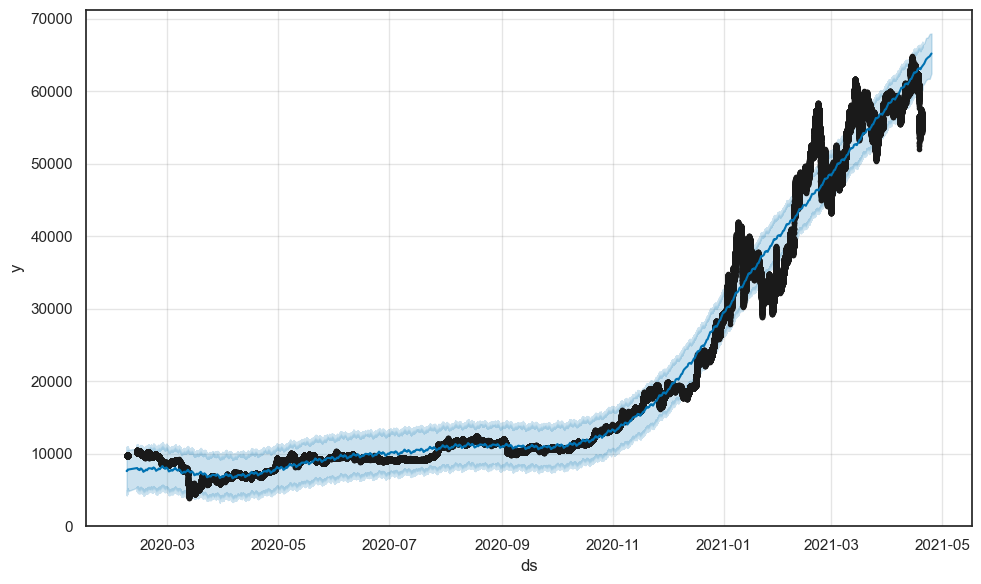

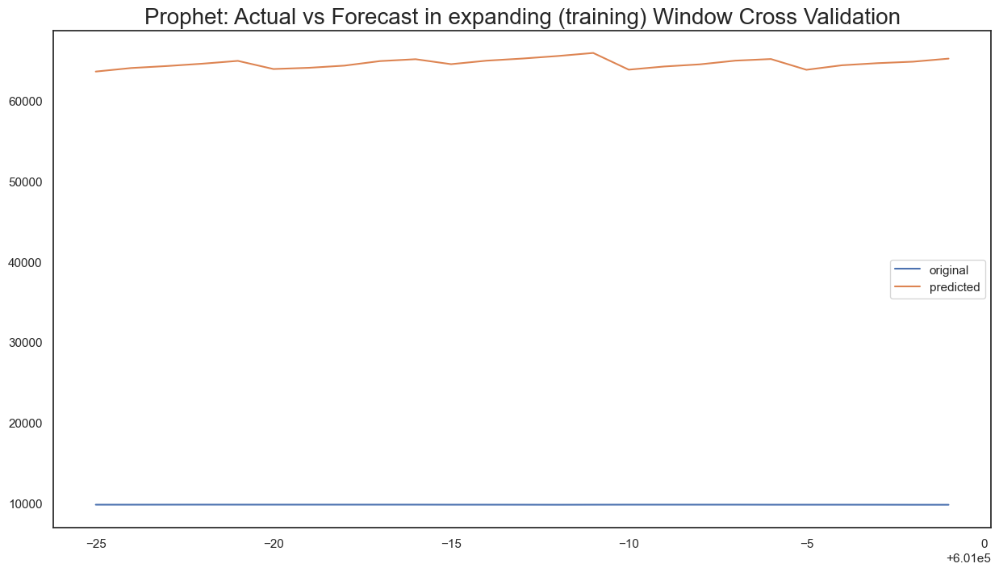

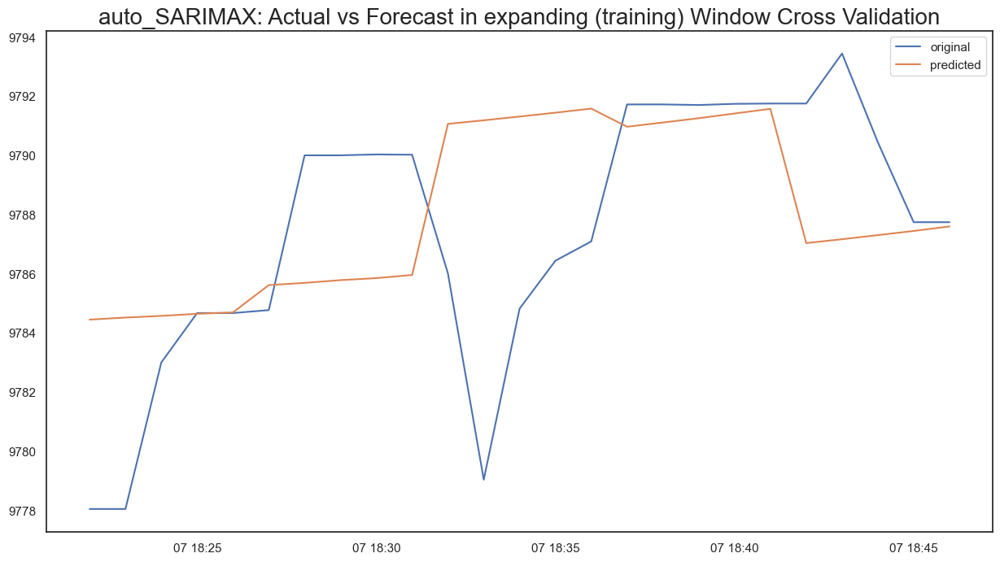

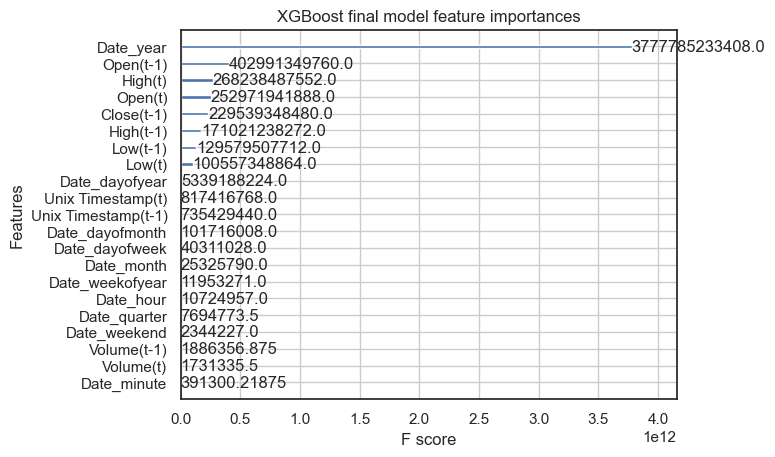

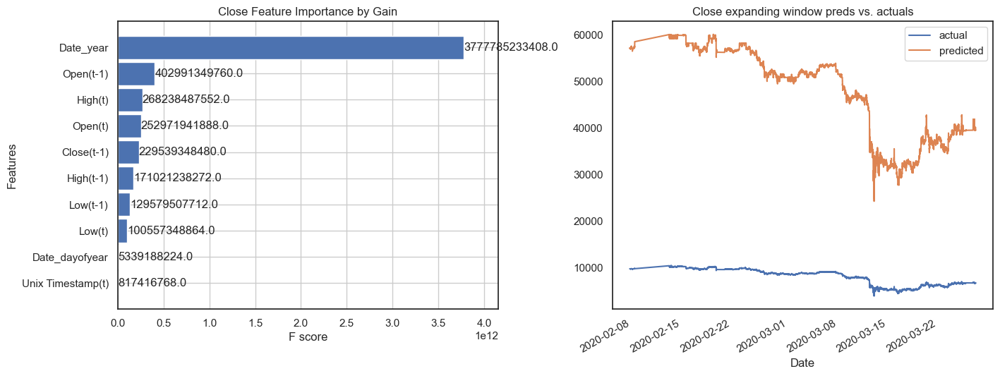

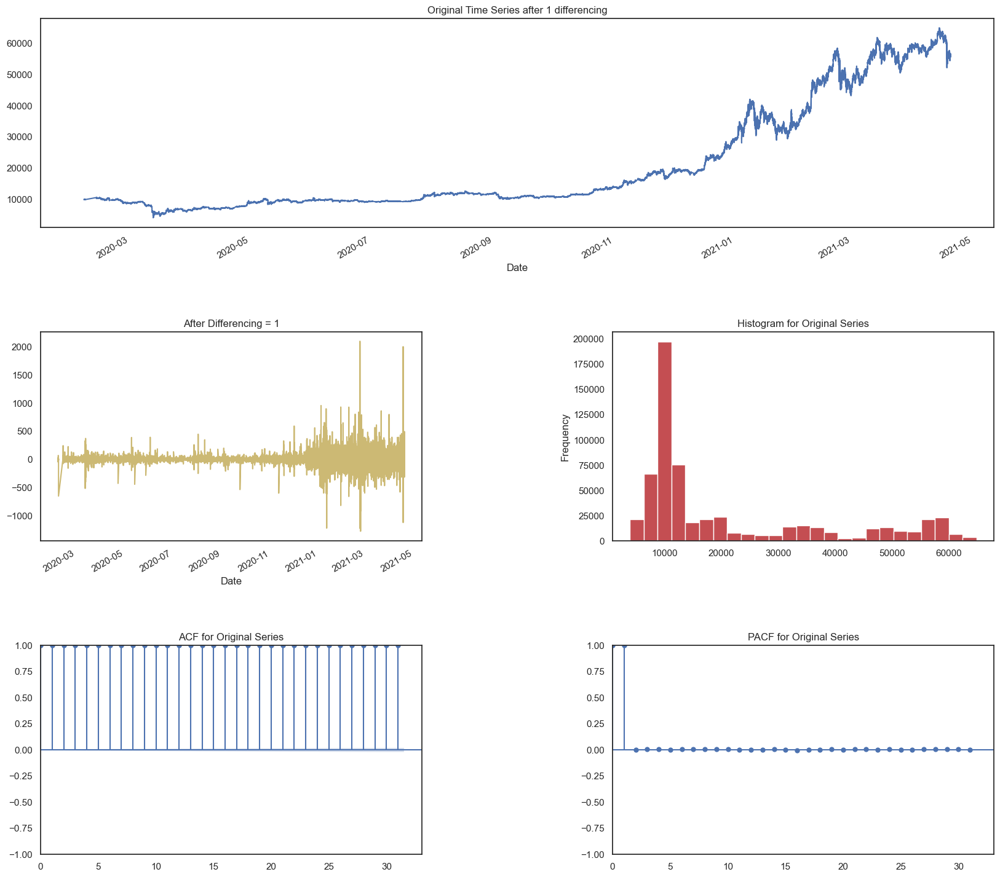

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


07:26:57 - cmdstanpy - INFO - Chain [1] start processing
07:27:21 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,555.40
    Std Deviation of actuals = 0.00
    Normalized RMSE (as pct of std dev) = inf%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


07:28:58 - cmdstanpy - INFO - Chain [1] start processing
07:29:22 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,428.01
    Std Deviation of actuals = 0.00
    Normalized RMSE (as pct of std dev) = inf%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


07:30:58 - cmdstanpy - INFO - Chain [1] start processing
07:31:23 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,001.41
    Std Deviation of actuals = 0.00
    Normalized RMSE (as pct of std dev) = inf%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


07:32:59 - cmdstanpy - INFO - Chain [1] start processing
07:33:23 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,684.31
    Std Deviation of actuals = 0.00
    Normalized RMSE (as pct of std dev) = inf%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


07:35:00 - cmdstanpy - INFO - Chain [1] start processing
07:35:26 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,176.07
    Std Deviation of actuals = 0.00
    Normalized RMSE (as pct of std dev) = inf%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 55166.95
    MSE (Mean Squared Error = 3043821527.49
    MAPE (Mean Absolute Percent Error) = 564%
    RMSE (Root Mean Squared Error) = 55170.8395
    Normalized RMSE (MinMax) = inf%
    Normalized RMSE (as Std Dev of Actuals)= inf%
Time Taken = 606 seconds


07:37:03 - cmdstanpy - INFO - Chain [1] start processing
07:37:28 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043104.785
Static Forecasts:
    RMSE = 0.28
    Std Deviation of Actuals = 0.00
    Normalized RMSE (as pct of std dev) = inf%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043150.071
Static Forecasts:
    RMSE = 0.28
    Std Deviation of Actuals = 0.00
    Normalized RMSE (as pct of std dev) = inf%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    Findi

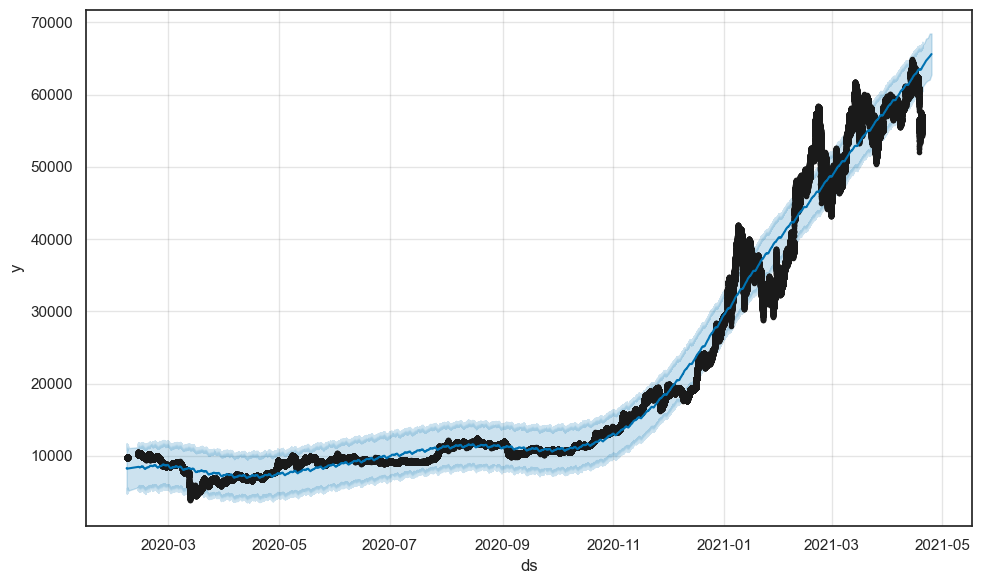

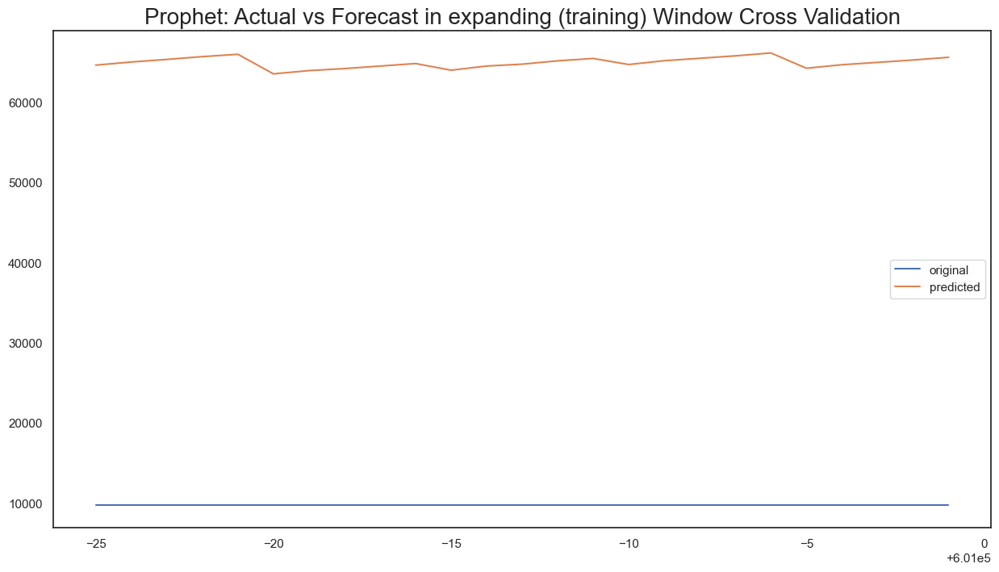

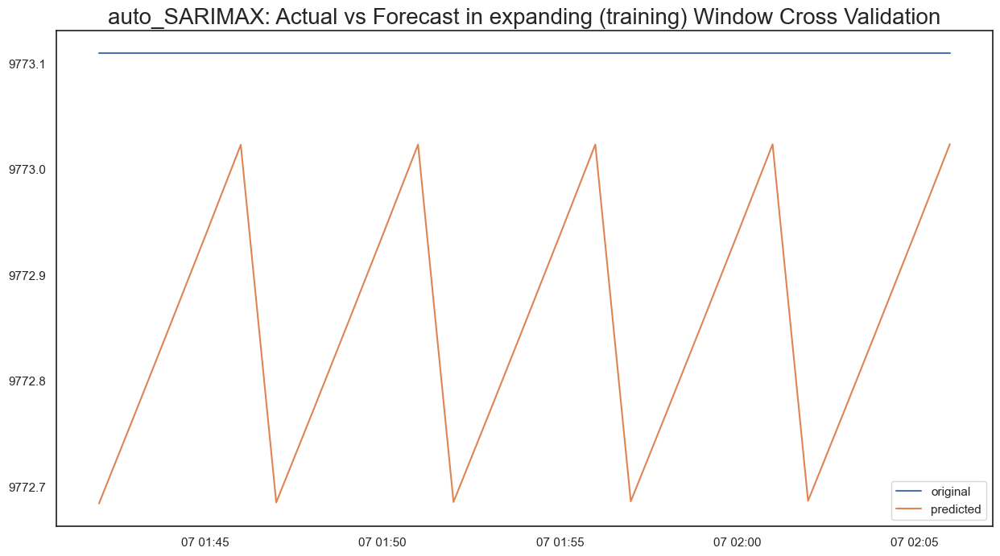

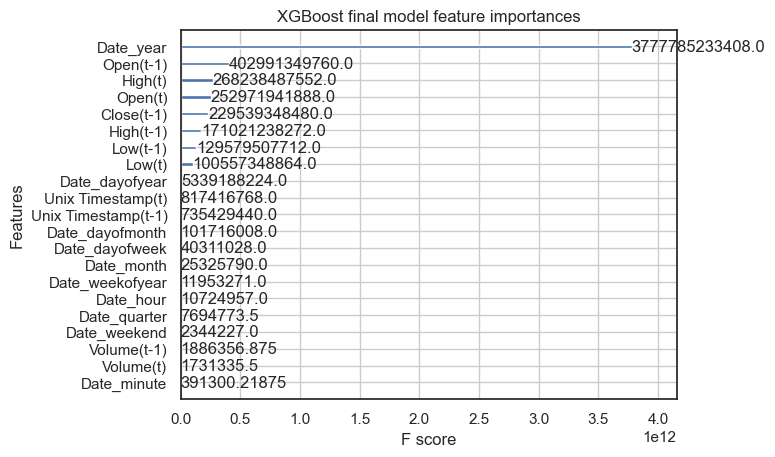

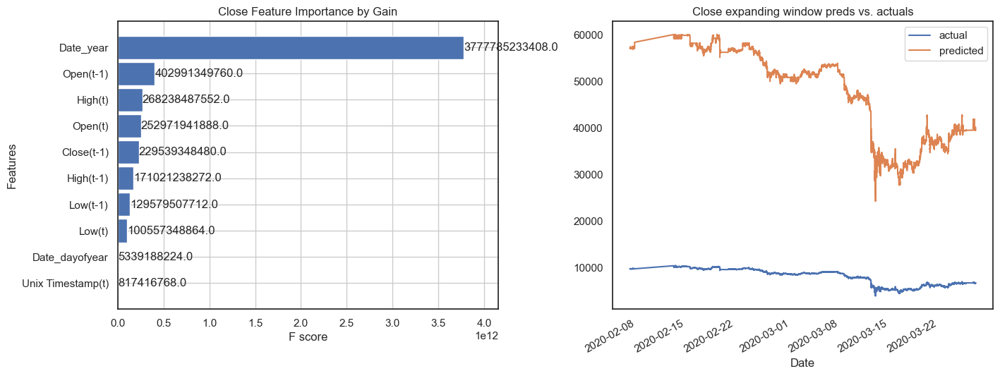

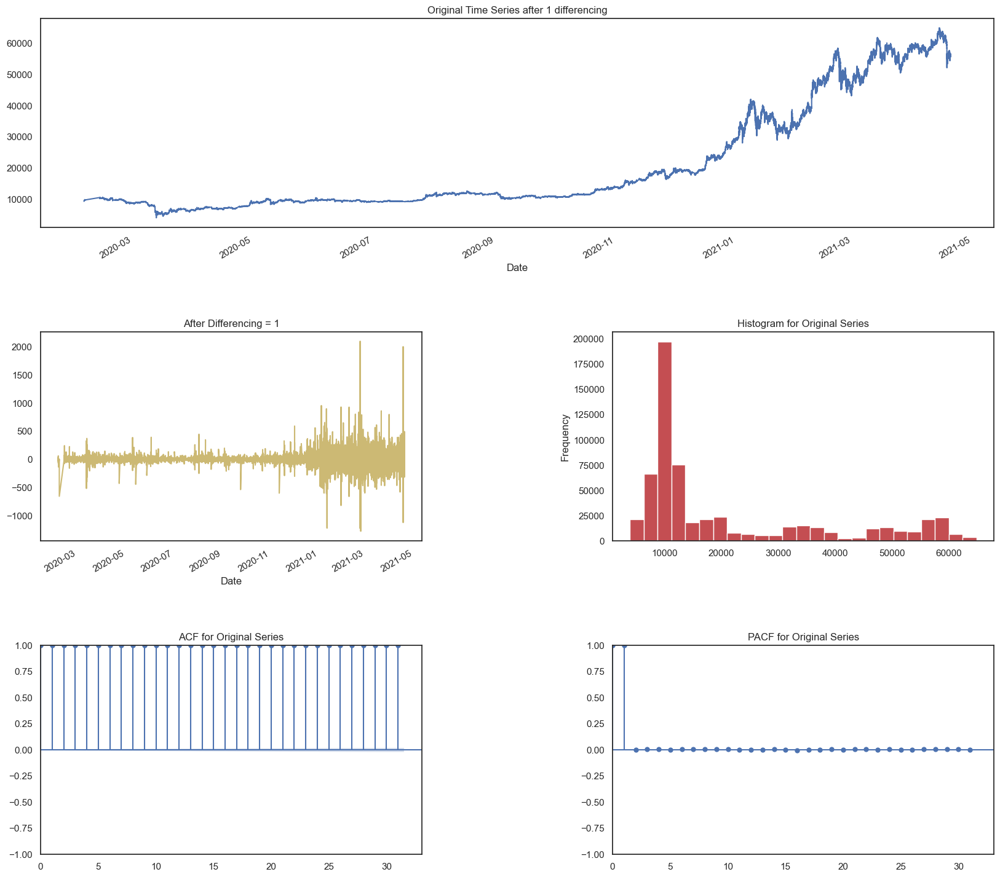

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


09:59:27 - cmdstanpy - INFO - Chain [1] start processing
09:59:51 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 56,113.03
    Std Deviation of actuals = 0.00
    Normalized RMSE (as pct of std dev) = inf%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


10:01:28 - cmdstanpy - INFO - Chain [1] start processing
10:01:53 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,883.14
    Std Deviation of actuals = 1.00
    Normalized RMSE (as pct of std dev) = 5591715%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


10:03:29 - cmdstanpy - INFO - Chain [1] start processing
10:03:55 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,161.98
    Std Deviation of actuals = 2.27
    Normalized RMSE (as pct of std dev) = 2434535%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


10:05:32 - cmdstanpy - INFO - Chain [1] start processing
10:05:56 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,317.70
    Std Deviation of actuals = 3.19
    Normalized RMSE (as pct of std dev) = 1735075%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


10:07:33 - cmdstanpy - INFO - Chain [1] start processing
10:07:58 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 56,644.08
    Std Deviation of actuals = 1.78
    Normalized RMSE (as pct of std dev) = 3174913%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 55822.23
    MSE (Mean Squared Error = 3116608450.74
    MAPE (Mean Absolute Percent Error) = 605%
    RMSE (Root Mean Squared Error) = 55826.5927
    Normalized RMSE (MinMax) = 439926%
    Normalized RMSE (as Std Dev of Actuals)= 1249989%
Time Taken = 607 seconds


10:09:34 - cmdstanpy - INFO - Chain [1] start processing
10:09:59 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043141.680
Static Forecasts:
    RMSE = 0.20
    Std Deviation of Actuals = 0.00
    Normalized RMSE (as pct of std dev) = inf%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043186.959
Static Forecasts:
    RMSE = 7.44
    Std Deviation of Actuals = 1.00
    Normalized RMSE (as pct of std dev) = 744.0%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    Fin

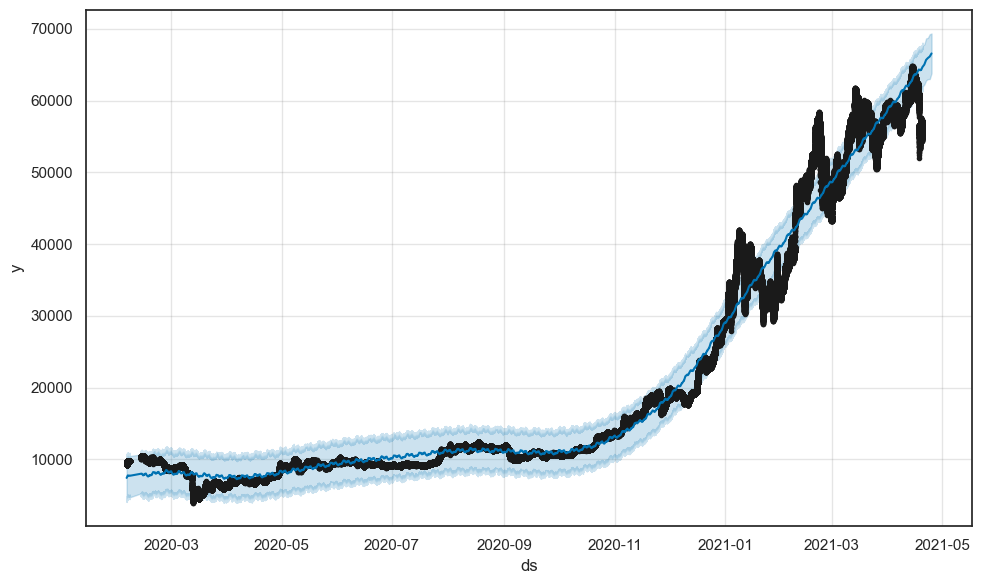

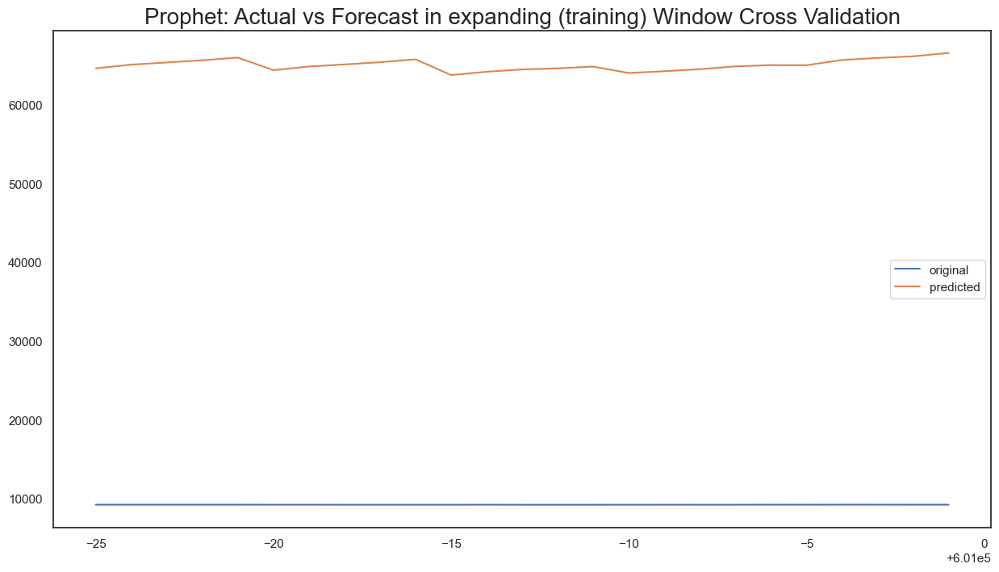

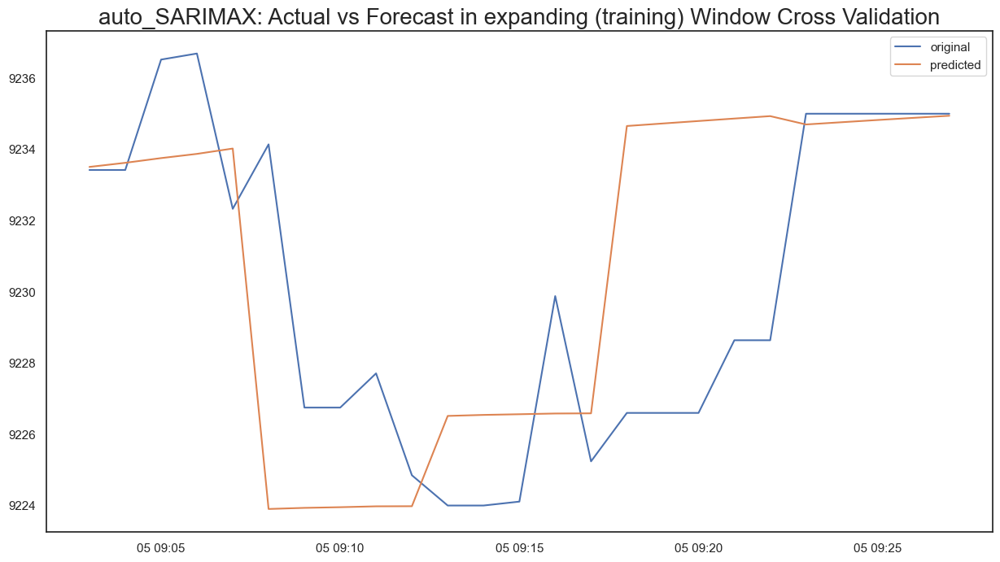

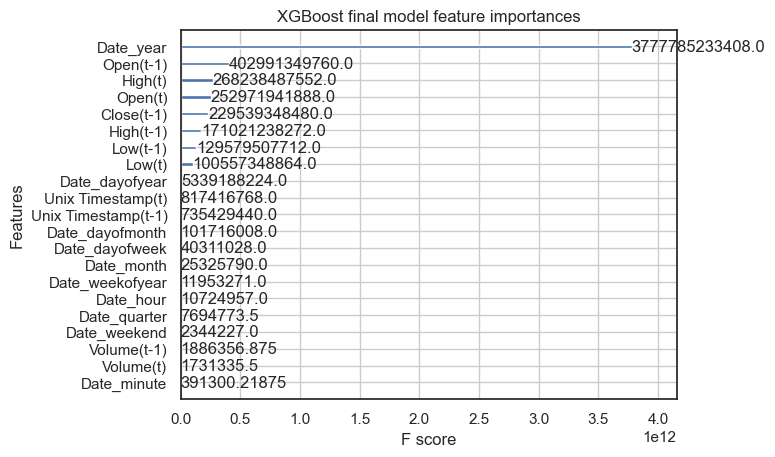

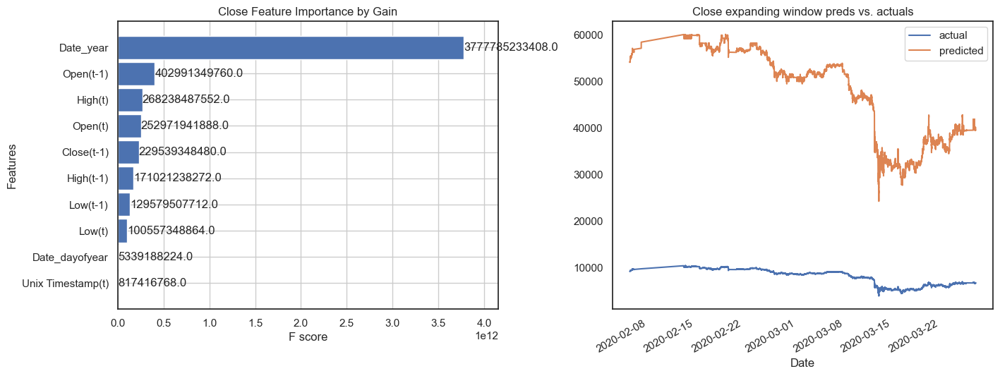

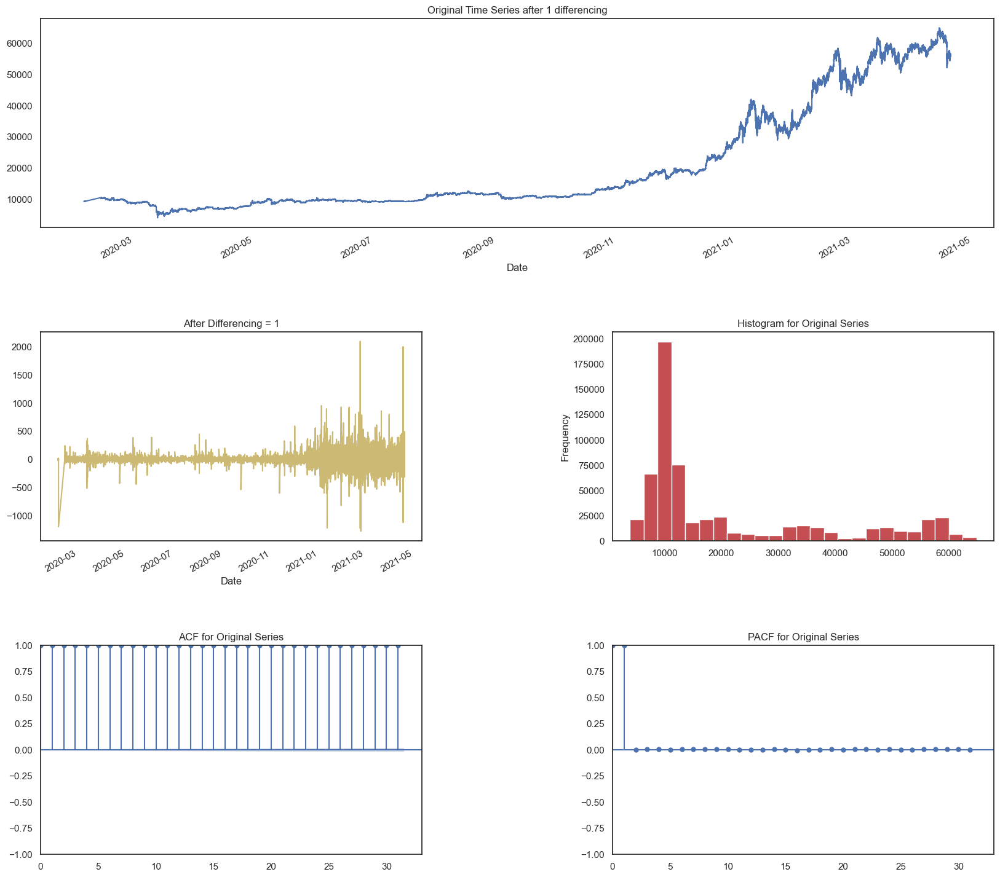

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


12:31:26 - cmdstanpy - INFO - Chain [1] start processing
12:31:51 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,747.46
    Std Deviation of actuals = 0.11
    Normalized RMSE (as pct of std dev) = 49475661%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


12:33:26 - cmdstanpy - INFO - Chain [1] start processing
12:33:50 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,134.83
    Std Deviation of actuals = 1.72
    Normalized RMSE (as pct of std dev) = 3201944%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


12:35:26 - cmdstanpy - INFO - Chain [1] start processing
12:35:49 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,120.70
    Std Deviation of actuals = 3.37
    Normalized RMSE (as pct of std dev) = 1634419%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


12:37:24 - cmdstanpy - INFO - Chain [1] start processing
12:37:48 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,456.65
    Std Deviation of actuals = 3.11
    Normalized RMSE (as pct of std dev) = 1785921%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


12:39:23 - cmdstanpy - INFO - Chain [1] start processing
12:39:46 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,434.69
    Std Deviation of actuals = 9.83
    Normalized RMSE (as pct of std dev) = 563931%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 55377.06
    MSE (Mean Squared Error = 3066872988.31
    MAPE (Mean Absolute Percent Error) = 602%
    RMSE (Root Mean Squared Error) = 55379.3553
    Normalized RMSE (MinMax) = 187156%
    Normalized RMSE (as Std Dev of Actuals)= 545273%
Time Taken = 595 seconds


12:41:22 - cmdstanpy - INFO - Chain [1] start processing
12:41:48 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043831.776
Static Forecasts:
    RMSE = 0.34
    Std Deviation of Actuals = 0.11
    Normalized RMSE (as pct of std dev) = 304.3%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043877.056
Static Forecasts:
    RMSE = 1.91
    Std Deviation of Actuals = 1.72
    Normalized RMSE (as pct of std dev) = 111.2%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    F

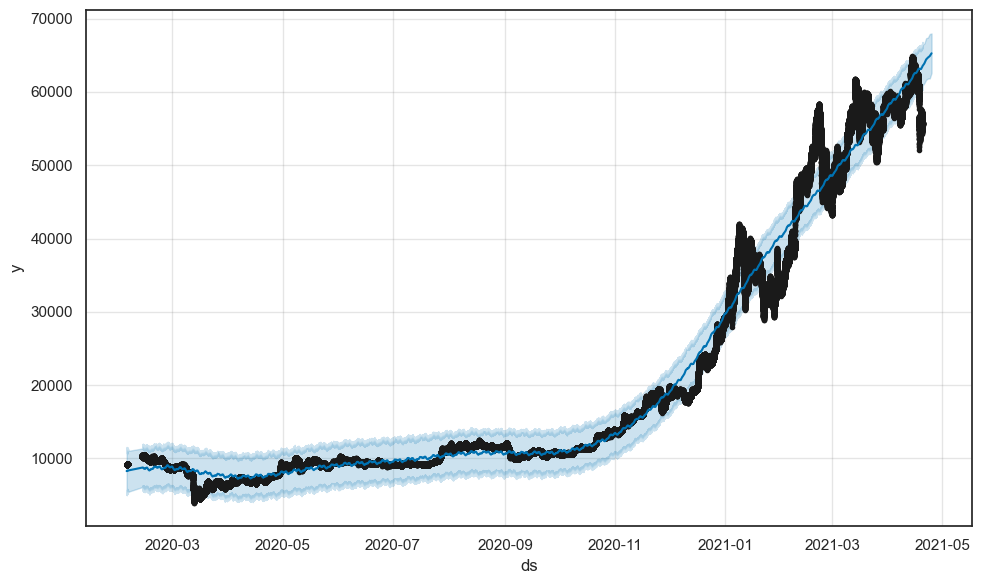

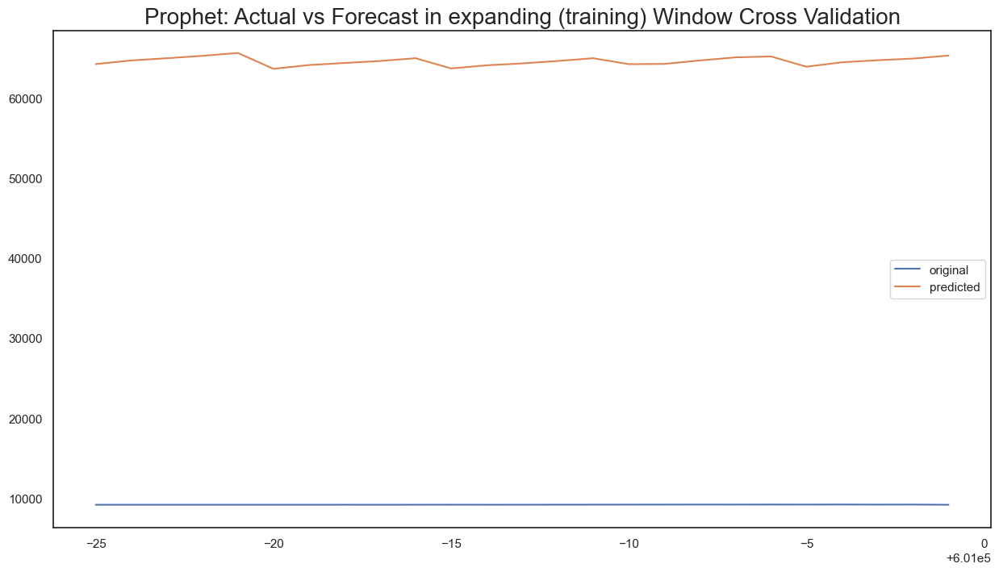

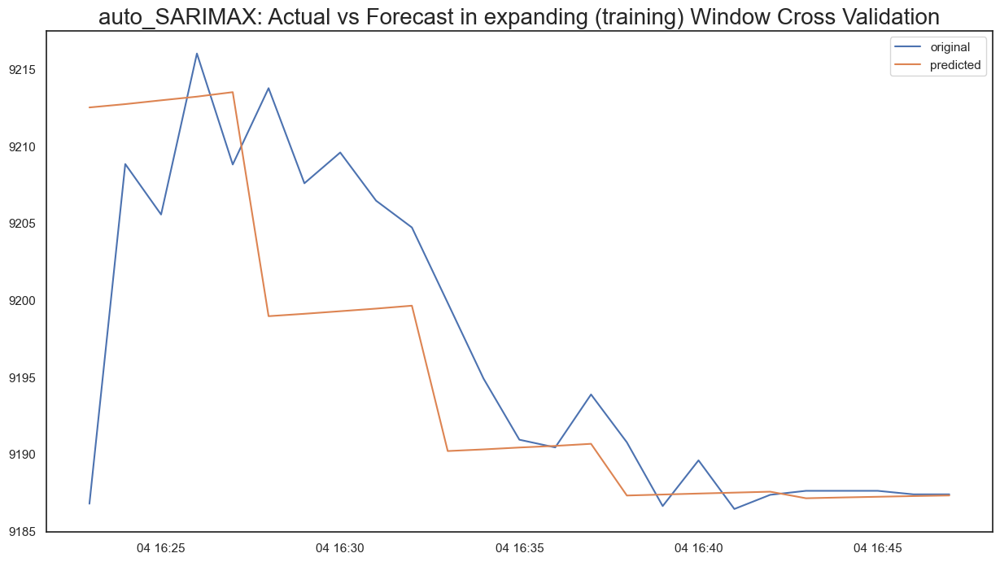

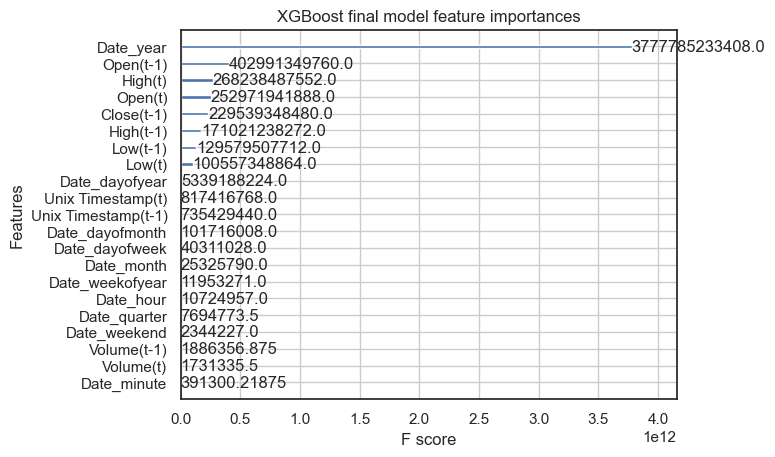

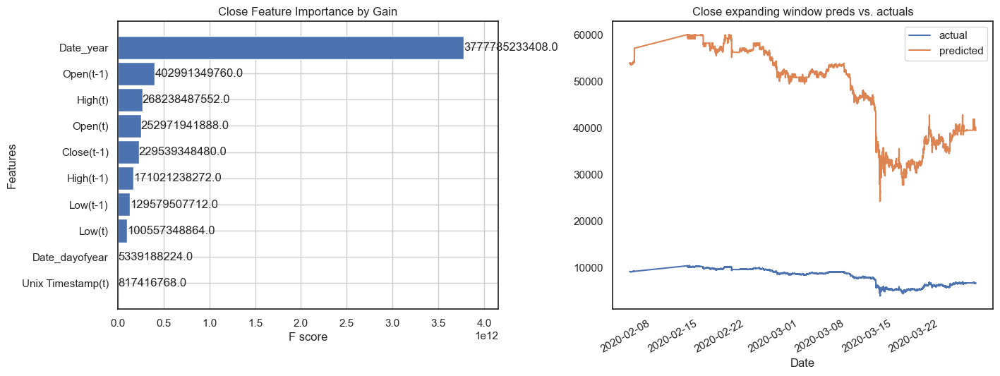

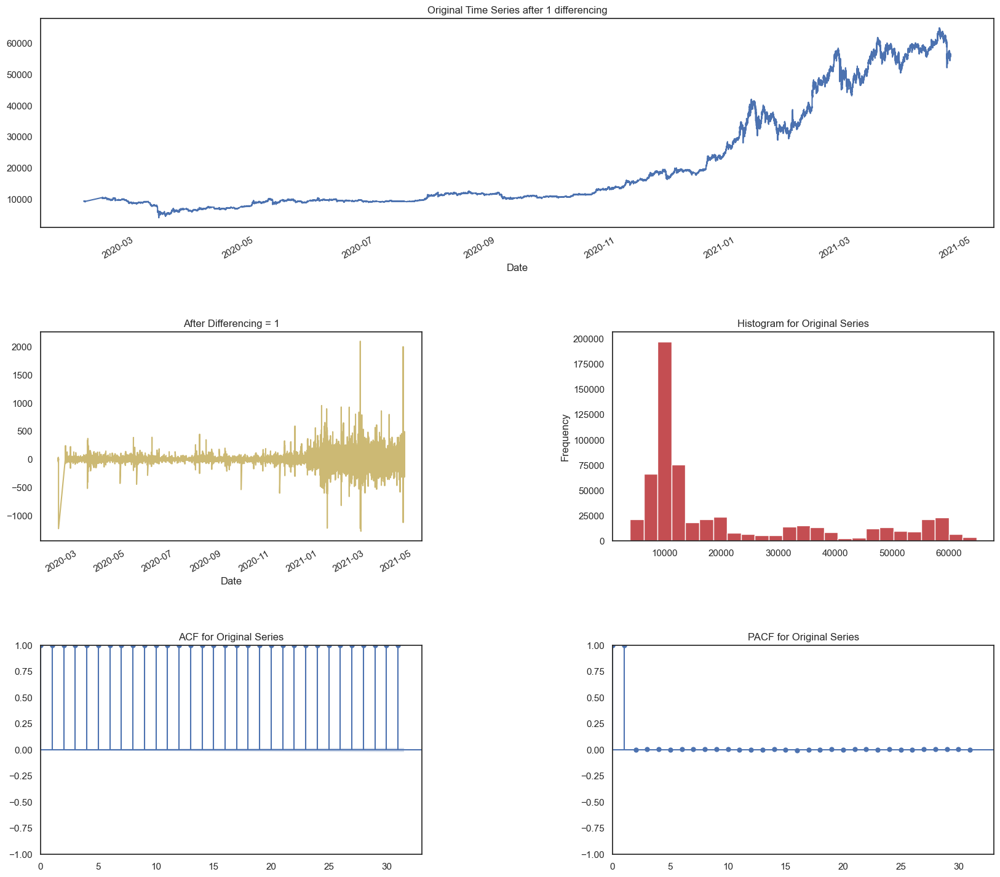

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


14:52:51 - cmdstanpy - INFO - Chain [1] start processing
14:53:15 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,434.57
    Std Deviation of actuals = 3.14
    Normalized RMSE (as pct of std dev) = 1763743%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


14:54:51 - cmdstanpy - INFO - Chain [1] start processing
14:55:16 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,860.23
    Std Deviation of actuals = 3.63
    Normalized RMSE (as pct of std dev) = 1512417%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


14:56:51 - cmdstanpy - INFO - Chain [1] start processing
14:57:16 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 56,273.96
    Std Deviation of actuals = 3.52
    Normalized RMSE (as pct of std dev) = 1600369%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


14:58:51 - cmdstanpy - INFO - Chain [1] start processing
14:59:15 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,639.81
    Std Deviation of actuals = 4.90
    Normalized RMSE (as pct of std dev) = 1136127%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


15:00:50 - cmdstanpy - INFO - Chain [1] start processing
15:01:14 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,248.48
    Std Deviation of actuals = 4.28
    Normalized RMSE (as pct of std dev) = 1290481%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 55489.34
    MSE (Mean Squared Error = 3079515771.20
    MAPE (Mean Absolute Percent Error) = 597%
    RMSE (Root Mean Squared Error) = 55493.3849
    Normalized RMSE (MinMax) = 246309%
    Normalized RMSE (as Std Dev of Actuals)= 944171%
Time Taken = 598 seconds


15:02:49 - cmdstanpy - INFO - Chain [1] start processing
15:03:14 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043907.201
Static Forecasts:
    RMSE = 9.72
    Std Deviation of Actuals = 3.14
    Normalized RMSE (as pct of std dev) = 309.2%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043952.528
Static Forecasts:
    RMSE = 11.12
    Std Deviation of Actuals = 3.63
    Normalized RMSE (as pct of std dev) = 306.5%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    

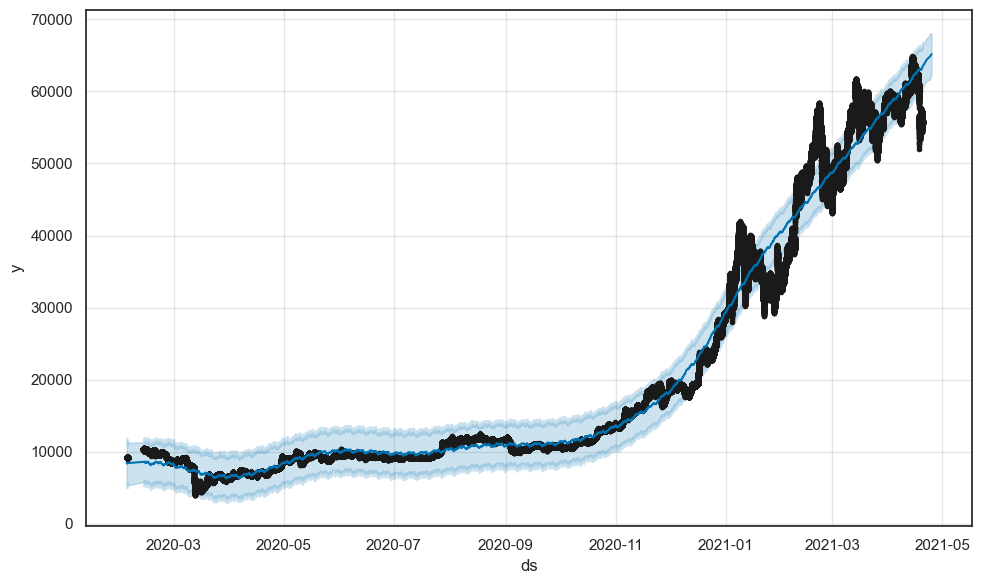

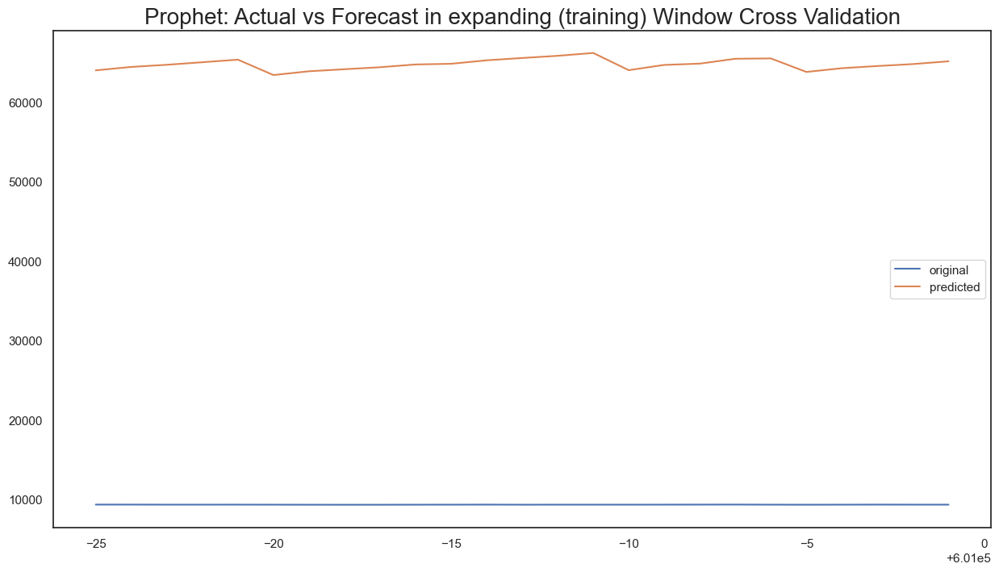

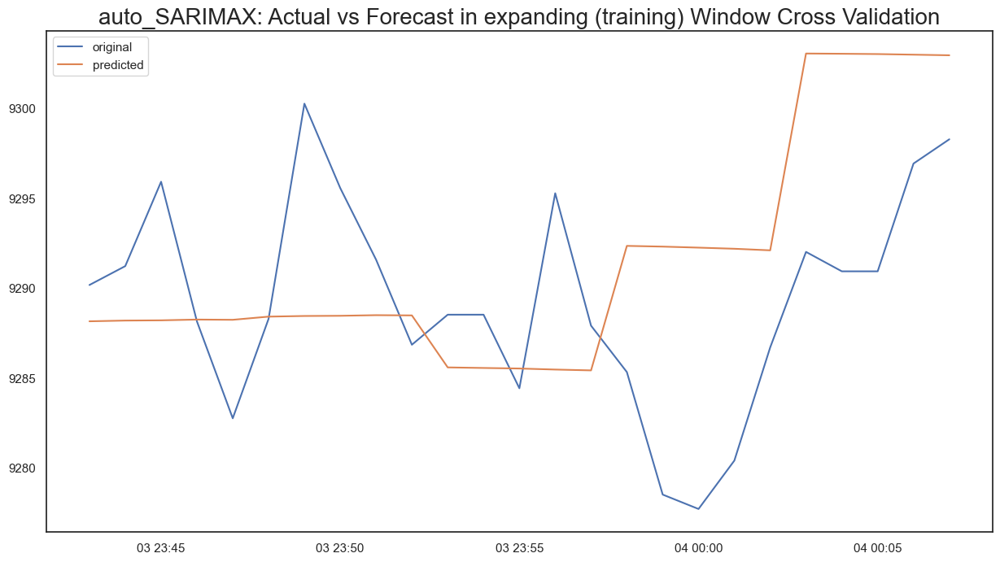

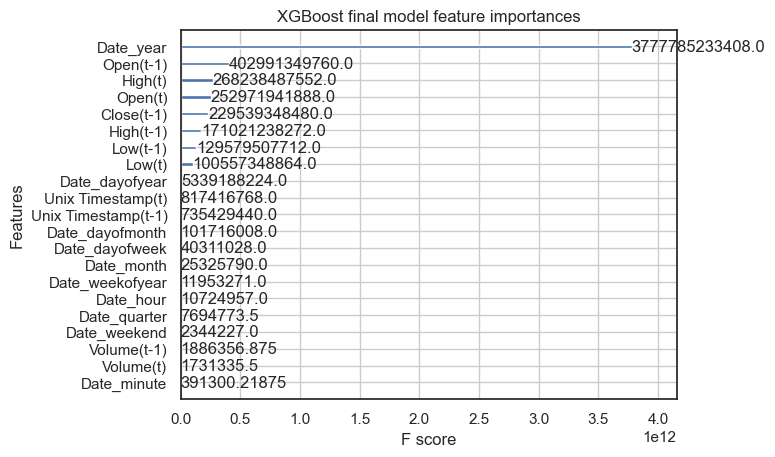

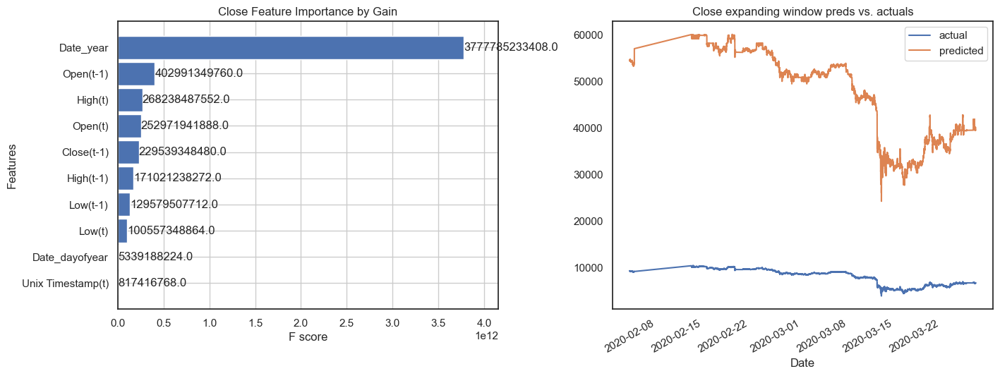

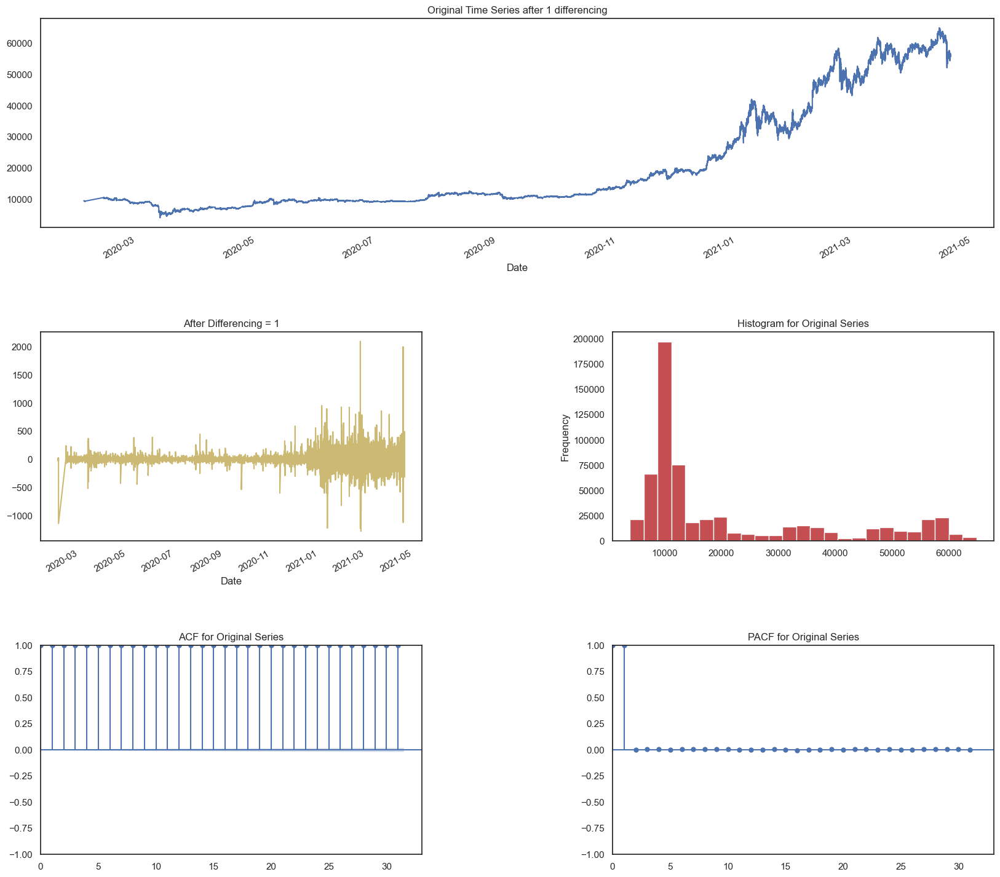

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


17:09:16 - cmdstanpy - INFO - Chain [1] start processing
17:09:41 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,153.46
    Std Deviation of actuals = 4.00
    Normalized RMSE (as pct of std dev) = 1378837%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


17:11:17 - cmdstanpy - INFO - Chain [1] start processing
17:11:41 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,660.78
    Std Deviation of actuals = 4.62
    Normalized RMSE (as pct of std dev) = 1203997%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


17:13:18 - cmdstanpy - INFO - Chain [1] start processing
17:13:43 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,090.10
    Std Deviation of actuals = 1.04
    Normalized RMSE (as pct of std dev) = 5300753%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


17:15:21 - cmdstanpy - INFO - Chain [1] start processing
17:15:45 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,993.26
    Std Deviation of actuals = 1.16
    Normalized RMSE (as pct of std dev) = 4756776%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


17:17:21 - cmdstanpy - INFO - Chain [1] start processing
17:17:45 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,974.10
    Std Deviation of actuals = 12.88
    Normalized RMSE (as pct of std dev) = 426965%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 55172.44
    MSE (Mean Squared Error = 3044271572.84
    MAPE (Mean Absolute Percent Error) = 589%
    RMSE (Root Mean Squared Error) = 55174.9180
    Normalized RMSE (MinMax) = 127043%
    Normalized RMSE (as Std Dev of Actuals)= 649917%
Time Taken = 605 seconds


17:19:21 - cmdstanpy - INFO - Chain [1] start processing
17:19:45 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043741.053
Static Forecasts:
    RMSE = 12.11
    Std Deviation of Actuals = 4.00
    Normalized RMSE (as pct of std dev) = 302.8%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043786.424
Static Forecasts:
    RMSE = 10.93
    Std Deviation of Actuals = 4.62
    Normalized RMSE (as pct of std dev) = 236.3%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

   

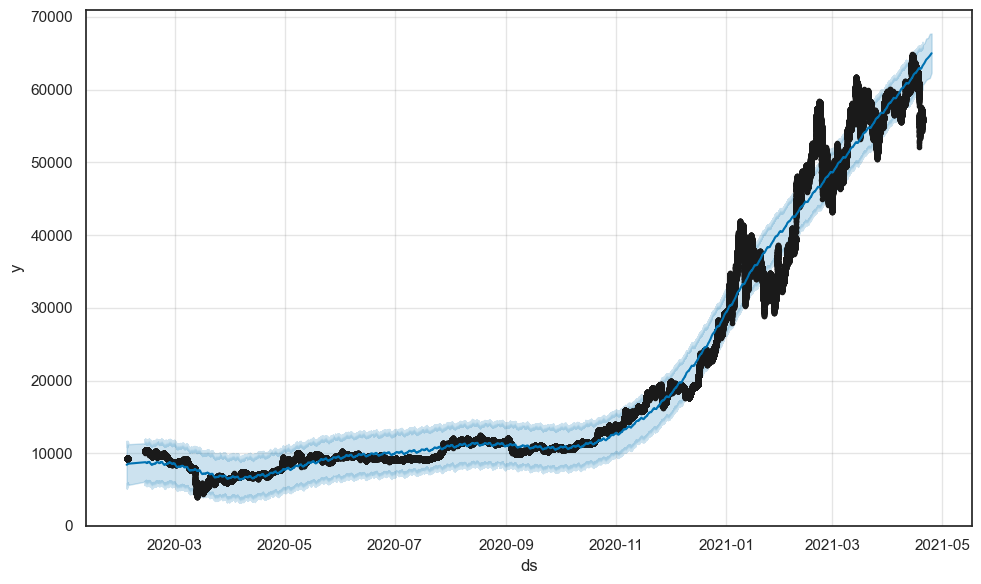

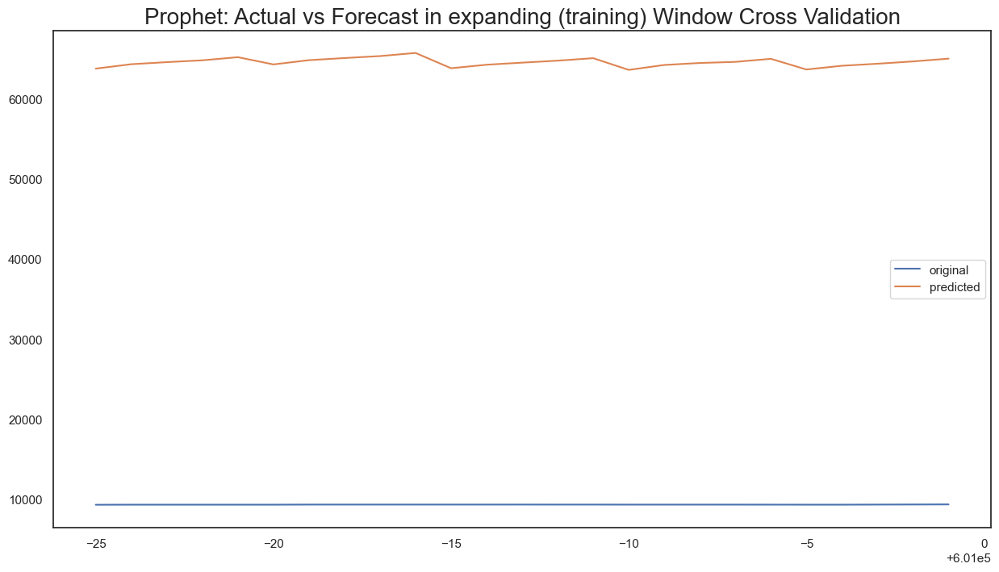

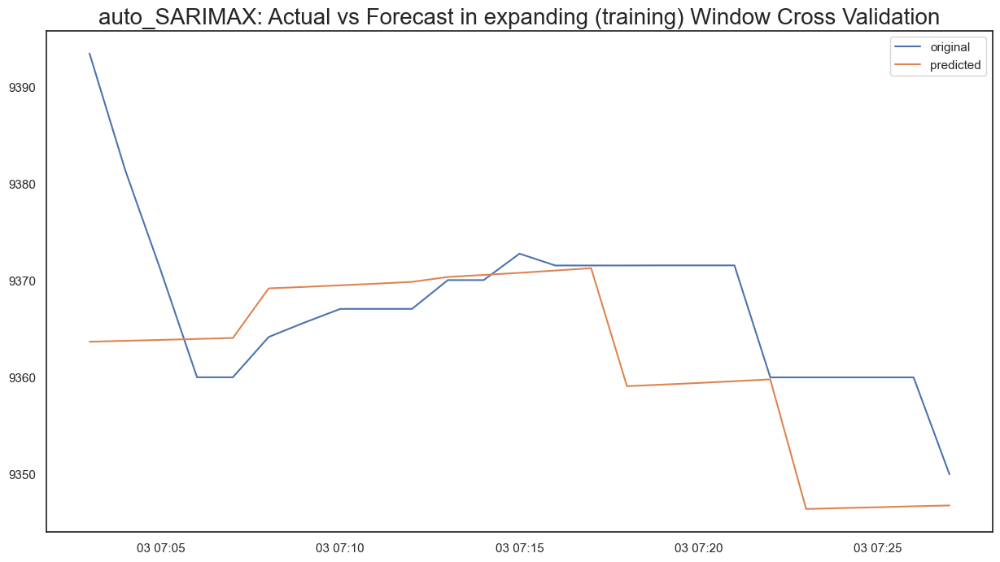

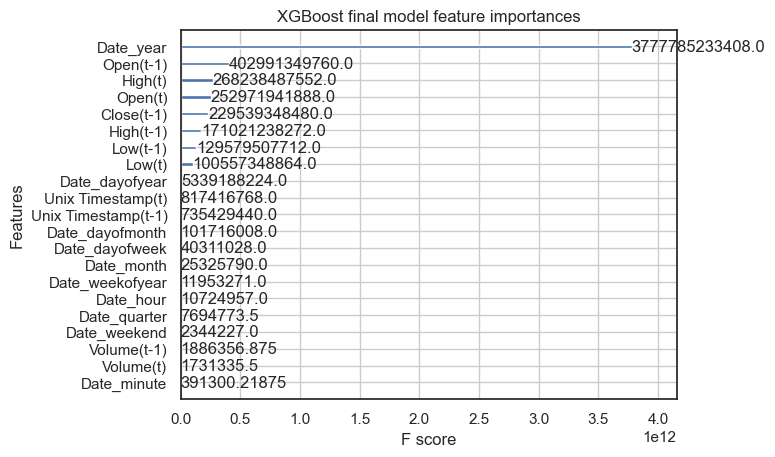

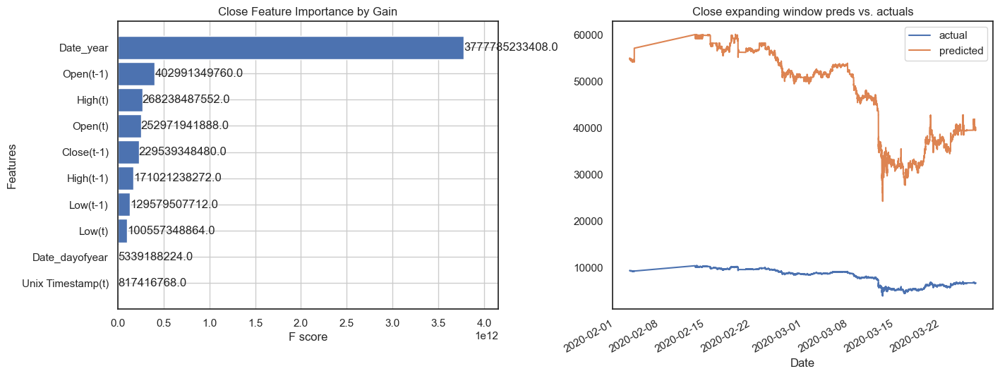

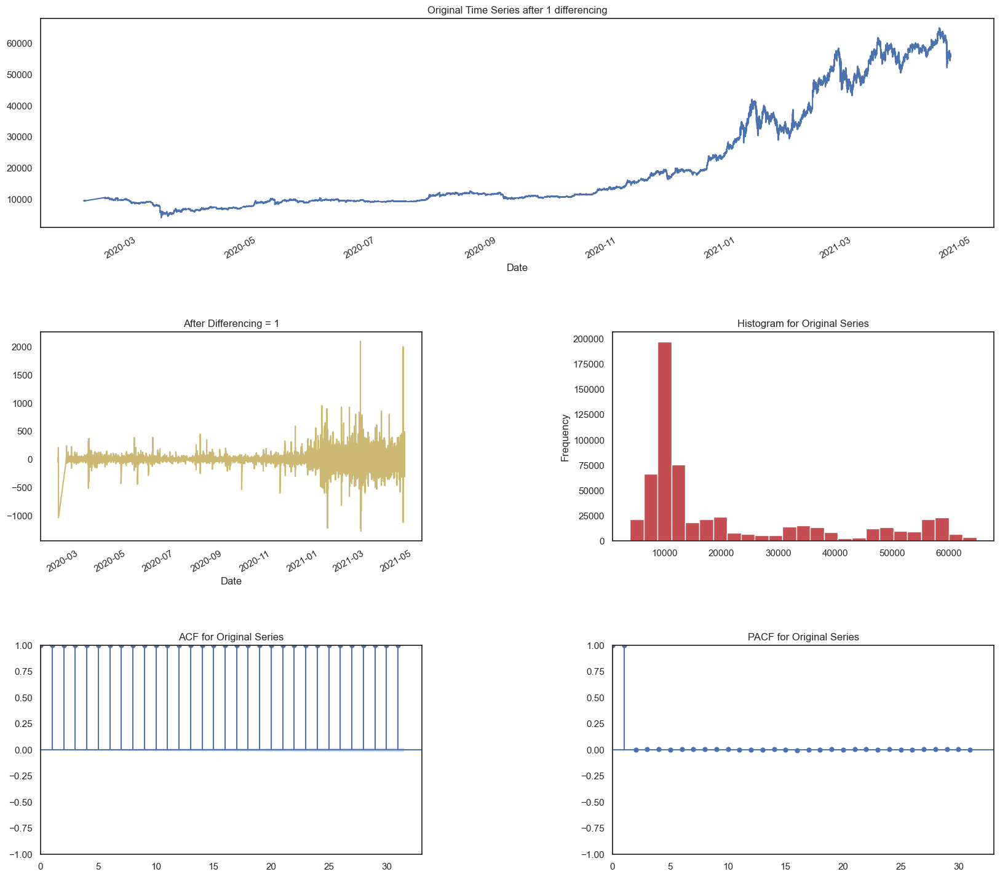

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


19:40:14 - cmdstanpy - INFO - Chain [1] start processing
19:40:39 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,239.51
    Std Deviation of actuals = 4.29
    Normalized RMSE (as pct of std dev) = 1289006%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


19:42:14 - cmdstanpy - INFO - Chain [1] start processing
19:42:39 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,813.22
    Std Deviation of actuals = 3.09
    Normalized RMSE (as pct of std dev) = 1806336%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


19:44:14 - cmdstanpy - INFO - Chain [1] start processing
19:44:39 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,118.06
    Std Deviation of actuals = 7.01
    Normalized RMSE (as pct of std dev) = 786416%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


19:46:13 - cmdstanpy - INFO - Chain [1] start processing
19:46:39 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,004.40
    Std Deviation of actuals = 6.15
    Normalized RMSE (as pct of std dev) = 893953%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


19:48:13 - cmdstanpy - INFO - Chain [1] start processing
19:48:38 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 56,099.53
    Std Deviation of actuals = 7.79
    Normalized RMSE (as pct of std dev) = 719905%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 55453.04
    MSE (Mean Squared Error = 3075432554.70
    MAPE (Mean Absolute Percent Error) = 588%
    RMSE (Root Mean Squared Error) = 55456.5826
    Normalized RMSE (MinMax) = 88631%
    Normalized RMSE (as Std Dev of Actuals)= 268521%
Time Taken = 600 seconds


19:50:14 - cmdstanpy - INFO - Chain [1] start processing
19:50:38 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043621.457
Static Forecasts:
    RMSE = 7.42
    Std Deviation of Actuals = 4.29
    Normalized RMSE (as pct of std dev) = 173.0%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043666.885
Static Forecasts:
    RMSE = 5.52
    Std Deviation of Actuals = 3.09
    Normalized RMSE (as pct of std dev) = 178.7%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    F

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from auto_ts import auto_timeseries
#from auto_timeseries import auto_timeseries

# Прочитаем данные
df = pd.read_csv('C://Users//Vlada//Documents//Business//AI//bitcoin.csv')

# Преобразуем дату
df['Date'] = pd.to_datetime(df['Date'])

# Разделим данные на тренировочную и проверочную выборки
train, val = df.iloc[:600000], df.iloc[600000:]

# Удаляем ненужный столбец
train = train.drop(columns=['Symbol'], errors='ignore')

# Параметры
N = 1000  # Количество экземпляров, которые будем добавлять
model = auto_timeseries(score_type='rmse',
                        time_interval='D',
                        model_type='best',
                        verbose=1)

# Список для хранения предсказаний
predictions = []

# Обучение модели с динамическим добавлением данных
for i in range(0, len(val), N):
    # Добавляем N новых экземпляров в тренировочную выборку
    current_train = pd.concat([train, val.iloc[i:i+N]])
    current_train = current_train.drop(columns=['Symbol'], errors='ignore')
    
    # Обучаем модель
    model.fit(traindata=current_train,
              ts_column='Date',
              target='Close')

    # Прогнозируем для оставшейся части проверочной выборки
    pred = model.predict(val.iloc[i+N:], model='best')['yhat'].to_numpy(float)

    # Сохраняем предсказания
    predictions.extend(pred)

# График
plt.figure(figsize=(20, 10))
plt.plot(val['Date'].iloc[N:], predictions, label='Прогноз')
plt.plot(val['Date'].iloc[N:], val['Close'].iloc[N:], label='Факт')
plt.legend()
plt.grid()
plt.show()


Start of Fit.....
    Target variable given as = Close
Start of loading of data.....
    Inputs: ts_column = Date, sep = ,, target = ['Close']
    Using given input: pandas dataframe...
    Date column exists in given train data...
    train data shape = (601000, 6)
Alert: Could not detect strf_time_format of Date. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Data is stationary after one differencing
There is 1 differencing needed in this datasets for VAR model


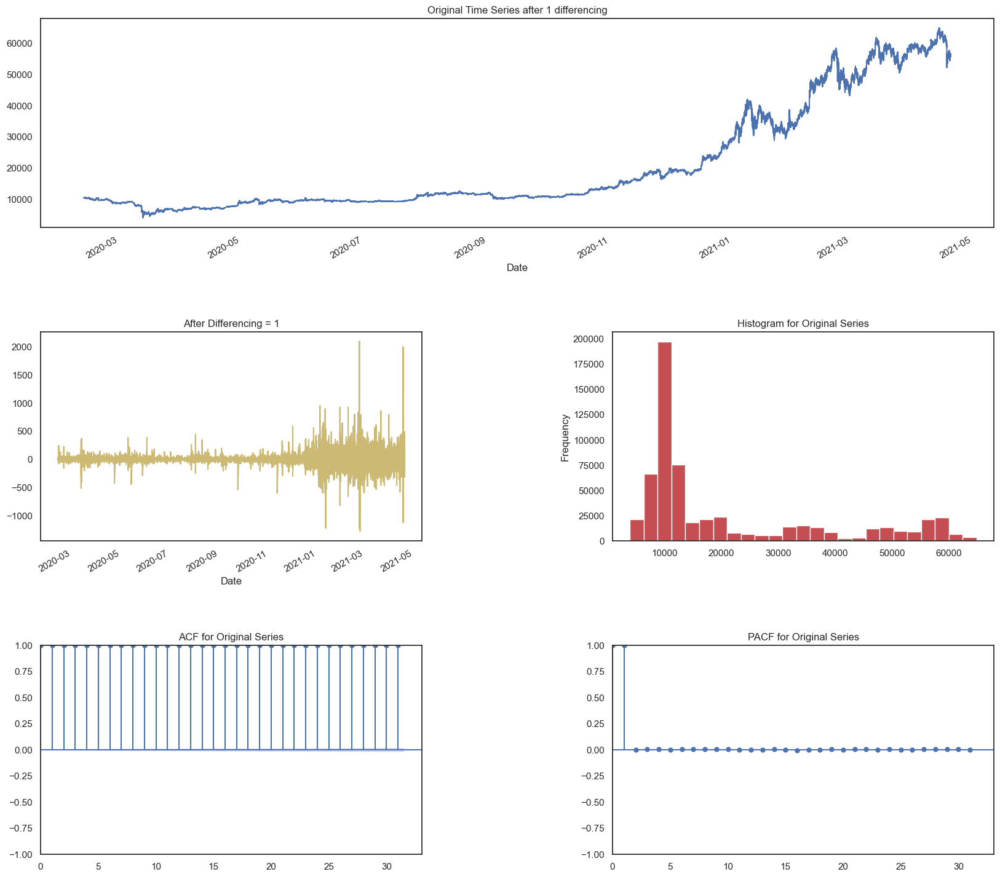

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


01:53:24 - cmdstanpy - INFO - Chain [1] start processing
01:53:49 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,372.88
    Std Deviation of actuals = 2.85
    Normalized RMSE (as pct of std dev) = 1905326%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


01:55:24 - cmdstanpy - INFO - Chain [1] start processing
01:55:49 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,628.91
    Std Deviation of actuals = 1.60
    Normalized RMSE (as pct of std dev) = 3468298%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


01:57:23 - cmdstanpy - INFO - Chain [1] start processing
01:57:47 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,427.10
    Std Deviation of actuals = 7.36
    Normalized RMSE (as pct of std dev) = 739489%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


01:59:21 - cmdstanpy - INFO - Chain [1] start processing
01:59:46 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,612.29
    Std Deviation of actuals = 5.30
    Normalized RMSE (as pct of std dev) = 1029675%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


02:01:20 - cmdstanpy - INFO - Chain [1] start processing
02:01:44 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,770.90
    Std Deviation of actuals = 2.71
    Normalized RMSE (as pct of std dev) = 2020695%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 54760.27
    MSE (Mean Squared Error = 2999129499.04
    MAPE (Mean Absolute Percent Error) = 529%
    RMSE (Root Mean Squared Error) = 54764.3086
    Normalized RMSE (MinMax) = 165551%
    Normalized RMSE (as Std Dev of Actuals)= 700180%
Time Taken = 594 seconds


02:03:18 - cmdstanpy - INFO - Chain [1] start processing
02:03:42 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6042799.566
Static Forecasts:
    RMSE = 6.01
    Std Deviation of Actuals = 2.85
    Normalized RMSE (as pct of std dev) = 210.6%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6042844.866
Static Forecasts:
    RMSE = 9.55
    Std Deviation of Actuals = 1.60
    Normalized RMSE (as pct of std dev) = 595.4%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    F

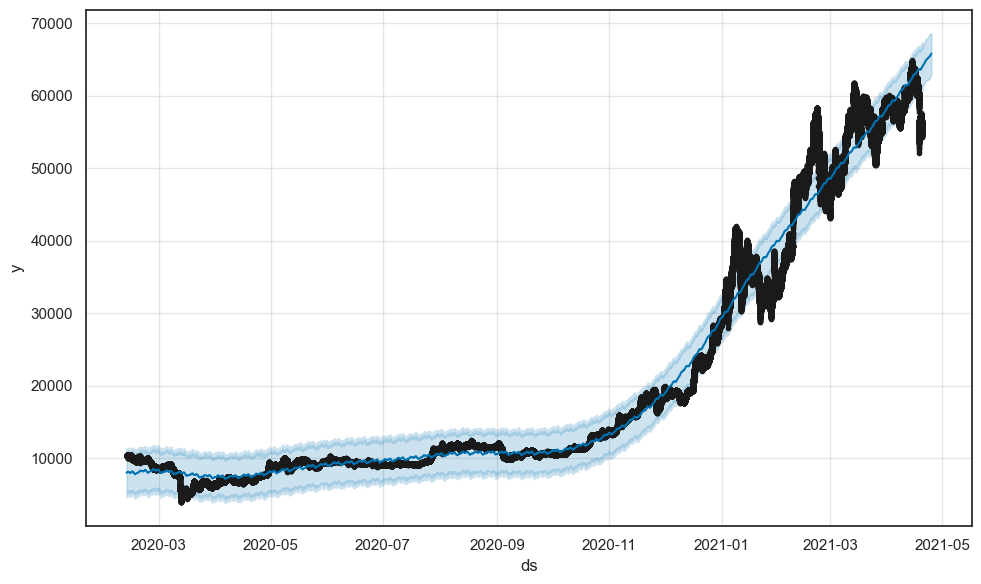

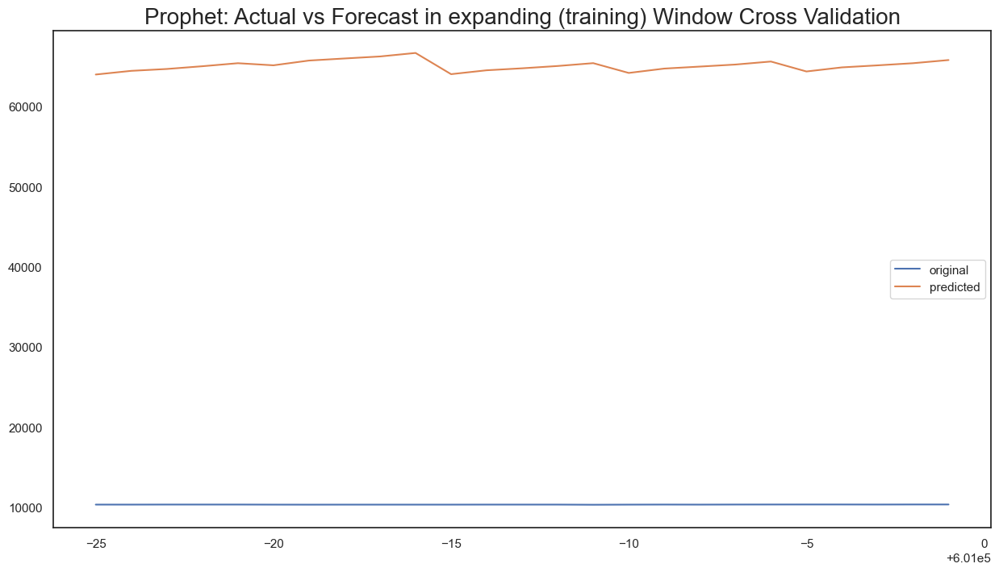

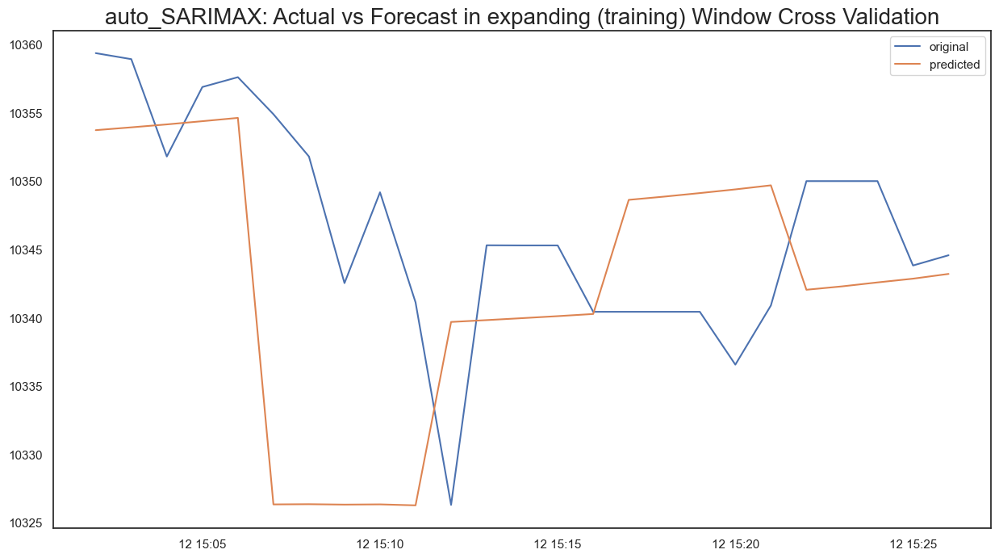

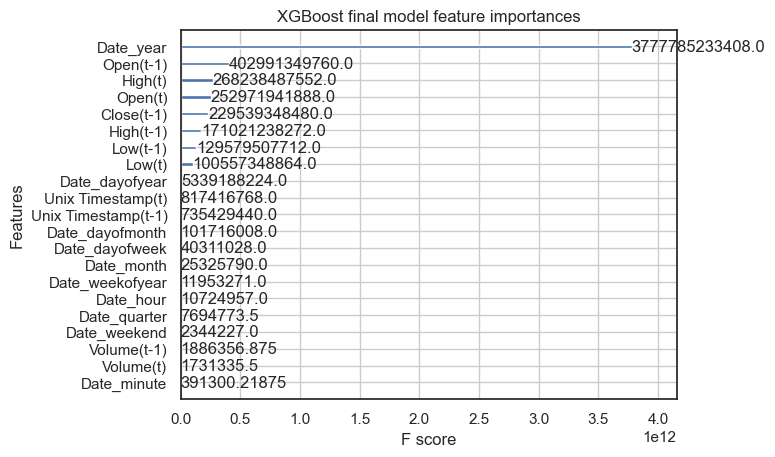

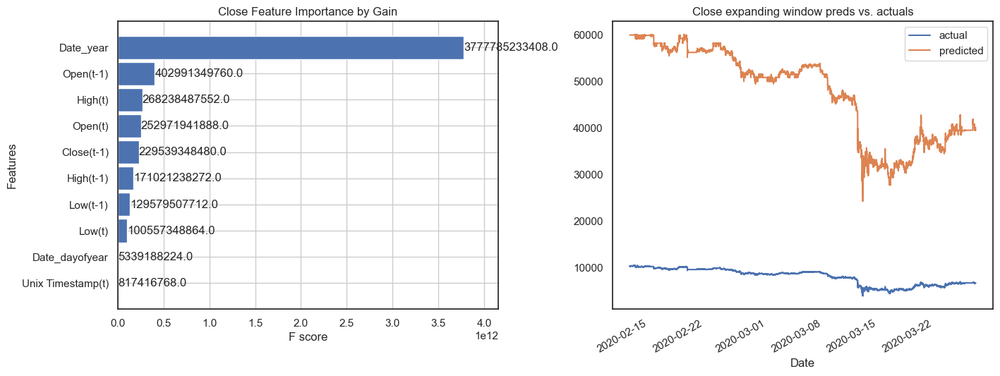

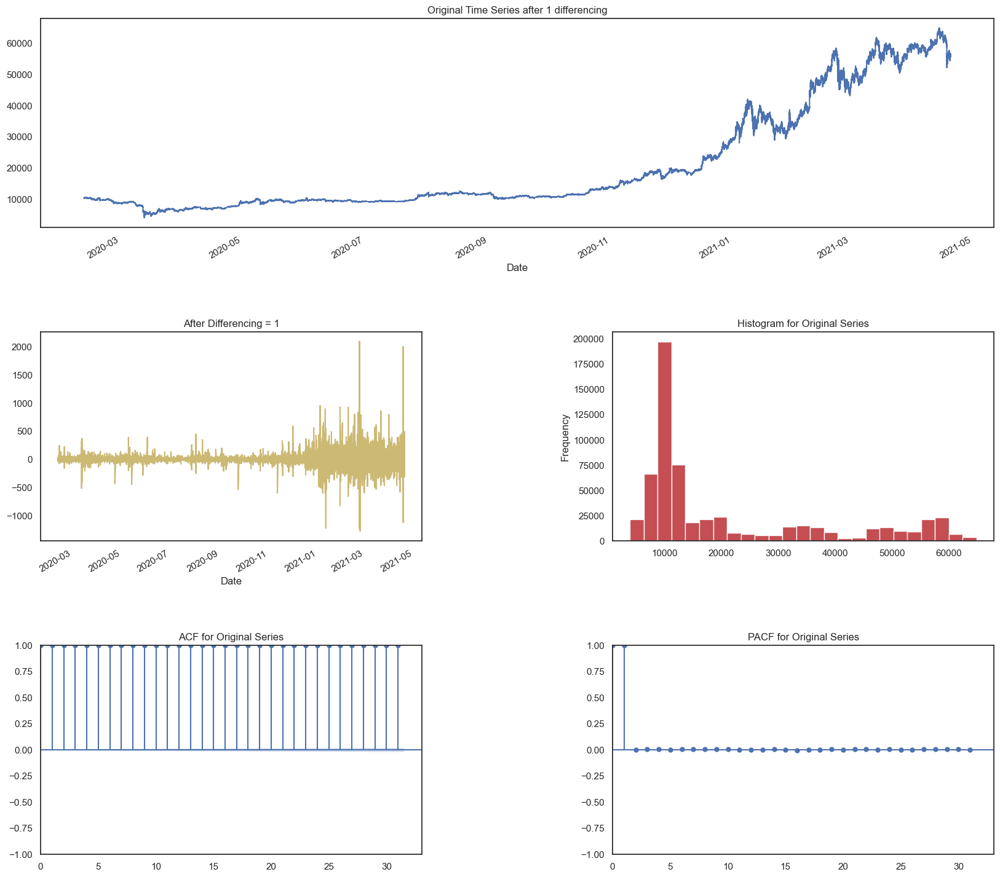

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


04:06:20 - cmdstanpy - INFO - Chain [1] start processing
04:06:44 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,955.40
    Std Deviation of actuals = 2.51
    Normalized RMSE (as pct of std dev) = 2185672%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


04:08:18 - cmdstanpy - INFO - Chain [1] start processing
04:08:42 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,108.30
    Std Deviation of actuals = 2.86
    Normalized RMSE (as pct of std dev) = 1925007%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


04:10:15 - cmdstanpy - INFO - Chain [1] start processing
04:10:40 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,045.45
    Std Deviation of actuals = 4.38
    Normalized RMSE (as pct of std dev) = 1255656%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


04:12:13 - cmdstanpy - INFO - Chain [1] start processing
04:12:38 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,148.18
    Std Deviation of actuals = 1.37
    Normalized RMSE (as pct of std dev) = 4024733%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


04:14:12 - cmdstanpy - INFO - Chain [1] start processing
04:14:36 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,876.19
    Std Deviation of actuals = 5.24
    Normalized RMSE (as pct of std dev) = 1046770%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 55024.73
    MSE (Mean Squared Error = 3027948062.34
    MAPE (Mean Absolute Percent Error) = 537%
    RMSE (Root Mean Squared Error) = 55026.7940
    Normalized RMSE (MinMax) = 153749%
    Normalized RMSE (as Std Dev of Actuals)= 443732%
Time Taken = 590 seconds


04:16:10 - cmdstanpy - INFO - Chain [1] start processing
04:16:35 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6042820.174
Static Forecasts:
    RMSE = 2.58
    Std Deviation of Actuals = 2.51
    Normalized RMSE (as pct of std dev) = 102.5%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6042865.483
Static Forecasts:
    RMSE = 7.49
    Std Deviation of Actuals = 2.86
    Normalized RMSE (as pct of std dev) = 261.8%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    F

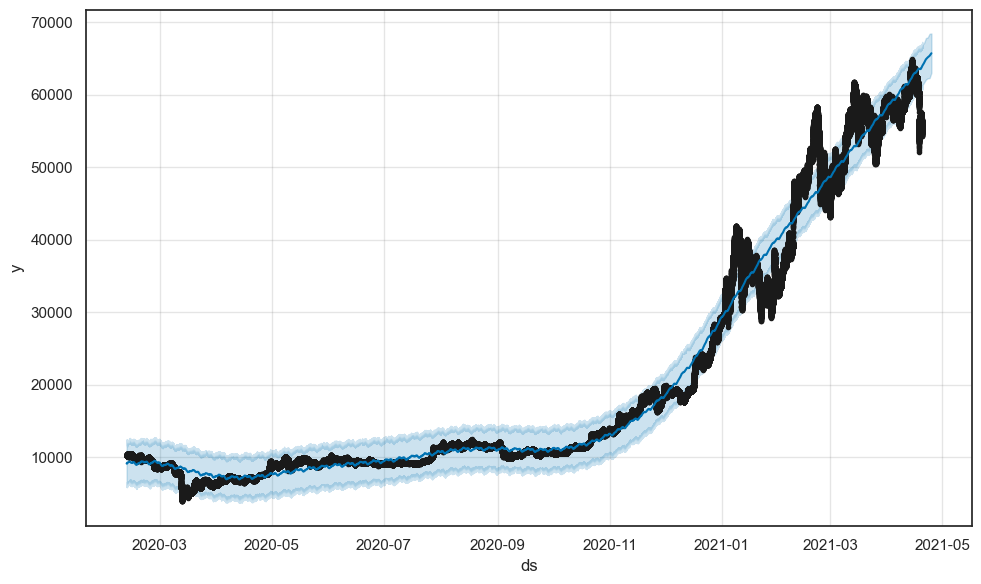

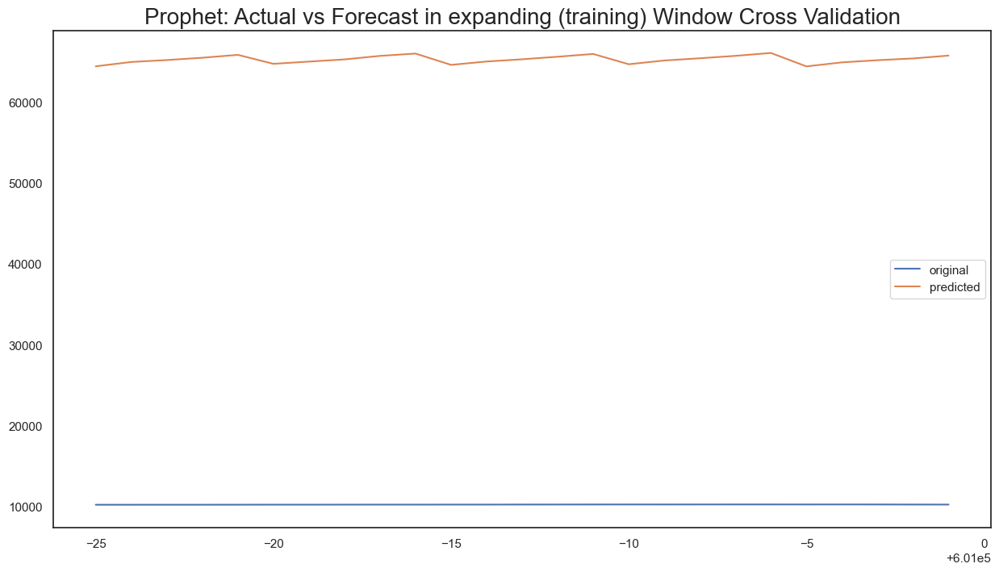

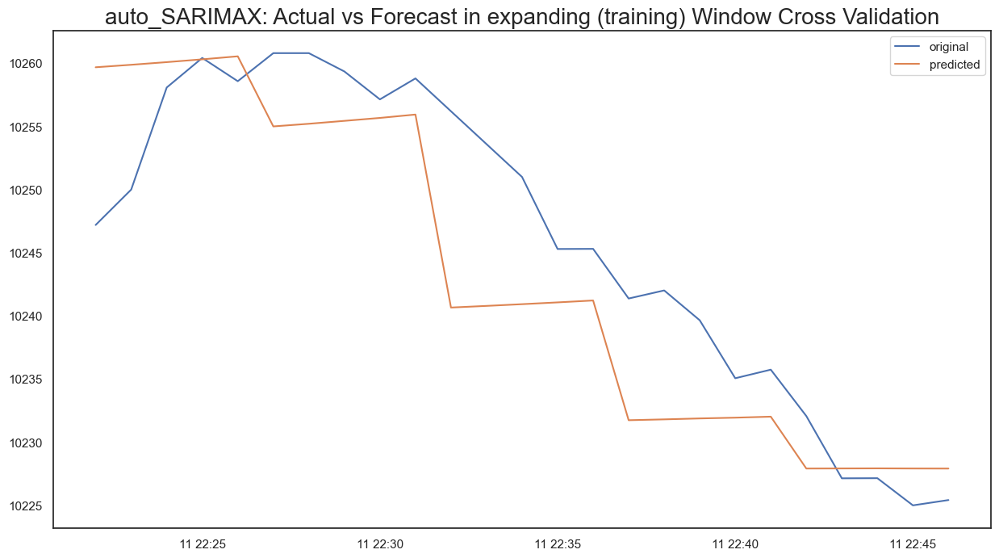

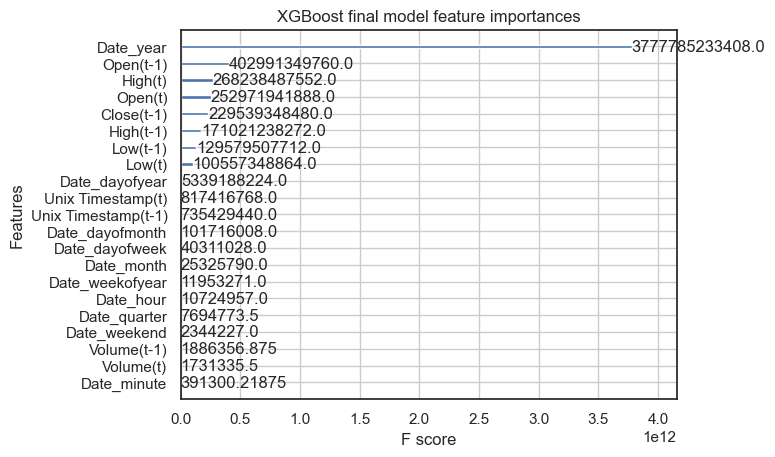

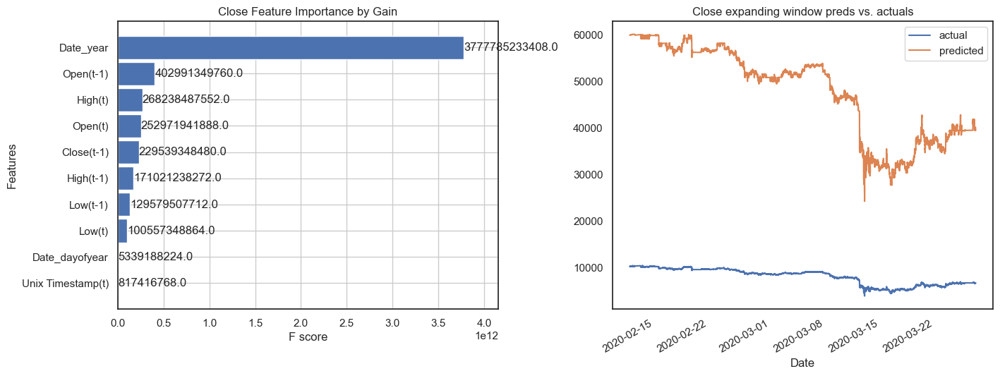

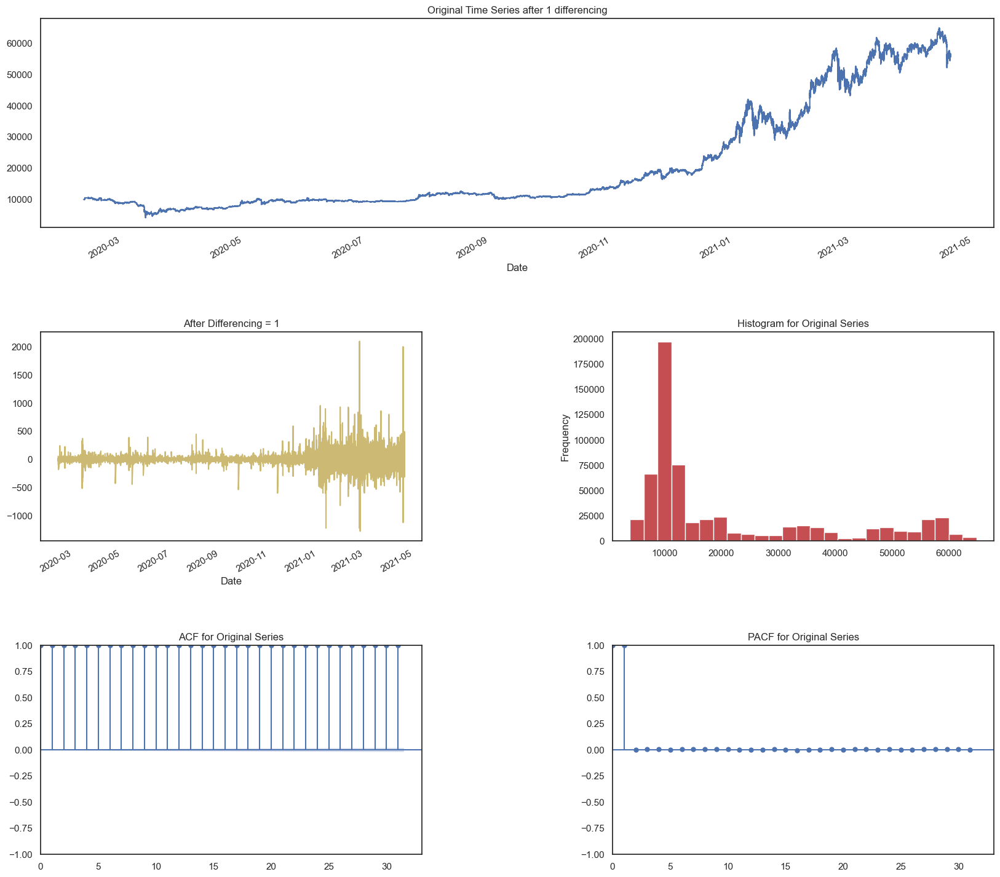

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


06:24:53 - cmdstanpy - INFO - Chain [1] start processing
06:25:17 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,824.31
    Std Deviation of actuals = 7.53
    Normalized RMSE (as pct of std dev) = 728407%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


06:26:52 - cmdstanpy - INFO - Chain [1] start processing
06:27:16 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,655.09
    Std Deviation of actuals = 5.05
    Normalized RMSE (as pct of std dev) = 1081463%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


06:28:51 - cmdstanpy - INFO - Chain [1] start processing
06:29:15 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,718.48
    Std Deviation of actuals = 1.89
    Normalized RMSE (as pct of std dev) = 2943389%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


06:30:49 - cmdstanpy - INFO - Chain [1] start processing
06:31:13 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,413.81
    Std Deviation of actuals = 5.26
    Normalized RMSE (as pct of std dev) = 1054028%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


06:32:47 - cmdstanpy - INFO - Chain [1] start processing
06:33:12 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,557.79
    Std Deviation of actuals = 0.00
    Normalized RMSE (as pct of std dev) = 1134068600%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 55231.88
    MSE (Mean Squared Error = 3050957893.51
    MAPE (Mean Absolute Percent Error) = 566%
    RMSE (Root Mean Squared Error) = 55235.4768
    Normalized RMSE (MinMax) = 217806%
    Normalized RMSE (as Std Dev of Actuals)= 640296%
Time Taken = 594 seconds


06:34:47 - cmdstanpy - INFO - Chain [1] start processing
06:35:11 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6042849.679
Static Forecasts:
    RMSE = 9.91
    Std Deviation of Actuals = 7.53
    Normalized RMSE (as pct of std dev) = 131.6%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6042895.048
Static Forecasts:
    RMSE = 5.07
    Std Deviation of Actuals = 5.05
    Normalized RMSE (as pct of std dev) = 100.4%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    F

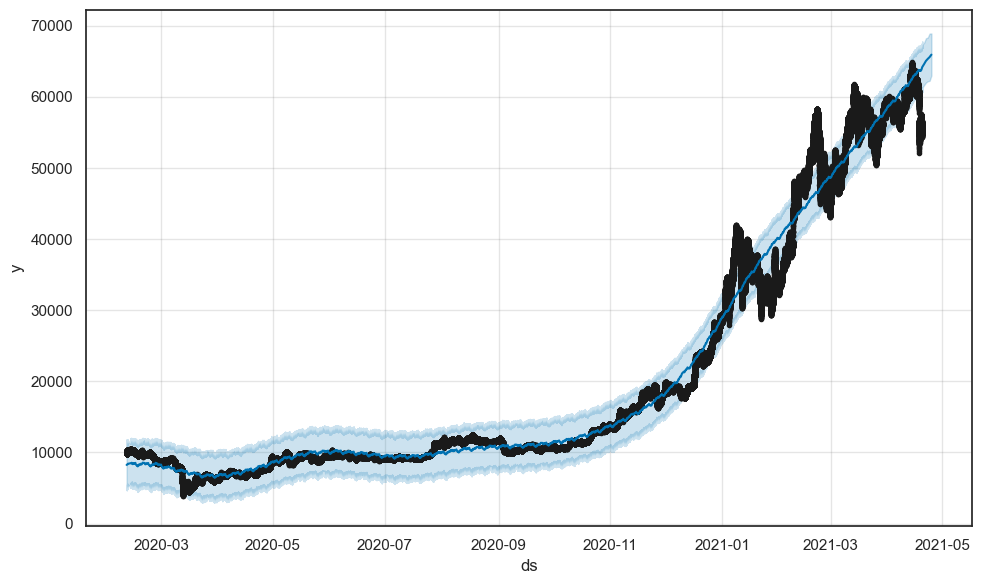

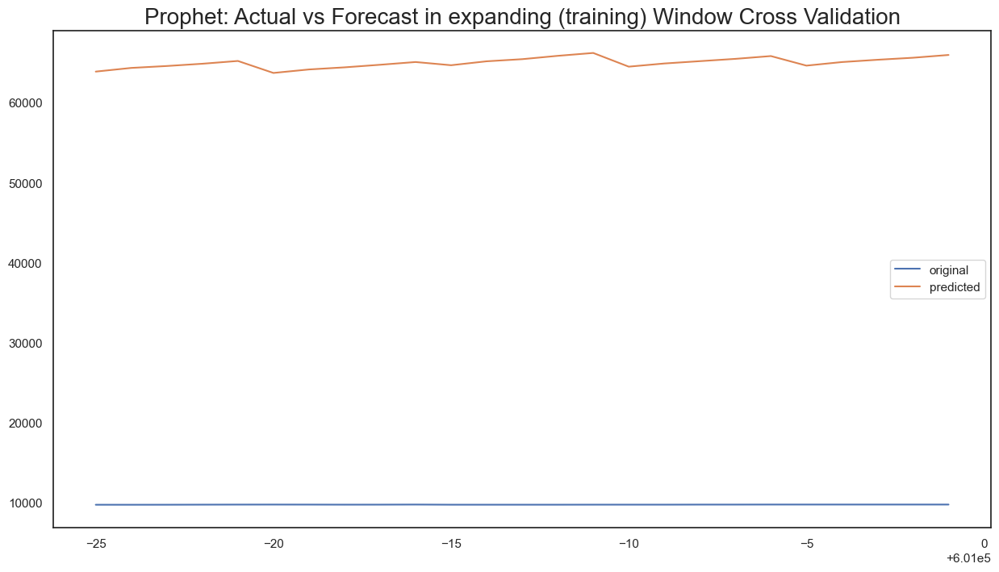

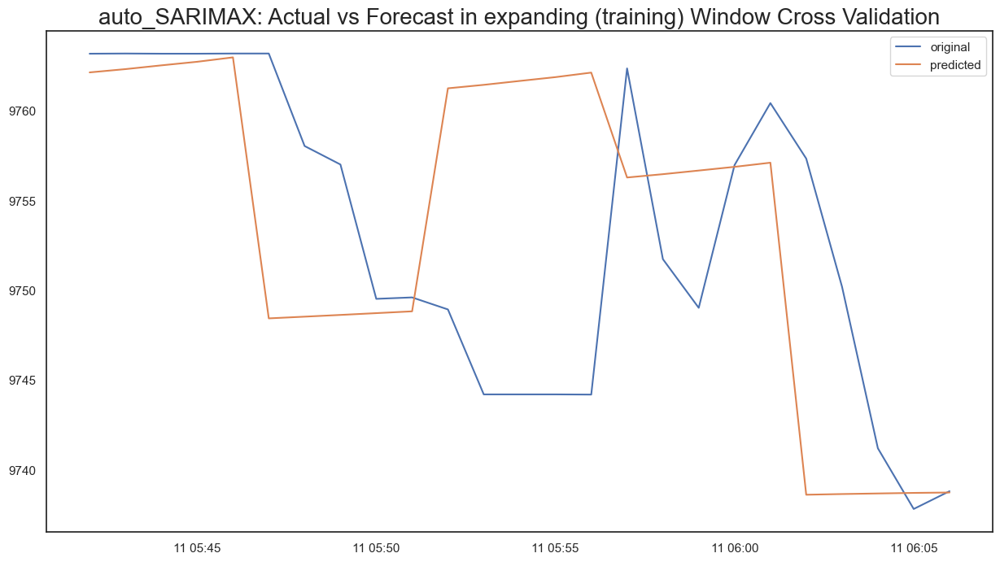

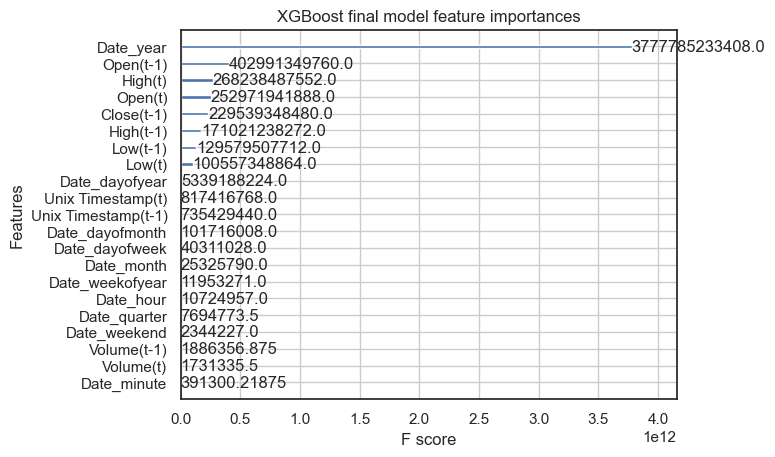

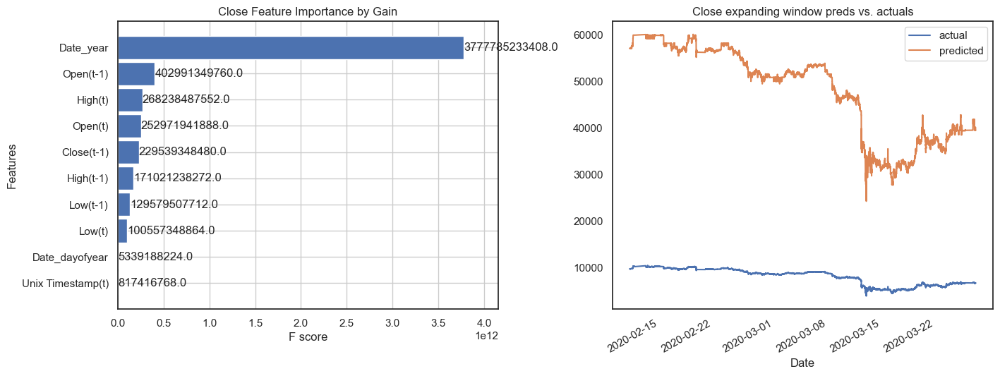

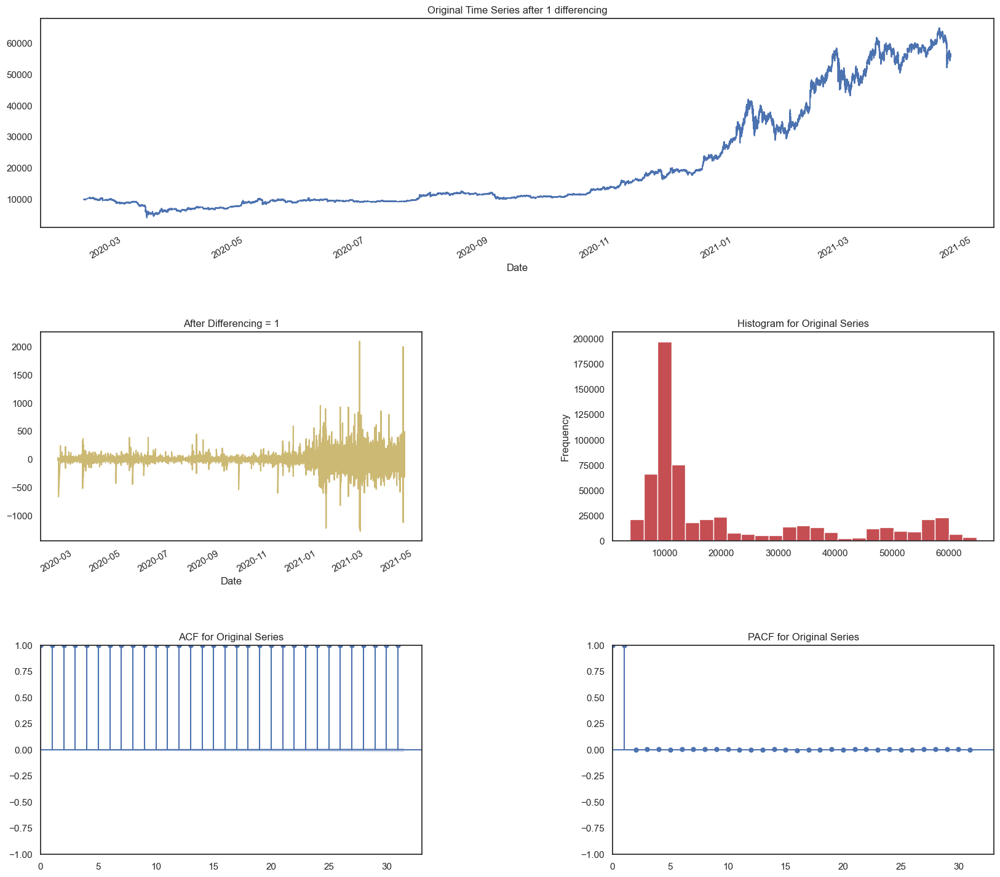

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


08:53:15 - cmdstanpy - INFO - Chain [1] start processing
08:53:39 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,679.88
    Std Deviation of actuals = 4.50
    Normalized RMSE (as pct of std dev) = 1214801%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


08:55:13 - cmdstanpy - INFO - Chain [1] start processing
08:55:37 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 56,006.55
    Std Deviation of actuals = 3.55
    Normalized RMSE (as pct of std dev) = 1579362%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


08:57:11 - cmdstanpy - INFO - Chain [1] start processing
08:57:36 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,423.75
    Std Deviation of actuals = 4.78
    Normalized RMSE (as pct of std dev) = 1138887%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


08:59:11 - cmdstanpy - INFO - Chain [1] start processing
08:59:35 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,759.16
    Std Deviation of actuals = 5.62
    Normalized RMSE (as pct of std dev) = 974163%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


09:01:09 - cmdstanpy - INFO - Chain [1] start processing
09:01:34 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,586.74
    Std Deviation of actuals = 4.76
    Normalized RMSE (as pct of std dev) = 1167687%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 55089.25
    MSE (Mean Squared Error = 3035403657.96
    MAPE (Mean Absolute Percent Error) = 560%
    RMSE (Root Mean Squared Error) = 55094.4975
    Normalized RMSE (MinMax) = 215972%
    Normalized RMSE (as Std Dev of Actuals)= 800348%
Time Taken = 593 seconds


09:03:09 - cmdstanpy - INFO - Chain [1] start processing
09:03:33 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043117.864
Static Forecasts:
    RMSE = 4.72
    Std Deviation of Actuals = 4.50
    Normalized RMSE (as pct of std dev) = 104.9%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043163.307
Static Forecasts:
    RMSE = 4.26
    Std Deviation of Actuals = 3.55
    Normalized RMSE (as pct of std dev) = 120.2%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    F

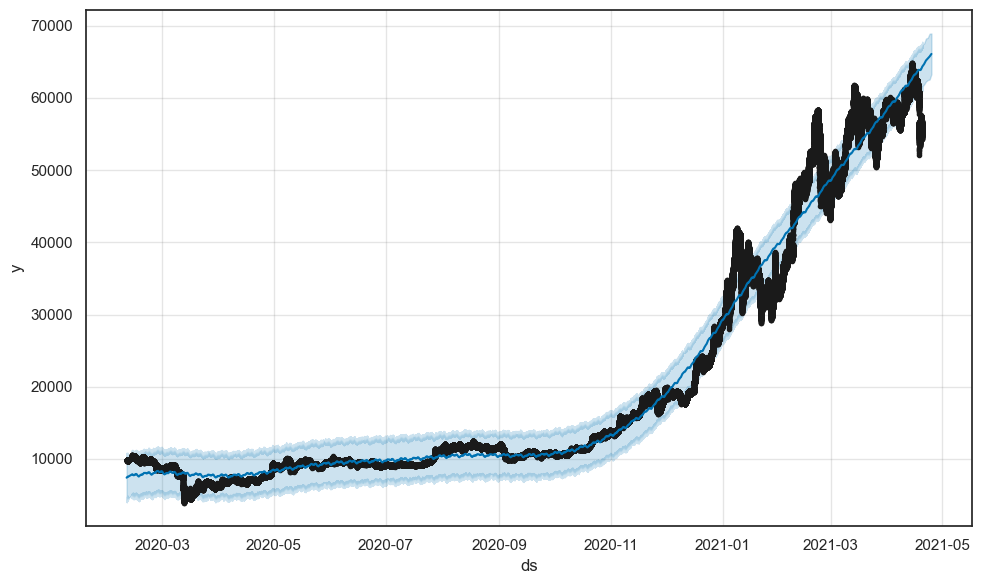

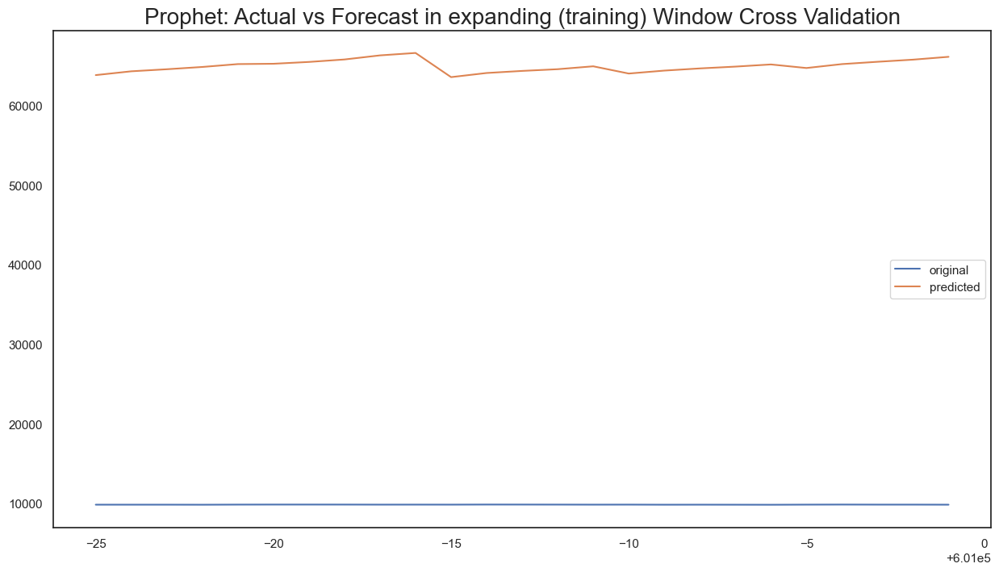

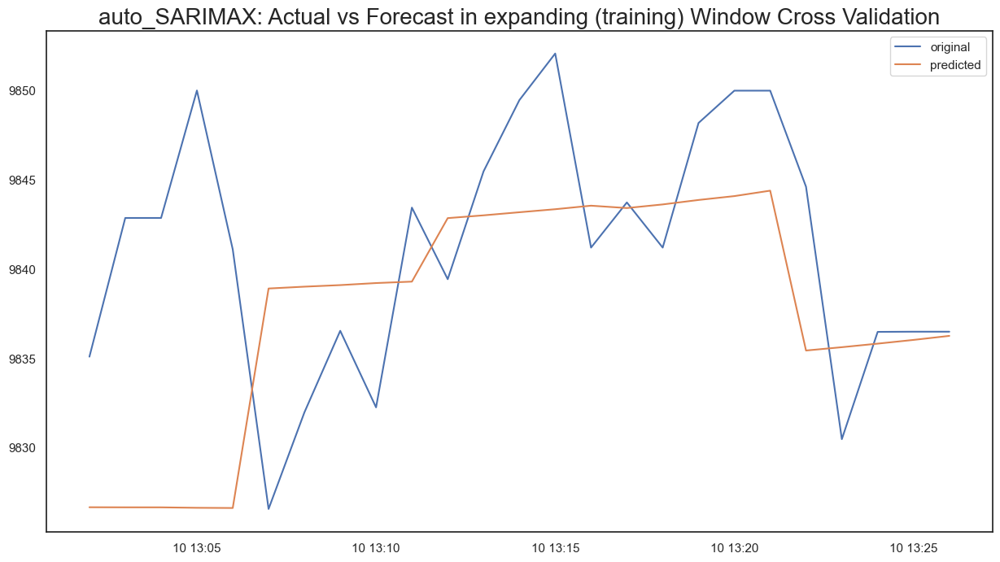

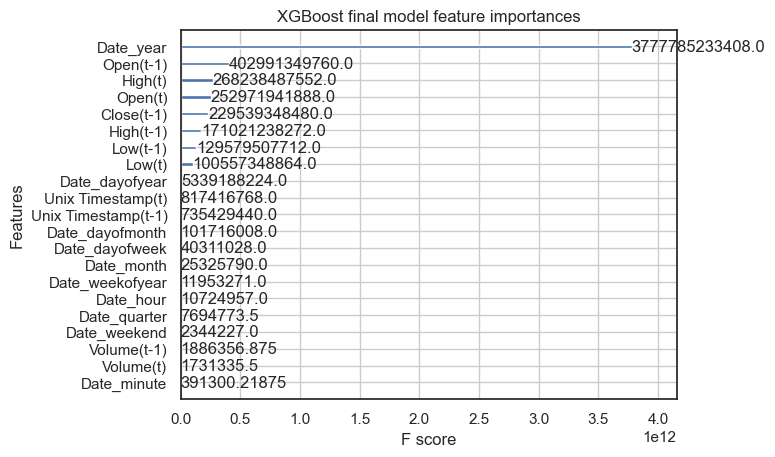

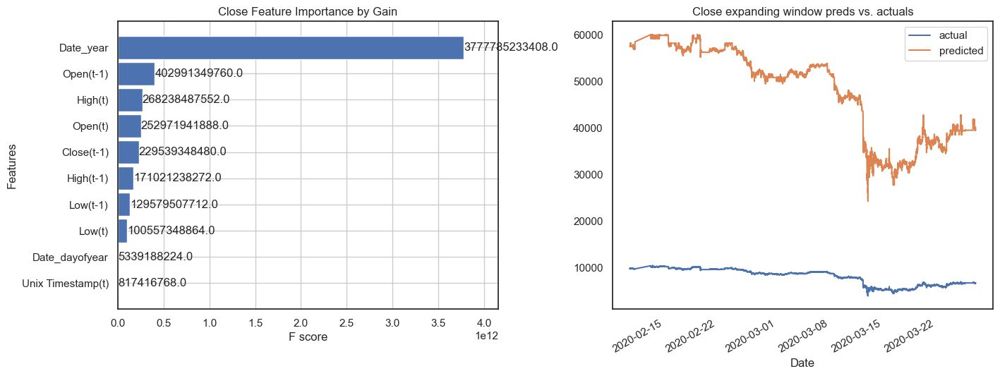

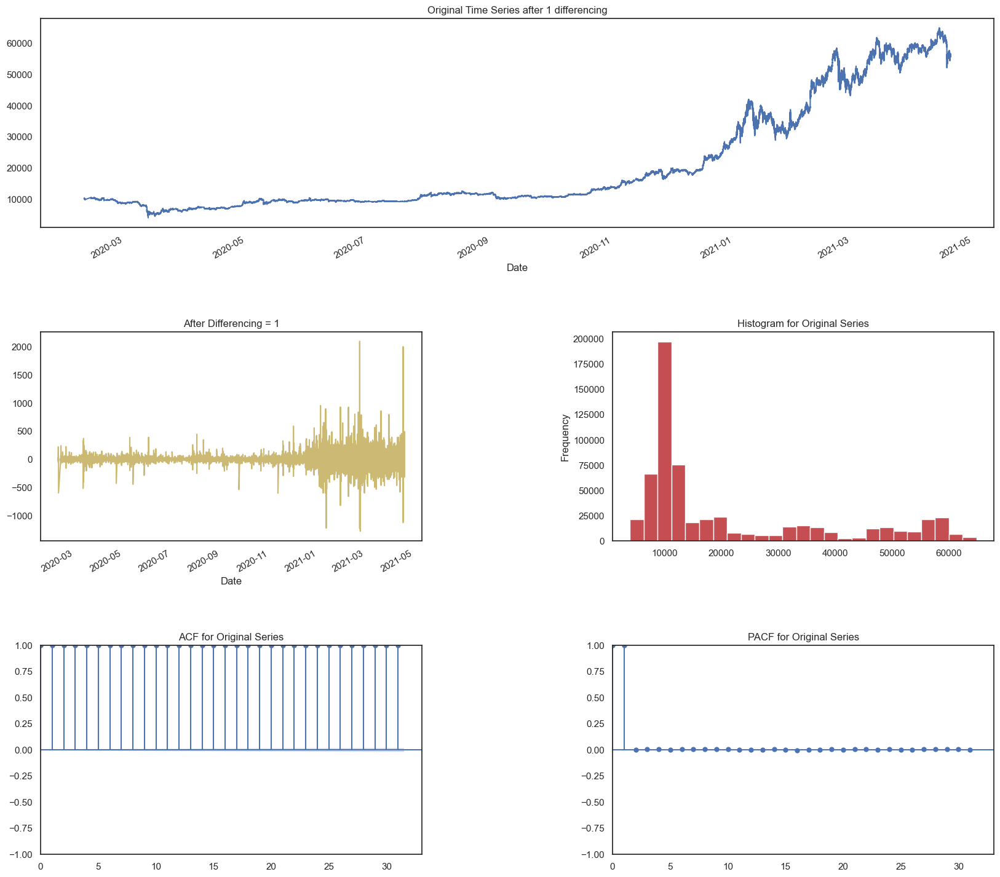

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(601000, 7)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5


11:16:13 - cmdstanpy - INFO - Chain [1] start processing
11:16:39 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,532.91
    Std Deviation of actuals = 2.69
    Normalized RMSE (as pct of std dev) = 2027112%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5


11:18:18 - cmdstanpy - INFO - Chain [1] start processing
11:18:43 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,547.30
    Std Deviation of actuals = 5.39
    Normalized RMSE (as pct of std dev) = 1030567%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5


11:20:23 - cmdstanpy - INFO - Chain [1] start processing
11:20:47 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,677.12
    Std Deviation of actuals = 1.86
    Normalized RMSE (as pct of std dev) = 2947376%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 600990 Test Shape: 5


11:22:28 - cmdstanpy - INFO - Chain [1] start processing
11:22:53 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 55,335.84
    Std Deviation of actuals = 2.87
    Normalized RMSE (as pct of std dev) = 1927229%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 600995 Test Shape: 5


11:24:33 - cmdstanpy - INFO - Chain [1] start processing
11:24:59 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 54,539.92
    Std Deviation of actuals = 2.00
    Normalized RMSE (as pct of std dev) = 2731493%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 54924.55
    MSE (Mean Squared Error = 3017117086.65
    MAPE (Mean Absolute Percent Error) = 546%
    RMSE (Root Mean Squared Error) = 54928.2904
    Normalized RMSE (MinMax) = 206653%
    Normalized RMSE (as Std Dev of Actuals)= 718637%
Time Taken = 628 seconds


11:26:41 - cmdstanpy - INFO - Chain [1] start processing
11:27:05 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit


Building Auto SARIMAX Model



Running Auto SARIMAX Model...


Best Parameters:
p: None, d: None, q: None
P: None, D: None, Q: None
Seasonality: False
Seasonal Period: 12

Fold Number: 1 --> Train Shape: 600975 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043104.280
Static Forecasts:
    RMSE = 3.33
    Std Deviation of Actuals = 2.69
    Normalized RMSE (as pct of std dev) = 123.9%

Fold Number: 2 --> Train Shape: 600980 Test Shape: 5

    Finding the best parameters using AutoArima:
    Using smaller parameters for larger dataset with greater than 1000 samples

Best model is a Seasonal SARIMAX(2,1,2)*(0,0,0,12), aic = 6043149.603
Static Forecasts:
    RMSE = 9.27
    Std Deviation of Actuals = 5.39
    Normalized RMSE (as pct of std dev) = 171.9%

Fold Number: 3 --> Train Shape: 600985 Test Shape: 5

    F

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from auto_ts import auto_timeseries

# Прочитаем данные
df = pd.read_csv('C://Users//Vlada//Documents//Business//AI//bitcoin.csv')

# Преобразуем дату
df['Date'] = pd.to_datetime(df['Date'])

# Разделим данные на тренировочную и проверочную выборки
train, val = df.iloc[:600000], df.iloc[600000:]

# Удаляем ненужный столбец
train = train.drop(columns=['Symbol'], errors='ignore')

# Параметры
N = 1000  # Количество экземпляров, которые будем добавлять
model = auto_timeseries(score_type='rmse',
                        time_interval='D',
                        model_type='best',
                        verbose=1)

# Список для хранения предсказаний
predictions = []

# Обучение модели с динамическим добавлением данных
for i in range(0, len(val), N):
    # Добавляем N новых экземпляров в тренировочную выборку
    current_train = pd.concat([train, val.iloc[i:i+N]])
    current_train = current_train.drop(columns=['Symbol'], errors='ignore')
    
    # Обучаем модель
    model.fit(traindata=current_train,
              ts_column='Date',
              target='Close')

    # Прогнозируем для оставшейся части проверочной выборки
    pred = model.predict(val.iloc[i+N:], model='best')['yhat'].to_numpy(float)

    # Сохраняем предсказания
    predictions.extend(pred)

# Составной прогноз для всех N
compound_predictions = predictions

# Прогноз для всей проверочной выборки, используя одну модель
model.fit(traindata=train, ts_column='Date', target='Close')
single_model_pred = model.predict(val, model='best')['yhat'].to_numpy(float)

# График
plt.figure(figsize=(20, 10))

# Реальные значения
plt.plot(val['Date'], val['Close'], label='Реальные данные', color='blue')

# Прогноз одной модели
plt.plot(val['Date'], single_model_pred, label='Прогноз одной модели', color='orange')

# Составной прогноз
plt.plot(val['Date'].iloc[N:], compound_predictions, label='Составной прогноз', color='green')

# Настройка графика
plt.legend()
plt.grid()
plt.title('Сравнение прогноза с реальными данными')
plt.xlabel('Дата')
plt.ylabel('Цена (Close)')
plt.show()
